In [99]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib
import geopandas as gpd
import folium
from shapely.geometry import Point
import numpy as np
import json
import requests
from base64 import b64encode
import zipfile
import io
import statsmodels.formula.api as smf
import linearmodels.panel as plm
from linearmodels.panel import PanelOLS
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.stats import gaussian_kde
from sklearn.neighbors import KernelDensity
import libpysal
# from esda import getisord
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
from libpysal.weights import DistanceBand
import gc
from pathlib import Path
from esda import G_Local
from statsmodels.discrete.count_model import ZeroInflatedNegativeBinomialP
from statsmodels.discrete.discrete_model import NegativeBinomial
import scipy.stats as stats
from esda.moran import Moran
from esda.plot import moran_scatterplot

import psutil
import sys
import gc
import geopandas as gpd
import pandas as pd
import numpy as np
from scipy import stats
from libpysal.weights import Queen
import spreg
from spreg import GM_Error
from shapely.geometry import Polygon, MultiPolygon
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import esda
from libpysal.weights import KNN
import geopandas as gpd
import pandas as pd
import numpy as np
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
from sklearn.preprocessing import StandardScaler
import pandas as pd
import statsmodels.api as sm
import pandas as pd
import statsmodels.api as sm
from spreg import OLS


from esda.moran import Moran_Local
from scipy.stats import boxcox
from scipy.stats import rankdata, norm
import matplotlib.pyplot as plt
import os
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.lines import Line2D
from shapely.geometry import Polygon, MultiPolygon

ModuleNotFoundError: No module named 'esda.plot'

In [98]:
%pip install splot

Note: you may need to restart the kernel to use updated packages.


# 1. Data Loading

## 1.1 Boundaries

### 1.1.1 LSOAs (2001, 2011, 2021)
https://geoportal.statistics.gov.uk/datasets/ons::lower-layer-super-output-areas-december-2001-boundaries-ew-bfc/about
https://geoportal.statistics.gov.uk/datasets/ons::lower-layer-super-output-areas-december-2011-boundaries-ew-bfc-v3/about
https://geoportal.statistics.gov.uk/datasets/ons::lower-layer-super-output-areas-december-2021-boundaries-ew-bfc-v10-2/about

In [2]:
# filepaths

lsoa_2011_path = './Data/Boundary/LSOA_Dec_2011_EW_BFC_2022/LSOA_2011_EW_BFC_V3.shp'
lsoa_2011_bfe_path = './Data/Boundary/LSOA_Dec_2011_EW_BFE_2022/LSOA_2011_EW_BFE_V3.shp'

# read in data

lsoa_2011 = gpd.read_file(lsoa_2011_path)
lsoa_2011_bfe = gpd.read_file(lsoa_2011_bfe_path)

# Set a consistent CRS
lsoa_2011 = lsoa_2011.to_crs(epsg=27700)
lsoa_2011_bfe = lsoa_2011_bfe.to_crs(epsg=27700)

In [3]:
# adding yearly lsoas (e.g. LSOA1, 2002; LSOA1, 2003; etc)

# create a list of years
years = list(range(1995, 2025))

# duplicate each LSOA for each year
lsoa_2011_repeated = pd.concat([lsoa_2011.assign(year=year) for year in years], ignore_index=True)

# convert back to GeoDataFrame with same CRS
lsoa_2011_gdp = gpd.GeoDataFrame(lsoa_2011_repeated, geometry='geometry', crs=lsoa_2011.crs)

### 1.1.2 Lookup Tables

#### Postcode


#### LSOA 2001 > 2011

- U - No Change from 2001 to 2011. This means that direct comparisons can be made between these 2001 and 2011 LSOA. 
- S - Split. This means that the 2001 LSOA has been split into two or more 2011 LSOA. There will be one record for each of the 2011 LSOA that the 2001 LSOA has been split into. This means direct comparisons can be made between estimates for the single 2001 LSOA and the estimates from the aggregated 2011 LSOA. 
- M - Merged. 2001 LSOA have been merged with another one or more 2001 LSOA to form a single 2011 LSOA. This means direct comparisons can be made between the aggregated 2001 LSOAs’ estimates and the single 2011 LSOA’s estimates. 
- X - The relationship between 2001 and 2011 LSOA is irregular and fragmented. This has occurred where 2001 LSOA have been redesigned because of local authority district boundary changes, or to improve their social homogeneity. These can’t be easily mapped to equivalent 2011 LSOA like the regular splits (S) and merges (M), and therefore like for like comparisons of estimates for 2001 LSOA and 2011 LSOA are not possible. Each 2001 LSOA with an ‘X’ code is best-fitted to a 2011 LSOA by plotting the 2001 LSOA’s centroid into a 2011 LSOA boundary. However, this does not imply an exclusive 1:1 relationship with a 2011 LSOA, as it will also have a relationship with fragments of other 2011 LSOA; the lookup is provided here so that all 2001 LSOA are included in the lookup

In [4]:
### POSTCODE ###

# url to nspl download link
url = "https://www.arcgis.com/sharing/rest/content/items/9af3680ec3e24258b56687db1a42847e/data"

# download the zip file content
response = requests.get(url)
response.raise_for_status()  

# open it as a zip file in memory
with zipfile.ZipFile(io.BytesIO(response.content)) as z:
    # list files to confirm the path (optional)
    #print("Files in ZIP:", z.namelist())

    # read csv into a df
    with z.open("NSPCL_AUG20_UK_LU.csv") as f:
        onspd_df = pd.read_csv(f, encoding='latin1')  

# preview loaded data
print(onspd_df.head())

# clean postcodes: remove spaces and uppercase for consistency
onspd_df['pcds'] = onspd_df['pcds'].str.replace(" ", "").str.upper()
postcode_lookup = onspd_df[['pcds', 'lsoa11cd']].dropna().drop_duplicates()
postcode_lookup = postcode_lookup.rename(columns={'pcds': 'postcode', 'lsoa11cd': 'LSOA11CD'}) # Rename for consistency
print(postcode_lookup)

C:\Users\aaron\AppData\Local\Temp\ipykernel_27800\933684279.py:17: DtypeWarning: Columns (22) have mixed types. Specify dtype option on import or set low_memory=False.
  onspd_df = pd.read_csv(f, encoding='latin1')  # encoding often needed for special chars


      pcd7      pcd8     pcds  dointr    doterm  usertype  oseast1m  osnrth1m  \
0  AB1 0AA  AB1  0AA  AB1 0AA  198001  199606.0         0  385386.0  801193.0   
1  AB1 0AB  AB1  0AB  AB1 0AB  198001  199606.0         0  385177.0  801314.0   
2  AB1 0AD  AB1  0AD  AB1 0AD  198001  199606.0         0  385053.0  801092.0   
3  AB1 0AE  AB1  0AE  AB1 0AE  199402  199606.0         0  384600.0  799300.0   
4  AB1 0AF  AB1  0AF  AB1 0AF  199012  199207.0         1  384460.0  800660.0   

      oa11cd oac11cd  ...                                   lsoa11nm  \
0  S00090303     1C3  ...  Cults, Bieldside and Milltimber West - 02   
1  S00090303     1C3  ...  Cults, Bieldside and Milltimber West - 02   
2  S00090399     6A1  ...  Cults, Bieldside and Milltimber West - 02   
3  S00091322     1A2  ...           Dunecht, Durris and Drumoak - 01   
4  S00090299     6A4  ...                                Culter - 06   

    msoa11cd                              msoa11nm soac11cd  \
0  S02001237  Cul

In [5]:
### LSOA ###

# filepaths
lookup_2001_2011_path = 'https://open-geography-portalx-ons.hub.arcgis.com/api/download/v1/items/3dd1bc5dd053426aa84a068c7afbb3b2/csv?layers=0'
lookup_2011_2021_path = 'https://open-geography-portalx-ons.hub.arcgis.com/api/download/v1/items/cbfe64cc03d74af982c1afec639bafd1/csv?layers=0'

# read data

lookup_2001_2011 = pd.read_csv(lookup_2001_2011_path)
lookup_2011_2021 = pd.read_csv(lookup_2011_2021_path)

#lookup_2011_2021[lookup_2011_2021['CHGIND'] == 'X']

### 1.1.3 UK (England) Boundary

https://www.data.gov.uk/dataset/2e17269d-10b9-4e43-b67b-57f9b02bd0f8/countries-december-2021-boundaries-uk-buc

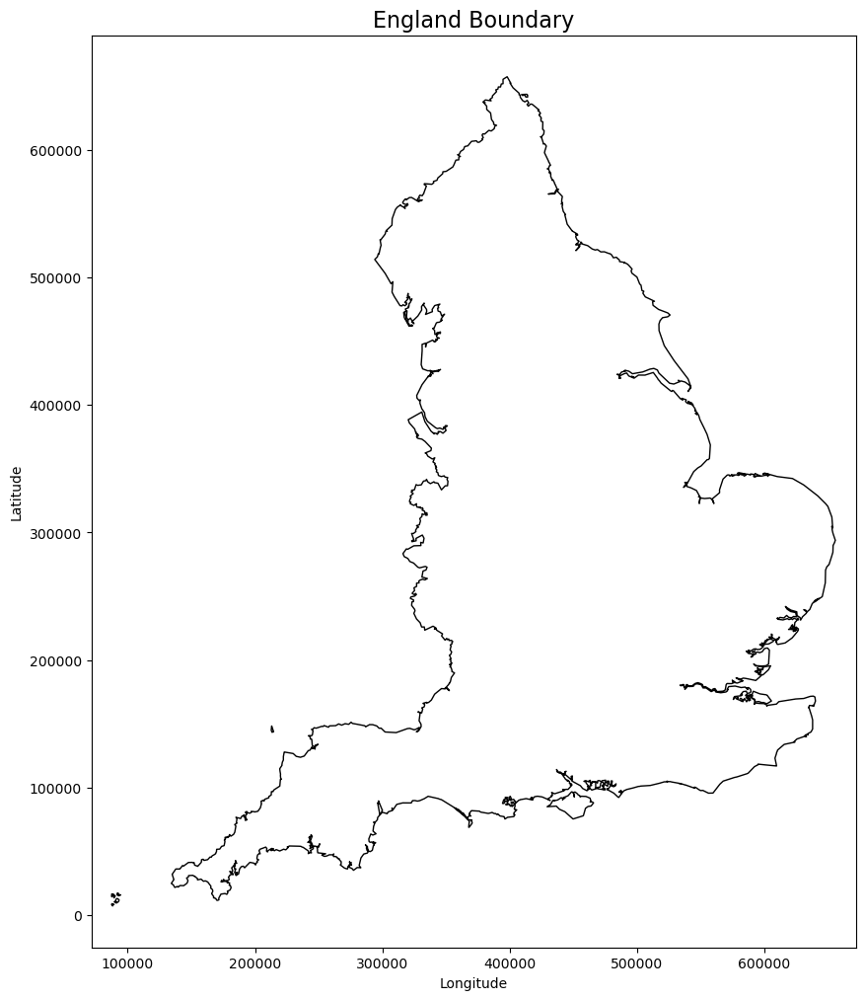

In [7]:
uk_boundary = gpd.read_file('./Data/Boundary/uk_countries/CTRY_DEC_2021_UK_BUC.shp')
england = uk_boundary[uk_boundary['CTRY21NM'] == 'England']
del uk_boundary

# plot england boundary
fig, ax = plt.subplots(figsize=(10, 12))
england.boundary.plot(ax=ax, color='black', linewidth=1)
ax.set_title('England Boundary', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.axis('equal')
plt.show()

## 1.2 Vineyards (Dependent Variable)

In [8]:
# create filepaths for the data

stephen_skelton_data_filepath = './Data/VineyardData/100_EnglishWineVineyardDatabase-StephenSkelton.xlsx'


# read in the data

ss_data = pd.read_excel(stephen_skelton_data_filepath, sheet_name= 'Sheet1')


# rename columns

Vineyards = ss_data.rename(columns={
    'Vineyard / Winery' : 'Type',
    'Vineyard County' : 'County',
    'Vineyard Postcode' : 'postcode',
    'Ha Planted' : 'AreaPlanted',
    'First Planted' : 'YearFirstPlanted',
    'Org/Bio' : 'Org_Bio'
})

In [9]:
# map vineyards to lsoas

# clean postcode for join
Vineyards['postcode'] = Vineyards['postcode'].str.replace(" ", "").str.upper()
onspd_df['pcds'] = onspd_df['pcds'].str.replace(" ", "").str.upper()

# create postcode lookup
postcode_lookup = onspd_df[['pcds', 'lsoa11cd', 'lsoa11nm']].dropna().drop_duplicates()
postcode_lookup.columns = ['postcode', 'LSOA11CD', 'LSOA11NM']

# merge vineyard > lsoa
Vineyards = Vineyards.merge(postcode_lookup, on='postcode', how='left')

# create coordinate lookup (from onspd)
coord_lookup = onspd_df[['pcds', 'osnrth1m', 'oseast1m']].dropna().drop_duplicates()
coord_lookup.columns = ['postcode', 'northing', 'easting']

# merge vineyard > coordinates
Vineyards = Vineyards.merge(coord_lookup, on='postcode', how='left')

# create vineyard point GeoDataFrame
Vineyards['geometry'] = Vineyards.apply(lambda row: Point(row['easting'], row['northing']), axis=1)
vineyard_points_gdf = gpd.GeoDataFrame(Vineyards, geometry='geometry', crs='EPSG:27700')  # BNG

#remove vineyards with no area or no valid geometry
vineyard_points_gdf = vineyard_points_gdf[
    (vineyard_points_gdf['AreaPlanted'] > 0) &
    (~vineyard_points_gdf['geometry'].is_empty) &
    (vineyard_points_gdf['geometry'].notnull())
].copy()

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\geopandas\geoseries.py:766: UserWarning: GeoSeries.notna() previously returned False for both missing (None) and empty geometries. Now, it only returns False for missing values. Since the calling GeoSeries contains empty geometries, the result has changed compared to previous versions of GeoPandas.
Given a GeoSeries 's', you can use '~s.is_empty & s.notna()' to get back the old behaviour.

To further ignore this warning, you can do: 
import warnings; warnings.filterwarnings('ignore', 'GeoSeries.notna', UserWarning)
  return self.notna()


In [10]:
vineyard_points_gdf['easting'].isna().sum()

0

In [11]:
vineyard_points_gdf.columns

Index(['Name', 'Type', 'County', 'Region', 'postcode', 'X (easting) [added]',
       'Y (northing) [added]', 'Latitude [added]', 'Longitude [added]',
       'Country', 'Website', 'Grapes', 'AreaPlanted', 'YearFirstPlanted',
       'Org_Bio', 'Open To Public', 'Postcode [added]', 'Description [added]',
       'Grid Reference [added]', 'LSOA11CD', 'LSOA11NM', 'northing', 'easting',
       'geometry'],
      dtype='object')

In [12]:
# cumulatively add up vineyard data over years

# drop vineyards with no planting year
Vineyards = Vineyards.dropna(subset=['YearFirstPlanted'])

# ensure year is integer
Vineyards['YearFirstPlanted'] = Vineyards['YearFirstPlanted'].astype(int)

# define year range
year_range = range(Vineyards['YearFirstPlanted'].min(), 2024 + 1)  # up to 2024

# expand each vineyard into one row per year (YearFirstPlanted > 2024)
expanded_rows = []

for _, row in Vineyards.iterrows():
    for year in year_range:
        if year >= row['YearFirstPlanted']:
            expanded_rows.append({
                'LSOA11CD': row['LSOA11CD'],
                'LSOA11NM': row['LSOA11NM'],
                'year': year,
                'AreaPlanted': row['AreaPlanted'] if not pd.isna(row['AreaPlanted']) else 0
            })

vineyard_expanded = pd.DataFrame(expanded_rows)

In [13]:
# summarise for years and lsoas

vineyard_summary = vineyard_expanded.groupby(['LSOA11CD', 'LSOA11NM', 'year']).agg(
    vineyard_count=('AreaPlanted', 'count'),
    vineyard_area=('AreaPlanted', 'sum')
).reset_index()

In [14]:
vineyard_summary[(vineyard_summary['vineyard_count'] > 5) & (vineyard_summary['year'] > 2010)]

,LSOA11CD,LSOA11NM,year,vineyard_count,vineyard_area
166945,E01021026,Lewes 002B,2016,6,33.2551
166946,E01021026,Lewes 002B,2017,6,33.2551
166947,E01021026,Lewes 002B,2018,6,33.2551
166948,E01021026,Lewes 002B,2019,6,33.2551
166949,E01021026,Lewes 002B,2020,6,33.2551
166950,E01021026,Lewes 002B,2021,6,33.2551
166951,E01021026,Lewes 002B,2022,6,33.2551
166952,E01021026,Lewes 002B,2023,6,33.2551
166953,E01021026,Lewes 002B,2024,6,33.2551
206318,E01021875,Maldon 007C,2020,6,94.7940


In [15]:
vineyard_summary

,LSOA11CD,LSOA11NM,year,vineyard_count,vineyard_area
0,E01000689,Bromley 002A,2023,1,2.043
1,E01000689,Bromley 002A,2024,1,2.043
2,E01000749,Bromley 036A,1982,1,0.660
3,E01000749,Bromley 036A,1983,1,0.660
4,E01000749,Bromley 036A,1984,1,0.660
...,...,...,...,...,...
474103,W01001906,Powys 001F,2020,1,1.200
474104,W01001906,Powys 001F,2021,1,1.200
474105,W01001906,Powys 001F,2022,1,1.200
474106,W01001906,Powys 001F,2023,1,1.200


---

## 1.3 SocioEconomic Data (Independent Variables)

### 1.3.1 IMD

2000 - Index of Deprivation 2000, DETR (now part of DLUHC)  
https://webarchive.nationalarchives.gov.uk/ukgwa/20100407204456/http://www.communities.gov.uk/archived/general-content/communities/indicesofdeprivation/indicesofdeprivation/  
[no longer using]


2004 - ID 2004, ODPM  
https://webarchive.nationalarchives.gov.uk/ukgwa/20100407164233/http://www.communities.gov.uk/archived/general-content/communities/indicesofdeprivation/216309/


2007 - IMD 2007, CLG  
https://webarchive.nationalarchives.gov.uk/ukgwa/20100411141238/http://www.communities.gov.uk/communities/neighbourhoodrenewal/deprivation/deprivation07/


2010 - IMD 2010, DCLG  


2015 - IMD 2015, DCLG  


2019 - IMD 2019, MHCLG (now DLUHC)  


2004/2007/2010/2015/2019 - CDRC  
https://data.cdrc.ac.uk/dataset/index-multiple-deprivation-imd

In [16]:
# create filepaths

imd_2000_path = 'https://webarchive.nationalarchives.gov.uk/ukgwa/20100407204456mp_/http://www.communities.gov.uk/documents/citiesandregions/xls/131300.xls'
#imd_2004_path = 'https://webarchive.nationalarchives.gov.uk/ukgwa/20100407164233mp_/http://www.communities.gov.uk/documents/communities/xls/lasummaries2004.xls'
imd_2004_2007_2010_path = './Data/SocioEconomic/201_imd_eng_2004_2007_2010_LSOA01.csv'
imd_2010_2015_path = './Data/SocioEconomic/202_imd2010adj_2015.csv'
imd_2019_path = './Data/SocioEconomic/203_File_7_-_All_IoD2019_Scores__Ranks__Deciles_and_Population_Denominators_3.csv'


# read in data

imd_2000 = pd.read_excel(imd_2000_path, sheet_name='District level summaries of IMD')
# imd_2004 = pd.read_excel(imd_2004_path)
imd_2004_2007_2010 = pd.read_csv(imd_2004_2007_2010_path)
base_cols1 = ["LSOA", "LA CODE", "LA NAME", "GOR CODE", "GOR NAME"]
def filter_imd_by_year(df, year):                                         # Function to create a year-specific DataFrame
    year_cols = [col for col in df.columns if col.startswith(str(year))]
    return df[base_cols1 + year_cols].copy()
imd_2004 = filter_imd_by_year(imd_2004_2007_2010, 2004)                   # Create separate DataFrames
imd_2007 = filter_imd_by_year(imd_2004_2007_2010, 2007)
imd_2010 = filter_imd_by_year(imd_2004_2007_2010, 2010)
imd_2010_2015 = pd.read_csv(imd_2010_2015_path)
base_cols2 = ["LSOA code (2011)", "LSOA name (2011)", "Local Authority District code (2013)", "Local Authority District name (2013)"]
def filter_imd_by_year(df, year):                                         # Function to create a year-specific DataFrame
    year_cols = [col for col in df.columns if col.startswith(str(year))]
    return df[base_cols2 + year_cols].copy()
imd_2010 = filter_imd_by_year(imd_2010_2015, 2010)                   # Create separate DataFrames
imd_2015 = filter_imd_by_year(imd_2010_2015, 2015)
imd_2019 = pd.read_csv(imd_2019_path)


# rename cols for later usage
imd_2004 = imd_2004.rename(columns={'LSOA': 'LSOA01CD'})
imd_2007 = imd_2007.rename(columns={'LSOA': 'LSOA01CD'})
imd_2010 = imd_2010.rename(columns={
    'LSOA code (2011)': 'LSOA11CD',
    '2010IMD adjusted': 'IMD_2010'
})

imd_2015 = imd_2015.rename(columns={
    'LSOA code (2011)': 'LSOA11CD',
    '2015Index of Multiple Deprivation (IMD) Score': 'IMD_2015'
})

imd_2019 = imd_2019.rename(columns={
    'LSOA code (2011)': 'LSOA11CD',
    'Index of Multiple Deprivation (IMD) Score': 'IMD_2019'
})

In [17]:
imd_2019

,LSOA11CD,LSOA name (2011),Local Authority District code (2019),Local Authority District name (2019),IMD_2019,Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Score (rate),Income Rank (where 1 is most deprived),Income Decile (where 1 is most deprived 10% of LSOAs),...,Indoors Sub-domain Rank (where 1 is most deprived),Indoors Sub-domain Decile (where 1 is most deprived 10% of LSOAs),Outdoors Sub-domain Score,Outdoors Sub-domain Rank (where 1 is most deprived),Outdoors Sub-domain Decile (where 1 is most deprived 10% of LSOAs),Total population: mid 2015 (excluding prisoners),Dependent Children aged 0-15: mid 2015 (excluding prisoners),Population aged 16-59: mid 2015 (excluding prisoners),Older population aged 60 and over: mid 2015 (excluding prisoners),Working age population 18-59/64: for use with Employment Deprivation Domain (excluding prisoners)
0,E01000001,City of London 001A,E09000001,City of London,6.208,29199,9,0.007,32831,10,...,16364,5,1.503,1615,1,1296,175,656,465,715
1,E01000002,City of London 001B,E09000001,City of London,5.143,30379,10,0.034,29901,10,...,22676,7,1.196,2969,1,1156,182,580,394,620
2,E01000003,City of London 001C,E09000001,City of London,19.402,14915,5,0.086,18510,6,...,17318,6,2.207,162,1,1350,146,759,445,804
3,E01000005,City of London 001E,E09000001,City of London,28.652,8678,3,0.211,6029,2,...,25218,8,1.769,849,1,1121,229,692,200,683
4,E01000006,Barking and Dagenham 016A,E09000002,Barking and Dagenham,19.837,14486,5,0.117,14023,5,...,14745,5,0.969,4368,2,2040,522,1297,221,1285
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32839,E01033764,Liverpool 022E,E08000012,Liverpool,74.468,116,1,0.470,90,1,...,19468,6,0.750,6052,2,2712,540,1584,588,1625
32840,E01033765,Liverpool 061D,E08000012,Liverpool,59.599,945,1,0.362,838,1,...,24583,8,0.283,10977,4,1445,257,902,286,908
32841,E01033766,Liverpool 042G,E08000012,Liverpool,21.895,12842,4,0.099,16430,6,...,1063,1,0.629,7151,3,1054,170,749,135,735
32842,E01033767,Liverpool 050J,E08000012,Liverpool,66.704,422,1,0.396,442,1,...,1026,1,0.417,9286,3,1019,164,655,200,650


In [18]:
# harmonise the 2001-bounded lsoa data to 2011

# imd_2004 | imd_2007 | lookup_2001_2011

lookup_valid = lookup_2001_2011[~lookup_2001_2011['CHGIND'].isin(['X'])]

# Define function to harmonise one IMD dataset
def harmonise_imd(imd_df, year_label):
    merged = imd_df.merge(lookup_valid[['LSOA01CD', 'LSOA11CD', 'CHGIND']], on='LSOA01CD', how='inner')

    # U and S: pass through same values
    df_us = merged[merged['CHGIND'].isin(['U', 'S'])][['LSOA11CD', f'{year_label}IMD SCORE']]

    # M: aggregate (mean)
    df_m = merged[merged['CHGIND'] == 'M']
    df_m_agg = df_m.groupby('LSOA11CD')[[f'{year_label}IMD SCORE']].mean().reset_index()

    # combine
    final = pd.concat([df_us, df_m_agg]).drop_duplicates('LSOA11CD')
    return final

# harmonise both years
imd_2004_harmonised = harmonise_imd(imd_2004, 2004)
imd_2007_harmonised = harmonise_imd(imd_2007, 2007)

# merge both on LSOA11CD
imd = imd_2004_harmonised.merge(imd_2007_harmonised, on='LSOA11CD', how='outer')

# keep only relevant columns
imd_2010 = imd_2010[['LSOA11CD', 'IMD_2010']]
imd_2015 = imd_2015[['LSOA11CD', 'IMD_2015']]
imd_2019 = imd_2019[['LSOA11CD', 'IMD_2019']]

# merge with the existing imd_2011
imd = imd.merge(imd_2010, on='LSOA11CD', how='outer')
imd = imd.merge(imd_2015, on='LSOA11CD', how='outer')
imd = imd.merge(imd_2019, on='LSOA11CD', how='outer')

In [19]:
# pivot imd df to long format - one row equals one year-lsoa combo

imd_long = pd.melt(
    imd,
    id_vars='LSOA11CD',
    value_vars=['2004IMD SCORE', '2007IMD SCORE', 'IMD_2010', 'IMD_2015', 'IMD_2019'],
    var_name='year',
    value_name='imd_score'
)

# extract year as integer
imd_long['year'] = imd_long['year'].str.extract(r'(\d{4})').astype(int)

In [20]:
# filling in missing years

# create a complete index of LSOA11CD x year from 2004 to 2019
full_years = list(range(2004, 2020))
lsoa_years = (
    imd_long[['LSOA11CD']]
    .drop_duplicates()
    .assign(key=1)
    .merge(pd.DataFrame({'year': full_years, 'key': 1}), on='key')
    .drop('key', axis=1)
)

# merge to get full grid of LSOA x year with existing scores
imd_complete = lsoa_years.merge(imd_long, on=['LSOA11CD', 'year'], how='left')

# interpolate missing IMD values for each LSOA
imd_complete = (
    imd_complete.sort_values(['LSOA11CD', 'year'])
    .groupby('LSOA11CD')
    .apply(lambda group: group.assign(imd_score=group['imd_score'].interpolate(method='linear')))
    .reset_index(drop=True)
)

In [21]:
imd_complete

,LSOA11CD,year,imd_score
0,E01000001,2004,6.5200
1,E01000001,2005,6.2900
2,E01000001,2006,6.0600
3,E01000001,2007,5.8300
4,E01000001,2008,5.9400
...,...,...,...
525499,E01033768,2015,48.0600
525500,E01033768,2016,49.1165
525501,E01033768,2017,50.1730
525502,E01033768,2018,51.2295


---

### 1.3.2 House Price Paid Data  

HMLR - Price Paid Data  
Scale: Postcode Point   
Years: 1995-2025  

https://www.gov.uk/government/statistical-data-sets/price-paid-data-downloads


5. Property Type:  
- D = Detached
- S = Semi-detached
- T = Terraced
- F = Flats/Maisonettes
- O = Other (e.g. land)

6. Old/New
- Y = New build 
- N = Existing property 

7. Tenure:  
- F = Freehold
- L = Leasehold

15. PPD Category Type
- A = Standard residential sale
- B = Additional charge (e.g. buy-to-let, company, etc.)  
(B records are often excluded from housing market stats)

16. Record Status
- A = Addition
- C = Change (correction)
- D = Delete (removed)  
Used for data maintenance, not analysis

In [22]:
# filepath

base_url = "http://prod.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com/pp-{year}-part{part}.csv"

price_paid_data_by_year = {}  # dic to store the combined dataframes for each year

# column names for price paid data
ppd_columns = [
    "transaction_id",
    "price",
    "date_of_transfer",
    "postcode",
    "property_type",
    "new_build_flag",
    "tenure_type",
    "address_1", #  house name or number
    "address_2", #  thr flat / unit number (or name)
    "street",
    "locality",
    "town_city",
    "district",
    "county",
    "category_type",
    "record_status"
]

# loop through each year

for year in range(1995, 2025):  # up to 2024
    dfs = []  # hold part 1 and part 2
    for part in [1, 2]:
        url = base_url.format(year=year, part=part)
        try:
            df = pd.read_csv(url, header=None, encoding='latin1')
            df.columns = ppd_columns  # add col names
            dfs.append(df)
            print(f"Loaded {year} part {part}")
        except Exception as e:
            print(f"❌ Failed to load {year} part {part}: {e}")

    # combine part 1 and 2
    if dfs:
        combined_df = pd.concat(dfs, ignore_index=True)
        price_paid_data_by_year[year] = combined_df
        print(f"✅ Combined data for {year}: {combined_df.shape[0]} rows")

Loaded 1995 part 1
Loaded 1995 part 2
✅ Combined data for 1995: 797040 rows
Loaded 1996 part 1
Loaded 1996 part 2
✅ Combined data for 1996: 965283 rows
Loaded 1997 part 1
Loaded 1997 part 2
✅ Combined data for 1997: 1094498 rows
Loaded 1998 part 1
Loaded 1998 part 2
✅ Combined data for 1998: 1050541 rows
Loaded 1999 part 1
Loaded 1999 part 2
✅ Combined data for 1999: 1194921 rows
Loaded 2000 part 1
Loaded 2000 part 2
✅ Combined data for 2000: 1129409 rows
Loaded 2001 part 1
Loaded 2001 part 2
✅ Combined data for 2001: 1245876 rows
Loaded 2002 part 1
Loaded 2002 part 2
✅ Combined data for 2002: 1351810 rows
Loaded 2003 part 1
Loaded 2003 part 2
✅ Combined data for 2003: 1235493 rows
Loaded 2004 part 1
Loaded 2004 part 2
✅ Combined data for 2004: 1231987 rows
Loaded 2005 part 1
Loaded 2005 part 2
✅ Combined data for 2005: 1061437 rows
Loaded 2006 part 1
Loaded 2006 part 2
✅ Combined data for 2006: 1326106 rows
Loaded 2007 part 1
Loaded 2007 part 2
✅ Combined data for 2007: 1272356 rows
L

In [24]:
price_summary_list = []

for year, df in price_paid_data_by_year.items():
    df = df.copy()

    # clean and prepare
    df['date_of_transfer'] = pd.to_datetime(df['date_of_transfer'], errors='coerce')
    df['price'] = pd.to_numeric(df['price'], errors='coerce')
    df['postcode'] = df['postcode'].str.replace(" ", "").str.upper()
    df = df.dropna(subset=['price', 'property_type', 'postcode'])

    # merge with postcode to LSOA11CD lookup
    df = df.merge(postcode_lookup, on='postcode', how='left')
    df = df.dropna(subset=['LSOA11CD'])  # drop unmatched

    # add year column
    df['year'] = year

    # per-property-type median price
    medians_by_type = df.groupby(['LSOA11CD', 'year', 'property_type'])['price'].median().reset_index()
    medians_by_type = medians_by_type.rename(columns={'price': 'median_price'})

    # overall median (across all property types)
    medians_overall = df.groupby(['LSOA11CD', 'year'])['price'].median().reset_index()
    medians_overall = medians_overall.rename(columns={'price': 'all_median_price'})

    # merge the two
    summary = medians_by_type.pivot(index=['LSOA11CD', 'year'], columns='property_type', values='median_price')
    summary.columns = [f"{ptype}_median_price" for ptype in summary.columns]
    summary = summary.reset_index()
    summary = summary.merge(medians_overall, on=['LSOA11CD', 'year'], how='left')

    price_summary_list.append(summary)
    print(f"✅ Completed processing for year: {year}")

# combine into a single df
price_summary_by_lsoa = pd.concat(price_summary_list, ignore_index=True)

✅ Completed processing for year: 1995
✅ Completed processing for year: 1996
✅ Completed processing for year: 1997
✅ Completed processing for year: 1998
✅ Completed processing for year: 1999
✅ Completed processing for year: 2000
✅ Completed processing for year: 2001
✅ Completed processing for year: 2002
✅ Completed processing for year: 2003
✅ Completed processing for year: 2004
✅ Completed processing for year: 2005
✅ Completed processing for year: 2006
✅ Completed processing for year: 2007
✅ Completed processing for year: 2008
✅ Completed processing for year: 2009
✅ Completed processing for year: 2010
✅ Completed processing for year: 2011
✅ Completed processing for year: 2012
✅ Completed processing for year: 2013
✅ Completed processing for year: 2014
✅ Completed processing for year: 2015
✅ Completed processing for year: 2016
✅ Completed processing for year: 2017
✅ Completed processing for year: 2018
✅ Completed processing for year: 2019
✅ Completed processing for year: 2020
✅ Completed 

In [25]:
price_summary_by_lsoa

,LSOA11CD,year,D_median_price,F_median_price,O_median_price,S_median_price,T_median_price,all_median_price
0,E01000001,1995,NaN,108500.0,NaN,NaN,NaN,108500.0
1,E01000002,1995,NaN,110000.0,NaN,NaN,310000.0,113500.0
2,E01000003,1995,NaN,74000.0,NaN,NaN,NaN,74000.0
3,E01000005,1995,NaN,61000.0,NaN,NaN,NaN,61000.0
4,E01000006,1995,NaN,NaN,NaN,79995.0,67000.0,68500.0
...,...,...,...,...,...,...,...,...
1040536,W01001954,2024,548750.0,137500.0,NaN,562500.0,280000.0,330000.0
1040537,W01001955,2024,NaN,60000.0,872500.0,NaN,119997.5,85000.0
1040538,W01001956,2024,360000.0,205000.0,300000.0,296995.0,385497.5,350000.0
1040539,W01001957,2024,NaN,191000.0,NaN,NaN,175500.0,176000.0


---

### 1.3.3 Population and Age Distribution

Scale: LSOA  
Years: 2002-2022  

ONS, Demography Team  
https://www.ons.gov.uk/peoplepopulationandcommunity/populationandmigration/populationestimates/datasets/lowersuperoutputareamidyearpopulationestimates


In [28]:
# filepaths for the data
age_t_2002_2006_path = './Data/SocioEconomic/207_LSOAPopEstimates/SAPE8DT1a-LSOA-syoa-unformatted-persons-mid2002-to-mid2006.xls'
age_t_2007_2011_path = './Data/SocioEconomic/207_LSOAPopEstimates/SAPE8DT1b-LSOA-syoa-unformatted-persons-mid2007-to-mid2010.xls'
age_mf_2011_2014_path = './Data/SocioEconomic/207_LSOAPopEstimates/sapelsoasyoa20112014.xlsx'
age_mf_2015_2018_path = './Data/SocioEconomic/207_LSOAPopEstimates/sapelsoasyoa20152018.xlsx'
age_mf_2019_2022_path = './Data/SocioEconomic/207_LSOAPopEstimates/sapelsoasyoa20192022.xlsx'

In [29]:
# reading in the data

# dictionary to store age dfs
age_t_data = {}

# read in data for 2002-2006
for year in range(2002, 2007):
    sheet_name = f"Mid-{year}"
    df = pd.read_excel(age_t_2002_2006_path, sheet_name=sheet_name)
    age_t_data[year] = df
    
# read in data for 2007-2011
for year in range(2007, 2012):
    sheet_name = f"Mid-{year}"
    df = pd.read_excel(age_t_2007_2011_path, sheet_name=sheet_name)
    age_t_data[year] = df

    
# read in data for 2011-2014
for year in range(2011, 2015): 
    sheet_name = f"Mid-{year} LSOA 2021"
    
    df = pd.read_excel(age_mf_2011_2014_path, sheet_name=sheet_name, skiprows=3) # skip metadat
    
    for age in range(91): # sum male and female age columns into 'P' (person) columns (0 to 90)
        f_col = f'F{age}'
        m_col = f'M{age}'
        p_col = f'P{age}'
        
        if f_col in df.columns and m_col in df.columns:
            df[p_col] = df[f_col] + df[m_col]
        else:
            print(f"⚠️ Missing columns: {f_col} or {m_col} in year {year}")

    cols_to_drop = [f'F{age}' for age in range(91)] + [f'M{age}' for age in range(91)] # drop original M*/F* columns
    df.drop(columns=[col for col in cols_to_drop if col in df.columns], inplace=True)

    age_t_data[year] = df # store the result


# read in data for 2015-2018
for year in range(2015, 2019): 
    sheet_name = f"Mid-{year} LSOA 2021"
    
    df = pd.read_excel(age_mf_2015_2018_path, sheet_name=sheet_name, skiprows=3) # skip metadat
    
    for age in range(91): # sum male and female age columns into 'P' (person) columns (0 to 90)
        f_col = f'F{age}'
        m_col = f'M{age}'
        p_col = f'P{age}'
        
        if f_col in df.columns and m_col in df.columns:
            df[p_col] = df[f_col] + df[m_col]
        else:
            print(f"⚠️ Missing columns: {f_col} or {m_col} in year {year}")

    cols_to_drop = [f'F{age}' for age in range(91)] + [f'M{age}' for age in range(91)] # drop original M*/F* columns
    df.drop(columns=[col for col in cols_to_drop if col in df.columns], inplace=True)

    age_t_data[year] = df # store the result
    
# read in data for 2019-2022
for year in range(2019, 2023): 
    sheet_name = f"Mid-{year} LSOA 2021"
    
    df = pd.read_excel(age_mf_2019_2022_path, sheet_name=sheet_name, skiprows=3) # skip metadat
    
    for age in range(91): # sum male and female age columns into 'P' (person) columns (0 to 90)
        f_col = f'F{age}'
        m_col = f'M{age}'
        p_col = f'P{age}'
        
        if f_col in df.columns and m_col in df.columns:
            df[p_col] = df[f_col] + df[m_col]
        else:
            print(f"⚠️ Missing columns: {f_col} or {m_col} in year {year}")

    cols_to_drop = [f'F{age}' for age in range(91)] + [f'M{age}' for age in range(91)] # drop original M*/F* columns
    df.drop(columns=[col for col in cols_to_drop if col in df.columns], inplace=True)

    age_t_data[year] = df # store the result

In [30]:
# function for harmonising age data to 2011 lsoa boundaries

def harmonise_age_data_to_2011(df_2021, lookup_11_21, year):
    df = df_2021.copy()
    
    # Rename for merging
    df.rename(columns={'LSOA 2021 Code': 'LSOA21CD'}, inplace=True)

    # Use only valid rows
    lookup_valid = lookup_2011_2021[~lookup_2011_2021['CHGIND'].isin(['X'])]

    # Merge
    merged = df.merge(lookup_valid[['LSOA21CD', 'LSOA11CD', 'CHGIND']], on='LSOA21CD', how='inner')

    # Keep age columns and total
    age_cols = [col for col in merged.columns if col.startswith('P') and col[1:].isdigit()]
    cols_to_keep = ['Total'] + age_cols

    # --- U and S: aggregate by sum ---
    us = merged[merged['CHGIND'].isin(['U', 'S'])]
    us_agg = us.groupby('LSOA11CD')[cols_to_keep].sum().reset_index()

    # --- M: divide by number of mappings and sum to LSOA11CD ---
    m = merged[merged['CHGIND'] == 'M'].copy()
    m['n_mappings'] = m.groupby('LSOA21CD')['LSOA11CD'].transform('count')

    for col in cols_to_keep:
        m[col] = m[col] / m['n_mappings']

    m_agg = m.groupby('LSOA11CD')[cols_to_keep].sum().reset_index()

    # Combine and tag with year
    harmonised = pd.concat([us_agg, m_agg], ignore_index=True).drop_duplicates('LSOA11CD')
    harmonised['year'] = year
    
    return harmonised

In [31]:
# harminse age data to 2011 lsoa boundaries (for years 2011-2022)
harmonised_age_2011 = []

for year in range(2011, 2023):
    df = age_t_data[year]
    harmonised_df = harmonise_age_data_to_2011(df, lookup_2011_2021, year)
    harmonised_age_2011.append(harmonised_df)

# Combine all years into one tidy DataFrame
harmonised_age_2011 = pd.concat(harmonised_age_2011).reset_index(drop=True)

In [32]:
# add earlier years' data to the harmonised data

# List to hold all yearly DataFrames
age_early_years = []

# Process 2002 to 2010 (already using LSOA11CD)
for year in range(2002, 2011):
    df = age_t_data[year].copy()
    
    # Rename columns: p0 → P0, ..., p90plus → P90, all_ages → Total
    col_rename = {col: f'P{col[1:]}' for col in df.columns if col.startswith('p') and col != 'p90plus'}
    col_rename['p90plus'] = 'P90'
    col_rename['all_ages'] = 'Total'
    
    df = df.rename(columns=col_rename)
    
    # Keep only needed columns
    age_cols = [f'P{i}' for i in range(91)]
    cols_to_keep = ['LSOA11CD', 'Total'] + age_cols
    df = df[[col for col in cols_to_keep if col in df.columns]].copy()
    
    # Add year column
    df['year'] = year
    
    # Append to list
    age_early_years.append(df)

# Combine all early years
age_early = pd.concat(age_early_years, ignore_index=True)

# Final combined DataFrame with all years (2002–2022)
age_all_years = pd.concat([age_early, harmonised_age_2011], ignore_index=True).sort_values(['LSOA11CD', 'year']).reset_index(drop=True)

# bracket-ise the ages
age_all_years['pct_kids'] = age_all_years[[f'P{i}' for i in range(0, 20)]].sum(axis=1) / age_all_years['Total']
age_all_years['pct_young_adults'] = age_all_years[[f'P{i}' for i in range(20, 35)]].sum(axis=1) / age_all_years['Total']
age_all_years['pct_middle_aged'] = age_all_years[[f'P{i}' for i in range(35, 50)]].sum(axis=1) / age_all_years['Total']
age_all_years['pct_older_adults'] = age_all_years[[f'P{i}' for i in range(50, 65)]].sum(axis=1) / age_all_years['Total']
age_all_years['pct_seniors'] = age_all_years[[f'P{i}' for i in range(65, 91)]].sum(axis=1) / age_all_years['Total']

# drop columns P0 to P90 and rename total column
age_all_years.drop(columns=[f'P{i}' for i in range(91)], inplace=True)
age_all_years.rename(columns={'Total': 'total_pop'}, inplace=True)

# list the columns you want to scale
pct_cols = [
    'pct_kids',
    'pct_young_adults',
    'pct_middle_aged',
    'pct_older_adults',
    'pct_seniors'
]

# multiply them all by 100 in-place
#age_all_years[pct_cols] = age_all_years[pct_cols] / 100

age_all_years

,LSOA11CD,total_pop,year,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors
0,E01000001,1571.0,2002,0.063017,0.274348,0.231063,0.269892,0.161680
1,E01000001,1578.0,2003,0.062738,0.280101,0.228771,0.268061,0.160330
2,E01000001,1559.0,2004,0.062219,0.263631,0.246953,0.261065,0.166132
3,E01000001,1461.0,2005,0.059548,0.250513,0.232033,0.284052,0.173854
4,E01000001,1474.0,2006,0.061737,0.232700,0.251696,0.274084,0.179783
...,...,...,...,...,...,...,...,...
729736,W01001958,1240.0,2018,0.108871,0.375806,0.175806,0.175806,0.163710
729737,W01001958,1296.0,2019,0.090278,0.387346,0.172840,0.180556,0.168981
729738,W01001958,1293.0,2020,0.077340,0.382057,0.167827,0.186388,0.186388
729739,W01001958,1275.0,2021,0.058824,0.389804,0.173333,0.184314,0.193725


In [33]:
#age_all_years

---

### 1.3.4 Small Area GVA Estimates

UK small area gross value added estimates  

Scale: LSOA  
Years: 1998-2022  

https://www.nomisweb.co.uk/query/construct/submit.asp?menuopt=201&subcomp=  
Geography: 2011 super output areas - lower layer AND 2011 super output areas - mid layer  
Dates: 1998-2022  

In [34]:
# create filepaths

gva_lsoa_path = './Data/SocioEconomic/208_4115871424104153_LSOA_GVA_estimates.csv'

# read data

gva_lsoa_data = pd.read_csv(gva_lsoa_path, skiprows=5)
gva_lsoa_data = gva_lsoa_data.rename(columns={
    '2011 super output area - lower layer': 'LSOA_Name',
    'mnemonic' : 'LSOA_Code',
})
cols = gva_lsoa_data.columns.tolist()
new_order = ['LSOA_Code', 'LSOA_Name'] + [col for col in cols if col not in ['LSOA_Code', 'LSOA_Name']]
gva_lsoa_data = gva_lsoa_data[new_order]

# pivot to long format 

gva_long = pd.melt(
    gva_lsoa_data,
    id_vars=['LSOA_Code', 'LSOA_Name'],
    var_name='year',
    value_name='gva_value'
)

# clean the year column

# Convert year from string to int
gva_long['year'] = gva_long['year'].astype(int)

# Optional: rename columns for consistency
gva_long = gva_long.rename(columns={
    'LSOA_Code': 'LSOA11CD',
    'LSOA_Name': 'LSOA11NM'
})

In [35]:
# explore
gva_long[(gva_long['year'] == 2022) & (gva_long['gva_value'] > 10000)]

,LSOA11CD,LSOA11NM,year,gva_value
834073,E01000002,City of London 001B,2022,14631.979
836715,E01002704,Islington 023D,2022,12718.129
838682,E01004731,Westminster 020A,2022,13475.646
865992,E01032739,City of London 001F,2022,64088.693
865993,E01032740,City of London 001G,2022,15329.578
866017,E01032771,Tower Hamlets 033B,2022,16575.758
866742,E01033595,Westminster 013E,2022,10798.859


---

### 1.3.5 Residential Mobility and Churn Index

CDRC - Residential Mobility Index

Scale: OA  
Years: 1997-2023  

https://data.cdrc.ac.uk/dataset/cdrc-residential-mobility-index

In [36]:
# filepaths

resi_mobility_path = './Data/SocioEconomic/215_hh_churn_lsoa11_2023.csv'

# read the data

resi_mobility_data = pd.read_csv(resi_mobility_path)

# convert to long format

resi_mobility_data_long = pd.melt(
    resi_mobility_data,
    id_vars='area',
    var_name='year',
    value_name='mobility_value'
)

resi_mobility_data_long['year'] = resi_mobility_data_long['year'].str.extract(r'(\d{4})').astype(int) # extract year as integer
resi_mobility_data_long.rename(columns={'area': 'LSOA11CD'}, inplace=True)

In [37]:
resi_mobility_data_long

,LSOA11CD,year,mobility_value
0,95AA01S1,1997,1.000
1,95AA01S2,1997,0.663
2,95AA01S3,1997,0.700
3,95AA02W1,1997,0.591
4,95AA03W1,1997,0.602
...,...,...,...
1150708,W01001954,2023,0.000
1150709,W01001955,2023,0.000
1150710,W01001956,2023,0.000
1150711,W01001957,2023,0.000


---

---

---

# 2. Further Data Cleaning & Transforming

_Boundaries:_
- lsoa_2011_gdp  

_Variables:_  
- vineyard_summary
- imd_complete
- price_summary_by_lsoa
- age_all_years
- gva_long
- resi_mobility_data_long

## 2.1 Merging the Datasets

In [38]:
lsoa_2011_gdp.shape

(1042590, 10)

In [39]:
# base for merge
merged = lsoa_2011_gdp.copy()

# list of dfs to merge
datasets = [
    vineyard_summary,
    imd_complete,
    price_summary_by_lsoa,
    age_all_years,
    gva_long,
    resi_mobility_data_long
]

# ensure keys are cleaned before merge
for df in datasets:
    df['LSOA11CD'] = df['LSOA11CD'].str.strip()
    df['year'] = df['year'].astype(int)

lsoa_2011_gdp['LSOA11CD'] = lsoa_2011_gdp['LSOA11CD'].str.strip()
lsoa_2011_gdp['year'] = lsoa_2011_gdp['year'].astype(int)

# merge
merged = lsoa_2011_gdp.copy()
for df in datasets:
    merged = merged.merge(df, on=["LSOA11CD", "year"], how="left")

# fill vineyard NaNs with 0
merged['vineyard_count'] = merged['vineyard_count'].fillna(0)
merged['vineyard_area'] = merged['vineyard_area'].fillna(0)

merged = merged.drop(columns=['LSOA11NM_y', 'LSOA11NM'])
merged = merged.rename(columns={'LSOA11NM_x': 'LSOA11NM'})

merged.isna().sum()

LSOA11CD                 0
LSOA11NM                 0
BNG_E                    0
BNG_N                    0
LONG_                    0
LAT                      0
Shape_Leng               0
GlobalID                 0
geometry                 0
year                     0
vineyard_count           0
vineyard_area            0
imd_score           517962
D_median_price      279958
F_median_price      429690
O_median_price      848301
S_median_price       92350
T_median_price       93569
all_median_price      2053
total_pop           312849
pct_kids            312849
pct_young_adults    312849
pct_middle_aged     312849
pct_older_adults    312849
pct_seniors         312849
gva_value           173765
mobility_value      104259
dtype: int64

In [42]:
list(merged.columns)

['LSOA11CD',
 'LSOA11NM',
 'BNG_E',
 'BNG_N',
 'LONG_',
 'LAT',
 'Shape_Leng',
 'GlobalID',
 'geometry',
 'year',
 'vineyard_count',
 'vineyard_area',
 'imd_score',
 'D_median_price',
 'F_median_price',
 'O_median_price',
 'S_median_price',
 'T_median_price',
 'all_median_price',
 'total_pop',
 'pct_kids',
 'pct_young_adults',
 'pct_middle_aged',
 'pct_older_adults',
 'pct_seniors',
 'gva_value',
 'mobility_value']

In [43]:
# create pop density col (pop per km2)
merged['pop_density'] = merged['total_pop'] / (merged.geometry.area / 1_000_000)

In [44]:
merged[merged['year'] == 2004]

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry,year,...,all_median_price,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density
312777,E01000001,City of London 001A,532123,181632,-0.097140,51.5182,2635.767993,eaf9e4b8-fcc1-4cae-a46c-22c8a43ff39b,"POLYGON ((532151.537 181867.433, 532152.500 18...",2004,...,329000.0,1559.0,0.062219,0.263631,0.246953,0.261065,0.166132,515.742,0.654,12004.745135
312778,E01000002,City of London 001B,532480,181715,-0.091970,51.5188,2707.881853,4434ca6e-e270-4e88-b3eb-4cfb37f62490,"POLYGON ((532634.497 181926.016, 532632.048 18...",2004,...,349000.0,1398.0,0.095136,0.209585,0.293991,0.262518,0.138770,3806.498,0.705,6120.314488
312779,E01000003,City of London 001C,532239,182033,-0.095320,51.5217,1224.638192,d0ff9760-86dc-40da-ad33-3b1dc987ef04,"POLYGON ((532153.703 182165.155, 532158.250 18...",2004,...,225000.0,1487.0,0.096167,0.320780,0.243443,0.158709,0.180901,42.193,0.650,25180.193382
312780,E01000005,City of London 001E,533581,181283,-0.076270,51.5147,2275.805348,474caa9f-a6e3-4de2-8bc1-2f5b0da40271,"POLYGON ((533619.062 181402.364, 533639.868 18...",2004,...,188000.0,1031.0,0.203686,0.301649,0.236663,0.127061,0.130941,1182.275,0.641,5438.403051
312781,E01000006,Barking and Dagenham 016A,544994,184274,0.089317,51.5387,1966.092607,ff2bc9a6-9e26-4415-9cec-eaea2c0a4f54,"POLYGON ((545126.852 184310.838, 545145.213 18...",2004,...,190000.0,1550.0,0.239355,0.298710,0.217419,0.141935,0.102581,3.881,0.650,10577.533628
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
347525,W01001954,Cardiff 006F,312959,180574,-3.255820,51.5173,5567.813286,f20ba69b-ee42-4374-82dd-243222a192e7,"POLYGON ((312747.367 181262.100, 312751.477 18...",2004,...,192000.0,1471.0,0.235894,0.125765,0.234534,0.215500,0.188307,21.280,0.435,2298.314636
347526,W01001955,Swansea 025F,265633,193182,-3.942370,51.6214,6037.602710,d0688d9e-e27a-44e5-897a-3e485ea52b8e,"POLYGON ((265804.688 194161.261, 265815.000 19...",2004,...,107000.0,1172.0,0.066553,0.228669,0.215870,0.172355,0.316553,275.918,0.810,1705.672586
347527,W01001956,Swansea 023E,260586,192621,-4.015000,51.6151,13127.898240,c9673c37-fc1d-4d65-a157-f4d59a68a509,"POLYGON ((259961.000 194979.500, 259969.094 19...",2004,...,182500.0,2984.0,0.347185,0.299933,0.141421,0.116287,0.095174,21.094,0.503,1193.438942
347528,W01001957,Swansea 025G,265337,192555,-3.946400,51.6157,2829.597133,0cb5c3e9-2154-4f4f-9006-ec7b69c4516c,"POLYGON ((265154.000 192746.000, 265156.000 19...",2004,...,115000.0,827.0,0.155985,0.273277,0.176542,0.168077,0.226119,40.496,0.543,3865.983347


In [45]:
merged.shape

(1042590, 28)

## 2.2 Initial Cleanup

In [46]:
# drop rows with missing values in selected important variables
important_cols = ['vineyard_count',
                  'vineyard_area',
                  'imd_score',
                  'all_median_price',
                  'total_pop',
                  'pop_density',
                  'pct_kids',
                  'pct_young_adults',
                  'pct_middle_aged',
                  'pct_older_adults',
                  'pct_seniors',
                  'gva_value',
                  'mobility_value']

regression_df = merged.dropna(subset=important_cols)

In [47]:
regression_df.columns

Index(['LSOA11CD', 'LSOA11NM', 'BNG_E', 'BNG_N', 'LONG_', 'LAT', 'Shape_Leng',
       'GlobalID', 'geometry', 'year', 'vineyard_count', 'vineyard_area',
       'imd_score', 'D_median_price', 'F_median_price', 'O_median_price',
       'S_median_price', 'T_median_price', 'all_median_price', 'total_pop',
       'pct_kids', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults',
       'pct_seniors', 'gva_value', 'mobility_value', 'pop_density'],
      dtype='object')

In [48]:
regression_df = regression_df.copy()
regression_df.drop(columns=['BNG_E', 'BNG_N', 'LONG_', 'LAT', 'Shape_Leng', 'GlobalID'], inplace=True)

In [49]:
regression_df

,LSOA11CD,LSOA11NM,geometry,year,vineyard_count,vineyard_area,imd_score,D_median_price,F_median_price,O_median_price,...,all_median_price,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density
312777,E01000001,City of London 001A,"POLYGON ((532151.537 181867.433, 532152.500 18...",2004,0.0,0.0,6.520,NaN,327000.0,NaN,...,329000.0,1559.0,0.062219,0.263631,0.246953,0.261065,0.166132,515.742,0.654,12004.745135
312778,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",2004,0.0,0.0,5.140,NaN,349000.0,NaN,...,349000.0,1398.0,0.095136,0.209585,0.293991,0.262518,0.138770,3806.498,0.705,6120.314488
312779,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.250 18...",2004,0.0,0.0,17.390,NaN,225000.0,NaN,...,225000.0,1487.0,0.096167,0.320780,0.243443,0.158709,0.180901,42.193,0.650,25180.193382
312780,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",2004,0.0,0.0,31.760,NaN,188000.0,NaN,...,188000.0,1031.0,0.203686,0.301649,0.236663,0.127061,0.130941,1182.275,0.641,5438.403051
312781,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",2004,0.0,0.0,18.510,NaN,125500.0,NaN,...,190000.0,1550.0,0.239355,0.298710,0.217419,0.141935,0.102581,3.881,0.650,10577.533628
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867040,E01033748,Liverpool 050I,"MULTIPOLYGON (((334607.901 388176.505, 334600....",2019,0.0,0.0,14.690,NaN,125250.0,111250.0,...,125000.0,1282.0,0.061622,0.521061,0.215289,0.118565,0.083463,507.201,0.480,2651.422694
867041,E01033749,Liverpool 042F,"POLYGON ((338929.000 388182.000, 338936.000 38...",2019,0.0,0.0,14.244,NaN,NaN,NaN,...,185000.0,787.0,0.425032,0.252224,0.146760,0.094663,0.081321,9.895,0.266,3882.896322
867042,E01033750,Liverpool 061A,"POLYGON ((334442.091 389502.020, 334489.805 38...",2019,0.0,0.0,11.769,NaN,134995.0,NaN,...,134995.0,2071.0,0.099952,0.587156,0.146789,0.105263,0.060840,52.027,0.594,4194.929966
867043,E01033751,Liverpool 062A,"POLYGON ((334674.977 391540.458, 334679.726 39...",2019,0.0,0.0,41.135,NaN,194575.0,115000.0,...,194260.0,2376.0,0.219276,0.537037,0.110690,0.087542,0.045455,81.205,0.478,3976.195220


## 2.3 Normalisation 
Using z-scores for non-normally distributed data

In [50]:
# cols to normalise
numeric_cols = [
    'vineyard_count', 'vineyard_area', 
    'imd_score', 'all_median_price', 'total_pop', 'pop_density', 'gva_value', 'mobility_value',
    'pct_kids', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors',
    'D_median_price', 'F_median_price', 'O_median_price', 'S_median_price', 'T_median_price'
]

# ensure all exist in the df
numeric_cols = [col for col in numeric_cols if col in regression_df.columns]

# apply z-score normalisation
scaler = StandardScaler()
scaled_values = scaler.fit_transform(regression_df[numeric_cols])

# create a new df
regression_df_normal = regression_df.copy()
regression_df_normal[numeric_cols] = scaled_values

In [51]:
regression_df_normal

,LSOA11CD,LSOA11NM,geometry,year,vineyard_count,vineyard_area,imd_score,D_median_price,F_median_price,O_median_price,...,all_median_price,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density
312777,E01000001,City of London 001A,"POLYGON ((532151.537 181867.433, 532152.500 18...",2004,-0.11519,-0.043485,-0.975495,NaN,1.152441,NaN,...,0.646354,-0.189638,-3.243940,0.747595,1.077251,1.693170,-0.075872,1.737352,1.516433,1.832540
312778,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",2004,-0.11519,-0.043485,-1.064521,NaN,1.311884,NaN,...,0.765774,-0.670228,-2.633250,0.138512,2.455933,1.724921,-0.438298,13.769530,1.828385,0.439705
312779,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.250 18...",2004,-0.11519,-0.043485,-0.274252,NaN,0.413205,NaN,...,0.025367,-0.404560,-2.614125,1.391662,0.974374,-0.543367,0.119749,0.005888,1.491966,4.951147
312780,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",2004,-0.11519,-0.043485,0.652783,NaN,0.145050,NaN,...,-0.195562,-1.765737,-0.619360,1.176056,0.775661,-1.234887,-0.541994,4.174434,1.436915,0.278298
312781,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",2004,-0.11519,-0.043485,-0.201999,NaN,-0.307913,NaN,...,-0.183620,-0.216503,0.042397,1.142931,0.211621,-0.909873,-0.917636,-0.134195,1.491966,1.494722
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867040,E01033748,Liverpool 050I,"MULTIPOLYGON (((334607.901 388176.505, 334600....",2019,-0.11519,-0.043485,-0.448434,NaN,-0.309725,-0.198130,...,-0.571737,-1.016493,-3.255014,3.648794,0.149169,-1.420537,-1.170852,1.706123,0.452124,-0.381376
867041,E01033749,Liverpool 042F,"POLYGON ((338929.000 388182.000, 338936.000 38...",2019,-0.11519,-0.043485,-0.477206,NaN,NaN,NaN,...,-0.213475,-2.494086,3.487200,0.619041,-1.859396,-1.942798,-1.199221,-0.112205,-0.856853,-0.089888
867042,E01033750,Liverpool 061A,"POLYGON ((334442.091 389502.020, 334489.805 38...",2019,-0.11519,-0.043485,-0.636873,NaN,-0.239099,NaN,...,-0.512056,1.338701,-2.543904,4.393676,-1.858542,-1.711185,-1.470504,0.041844,1.149430,-0.016030
867043,E01033751,Liverpool 062A,"POLYGON ((334674.977 391540.458, 334679.726 39...",2019,-0.11519,-0.043485,1.257581,NaN,0.192702,-0.197204,...,-0.158183,2.249138,-0.330118,3.828843,-2.916590,-2.098400,-1.674293,0.148530,0.439891,-0.067804


## 2.4 Change (2004-2019)

In [52]:
# chnage df (absolute)
# Filter only 2004 and 2019
change_df_2004_2019 = regression_df[regression_df['year'].isin([2004, 2019])]

# Pivot it
pivot_df = change_df_2004_2019.pivot(index='LSOA11CD', columns='year')

# identify numeric attributes only
numeric_attributes = [
    col for col in regression_df.select_dtypes(include=['number']).columns
    if col not in ['year']
]

# calc the change
change_df = pd.DataFrame(index=pivot_df.index)

for attr in numeric_attributes:
    change_df[attr + '_change'] = pivot_df[(attr, 2019)] - pivot_df[(attr, 2004)]

#reset index if needed
change_df = change_df.reset_index()

change_df

,LSOA11CD,vineyard_count_change,vineyard_area_change,imd_score_change,D_median_price_change,F_median_price_change,O_median_price_change,S_median_price_change,T_median_price_change,all_median_price_change,total_pop_change,pct_kids_change,pct_young_adults_change,pct_middle_aged_change,pct_older_adults_change,pct_seniors_change,gva_value_change,mobility_value_change,pop_density_change
0,E01000001,0.0,0.0,-0.312,NaN,513000.0,NaN,NaN,NaN,511000.0,118.0,0.034978,0.001724,-0.017973,-0.093504,0.074774,827.091,-0.322,908.633692
1,E01000002,0.0,0.0,0.003,NaN,496000.0,NaN,NaN,NaN,531000.0,25.0,-0.014321,0.066592,-0.055060,-0.032019,0.034807,7334.188,-0.306,109.447684
2,E01000003,0.0,0.0,2.012,NaN,295000.0,NaN,NaN,NaN,295000.0,354.0,-0.012517,-0.039411,0.000446,0.060737,-0.009255,36.320,-0.365,5994.477779
3,E01000005,0.0,0.0,-3.108,NaN,207000.0,NaN,NaN,NaN,537000.0,395.0,-0.042395,0.149263,-0.071166,0.018801,-0.054503,433.039,-0.344,2083.578279
4,E01000006,0.0,0.0,1.327,NaN,79500.0,NaN,NaN,176252.5,50000.0,294.0,0.024745,-0.031356,0.028242,-0.007988,-0.013644,3.634,-0.444,2006.319282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32836,E01033764,0.0,0.0,-4.927,NaN,-56750.0,NaN,107500.0,88500.0,-1.0,562.0,0.010908,0.073696,-0.018687,-0.032095,-0.033822,-5.063,-0.425,679.562125
32837,E01033765,0.0,0.0,3.159,NaN,-19750.0,NaN,0.0,-26750.0,-27750.0,134.0,-0.053907,-0.007803,-0.056894,0.057257,0.061347,-29.286,-0.364,390.210156
32838,E01033766,0.0,0.0,-1.365,NaN,NaN,NaN,-10000.0,62500.0,59500.0,-119.0,0.215319,-0.127467,-0.033152,-0.037787,-0.016913,-1.778,-0.318,-1890.727781
32839,E01033767,0.0,0.0,13.694,NaN,NaN,NaN,NaN,29000.0,30250.0,-90.0,-0.055228,-0.014725,-0.004040,0.031229,0.042764,-0.112,-0.344,-1187.303726


In [53]:
# chnage df (normalised change)
# Filter only 2004 and 2019
change_df_2004_2019 = regression_df_normal[regression_df_normal['year'].isin([2004, 2019])]

# Pivot it
pivot_df = change_df_2004_2019.pivot(index='LSOA11CD', columns='year')

#Identify numeric attributes only
numeric_attributes = [
    col for col in regression_df_normal.select_dtypes(include=['number']).columns
    if col not in ['year']
]

#Calculate the change
change_df_normal = pd.DataFrame(index=pivot_df.index)

for attr in numeric_attributes:
    change_df_normal[attr + '_change'] = pivot_df[(attr, 2019)] - pivot_df[(attr, 2004)]

# Reset index if needed
change_df_normal = change_df_normal.reset_index()

change_df_normal

,LSOA11CD,vineyard_count_change,vineyard_area_change,imd_score_change,D_median_price_change,F_median_price_change,O_median_price_change,S_median_price_change,T_median_price_change,all_median_price_change,total_pop_change,pct_kids_change,pct_young_adults_change,pct_middle_aged_change,pct_older_adults_change,pct_seniors_change,gva_value_change,mobility_value_change,pop_density_change
0,E01000001,0.0,0.0,-0.020128,NaN,3.717922,NaN,NaN,NaN,3.051197,0.352234,0.648936,0.019432,-0.526781,-2.043109,0.990414,3.024140,-1.969583,0.215072
1,E01000002,0.0,0.0,0.000194,NaN,3.594716,NaN,NaN,NaN,3.170617,0.074626,-0.265688,0.750481,-1.613786,-0.699632,0.461036,26.816409,-1.871715,0.025906
2,E01000003,0.0,0.0,0.129798,NaN,2.137986,NaN,NaN,NaN,1.761454,1.056703,-0.232216,-0.444159,0.013073,1.327141,-0.122590,0.132799,-2.232602,1.418883
3,E01000005,0.0,0.0,-0.200503,NaN,1.500214,NaN,NaN,NaN,3.206444,1.179090,-0.786548,1.682168,-2.085848,0.410822,-0.721916,1.583345,-2.104150,0.493180
4,E01000006,0.0,0.0,0.085607,NaN,0.576169,NaN,NaN,0.575284,0.298552,0.877601,0.459085,-0.353378,0.827775,-0.174532,-0.180714,0.013287,-2.715822,0.474893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32836,E01033764,0.0,0.0,-0.317850,NaN,-0.411291,NaN,0.375670,0.288862,-0.000006,1.677591,0.202380,0.830539,-0.547705,-0.701299,-0.447988,-0.018512,-2.599604,0.160851
32837,E01033765,0.0,0.0,0.203793,NaN,-0.143136,NaN,0.000000,-0.087311,-0.165696,0.399995,-1.000115,-0.087940,-1.667556,1.251092,0.812569,-0.107080,-2.226485,0.092362
32838,E01033766,0.0,0.0,-0.088059,NaN,NaN,NaN,-0.034946,0.203999,0.355276,-0.355219,3.994738,-1.436537,-0.971675,-0.825669,-0.224013,-0.006501,-1.945116,-0.447532
32839,E01033767,0.0,0.0,0.883424,NaN,NaN,NaN,NaN,0.094655,0.180624,-0.268653,-1.024618,-0.165945,-0.118425,0.682372,0.566421,-0.000410,-2.104150,-0.281033


In [54]:

geometry_df = regression_df[['LSOA11CD', 'geometry']].drop_duplicates(subset='LSOA11CD') # create a geometry_df with only unique LSOA11CD and geometry

change_df = change_df.merge(geometry_df, on='LSOA11CD', how='left') # merge it with change_df
change_gdf = gpd.GeoDataFrame(change_df, geometry='geometry')  # convert to gdf

change_df_normal = change_df_normal.merge(geometry_df, on='LSOA11CD', how='left') # merge it with change_df
change_gdf_normal = gpd.GeoDataFrame(change_df_normal, geometry='geometry')  # convert to gdf

In [55]:
change_gdf_normal

,LSOA11CD,vineyard_count_change,vineyard_area_change,imd_score_change,D_median_price_change,F_median_price_change,O_median_price_change,S_median_price_change,T_median_price_change,all_median_price_change,total_pop_change,pct_kids_change,pct_young_adults_change,pct_middle_aged_change,pct_older_adults_change,pct_seniors_change,gva_value_change,mobility_value_change,pop_density_change,geometry
0,E01000001,0.0,0.0,-0.020128,NaN,3.717922,NaN,NaN,NaN,3.051197,0.352234,0.648936,0.019432,-0.526781,-2.043109,0.990414,3.024140,-1.969583,0.215072,"POLYGON ((532151.537 181867.433, 532152.500 18..."
1,E01000002,0.0,0.0,0.000194,NaN,3.594716,NaN,NaN,NaN,3.170617,0.074626,-0.265688,0.750481,-1.613786,-0.699632,0.461036,26.816409,-1.871715,0.025906,"POLYGON ((532634.497 181926.016, 532632.048 18..."
2,E01000003,0.0,0.0,0.129798,NaN,2.137986,NaN,NaN,NaN,1.761454,1.056703,-0.232216,-0.444159,0.013073,1.327141,-0.122590,0.132799,-2.232602,1.418883,"POLYGON ((532153.703 182165.155, 532158.250 18..."
3,E01000005,0.0,0.0,-0.200503,NaN,1.500214,NaN,NaN,NaN,3.206444,1.179090,-0.786548,1.682168,-2.085848,0.410822,-0.721916,1.583345,-2.104150,0.493180,"POLYGON ((533619.062 181402.364, 533639.868 18..."
4,E01000006,0.0,0.0,0.085607,NaN,0.576169,NaN,NaN,0.575284,0.298552,0.877601,0.459085,-0.353378,0.827775,-0.174532,-0.180714,0.013287,-2.715822,0.474893,"POLYGON ((545126.852 184310.838, 545145.213 18..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32836,E01033764,0.0,0.0,-0.317850,NaN,-0.411291,NaN,0.375670,0.288862,-0.000006,1.677591,0.202380,0.830539,-0.547705,-0.701299,-0.447988,-0.018512,-2.599604,0.160851,"POLYGON ((334938.908 393411.772, 334941.389 39..."
32837,E01033765,0.0,0.0,0.203793,NaN,-0.143136,NaN,0.000000,-0.087311,-0.165696,0.399995,-1.000115,-0.087940,-1.667556,1.251092,0.812569,-0.107080,-2.226485,0.092362,"POLYGON ((335118.000 388835.000, 335125.000 38..."
32838,E01033766,0.0,0.0,-0.088059,NaN,NaN,NaN,-0.034946,0.203999,0.355276,-0.355219,3.994738,-1.436537,-0.971675,-0.825669,-0.224013,-0.006501,-1.945116,-0.447532,"POLYGON ((338775.672 388394.953, 338775.828 38..."
32839,E01033767,0.0,0.0,0.883424,NaN,NaN,NaN,NaN,0.094655,0.180624,-0.268653,-1.024618,-0.165945,-0.118425,0.682372,0.566421,-0.000410,-2.104150,-0.281033,"POLYGON ((335652.147 387743.563, 335660.912 38..."


In [56]:
change_gdf

,LSOA11CD,vineyard_count_change,vineyard_area_change,imd_score_change,D_median_price_change,F_median_price_change,O_median_price_change,S_median_price_change,T_median_price_change,all_median_price_change,total_pop_change,pct_kids_change,pct_young_adults_change,pct_middle_aged_change,pct_older_adults_change,pct_seniors_change,gva_value_change,mobility_value_change,pop_density_change,geometry
0,E01000001,0.0,0.0,-0.312,NaN,513000.0,NaN,NaN,NaN,511000.0,118.0,0.034978,0.001724,-0.017973,-0.093504,0.074774,827.091,-0.322,908.633692,"POLYGON ((532151.537 181867.433, 532152.500 18..."
1,E01000002,0.0,0.0,0.003,NaN,496000.0,NaN,NaN,NaN,531000.0,25.0,-0.014321,0.066592,-0.055060,-0.032019,0.034807,7334.188,-0.306,109.447684,"POLYGON ((532634.497 181926.016, 532632.048 18..."
2,E01000003,0.0,0.0,2.012,NaN,295000.0,NaN,NaN,NaN,295000.0,354.0,-0.012517,-0.039411,0.000446,0.060737,-0.009255,36.320,-0.365,5994.477779,"POLYGON ((532153.703 182165.155, 532158.250 18..."
3,E01000005,0.0,0.0,-3.108,NaN,207000.0,NaN,NaN,NaN,537000.0,395.0,-0.042395,0.149263,-0.071166,0.018801,-0.054503,433.039,-0.344,2083.578279,"POLYGON ((533619.062 181402.364, 533639.868 18..."
4,E01000006,0.0,0.0,1.327,NaN,79500.0,NaN,NaN,176252.5,50000.0,294.0,0.024745,-0.031356,0.028242,-0.007988,-0.013644,3.634,-0.444,2006.319282,"POLYGON ((545126.852 184310.838, 545145.213 18..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32836,E01033764,0.0,0.0,-4.927,NaN,-56750.0,NaN,107500.0,88500.0,-1.0,562.0,0.010908,0.073696,-0.018687,-0.032095,-0.033822,-5.063,-0.425,679.562125,"POLYGON ((334938.908 393411.772, 334941.389 39..."
32837,E01033765,0.0,0.0,3.159,NaN,-19750.0,NaN,0.0,-26750.0,-27750.0,134.0,-0.053907,-0.007803,-0.056894,0.057257,0.061347,-29.286,-0.364,390.210156,"POLYGON ((335118.000 388835.000, 335125.000 38..."
32838,E01033766,0.0,0.0,-1.365,NaN,NaN,NaN,-10000.0,62500.0,59500.0,-119.0,0.215319,-0.127467,-0.033152,-0.037787,-0.016913,-1.778,-0.318,-1890.727781,"POLYGON ((338775.672 388394.953, 338775.828 38..."
32839,E01033767,0.0,0.0,13.694,NaN,NaN,NaN,NaN,29000.0,30250.0,-90.0,-0.055228,-0.014725,-0.004040,0.031229,0.042764,-0.112,-0.344,-1187.303726,"POLYGON ((335652.147 387743.563, 335660.912 38..."


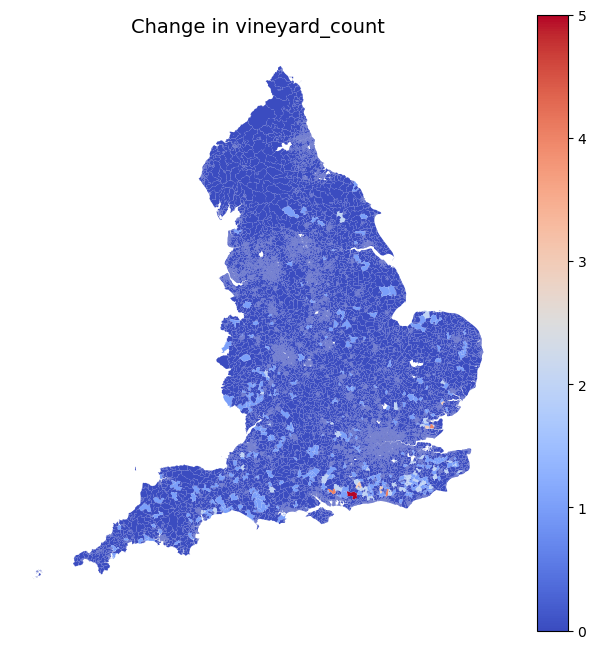

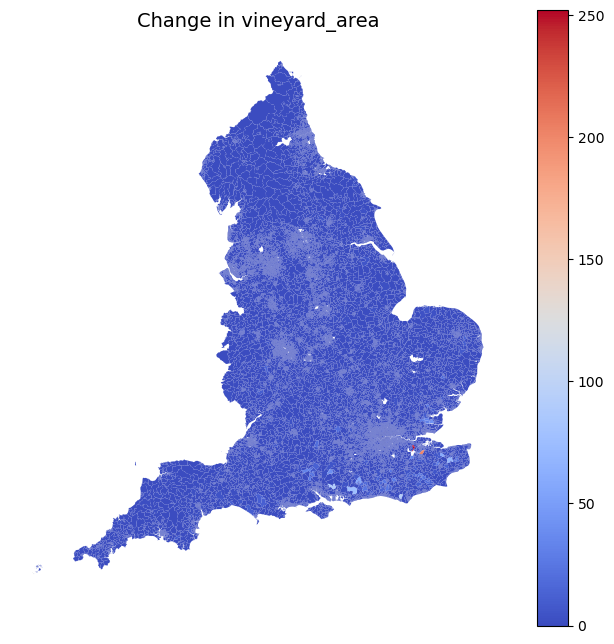

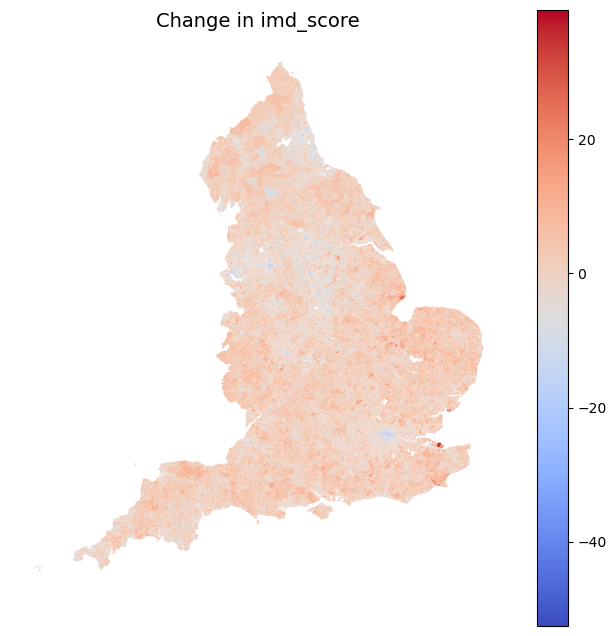

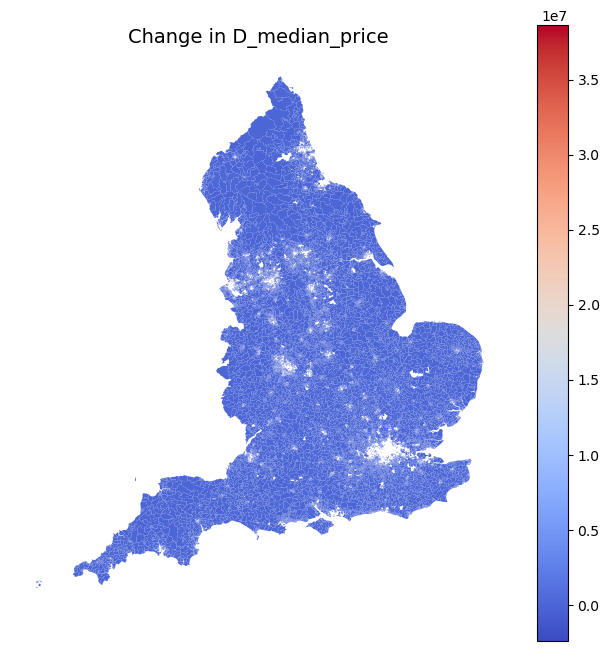

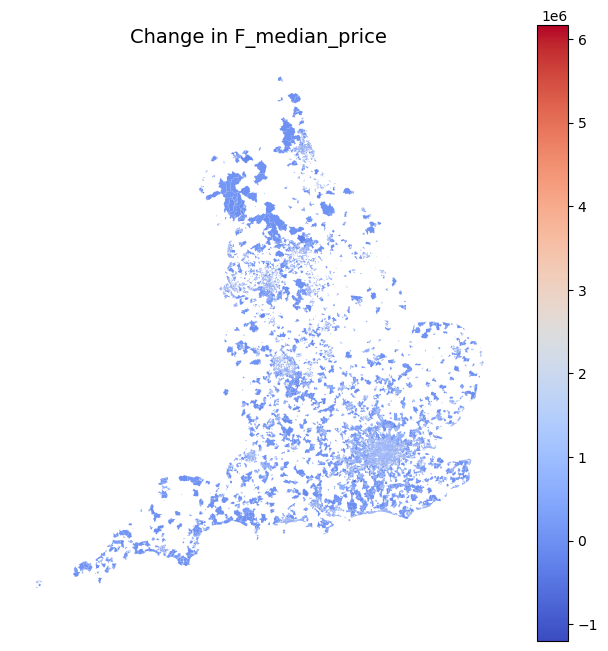

...

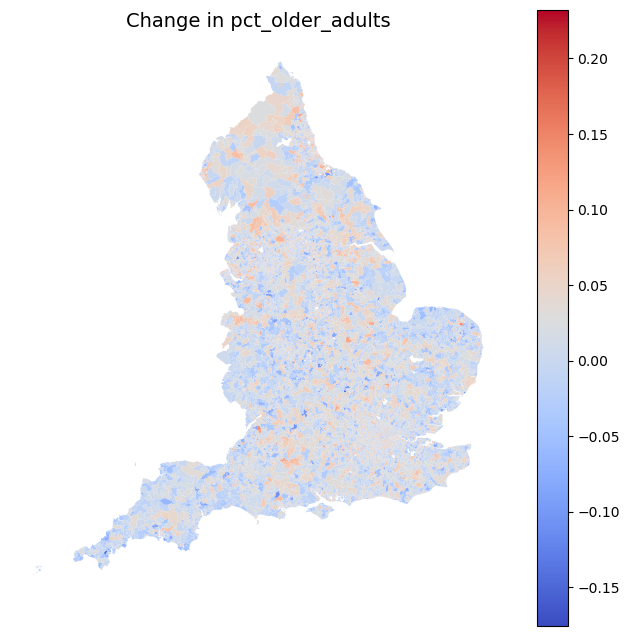

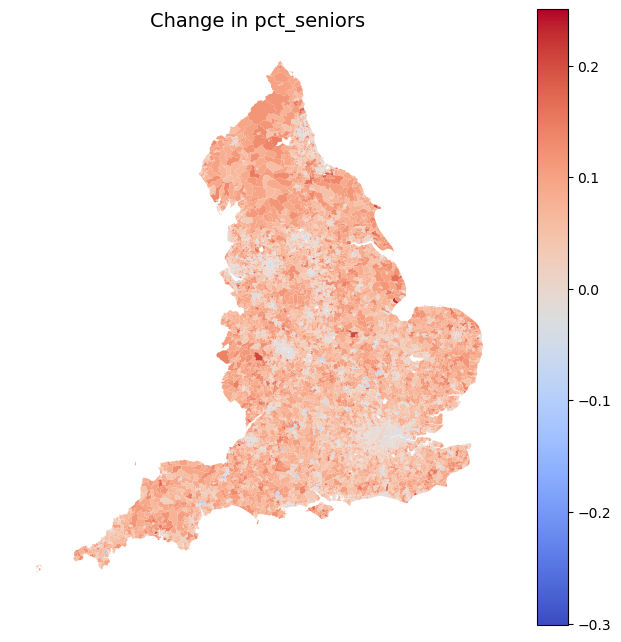

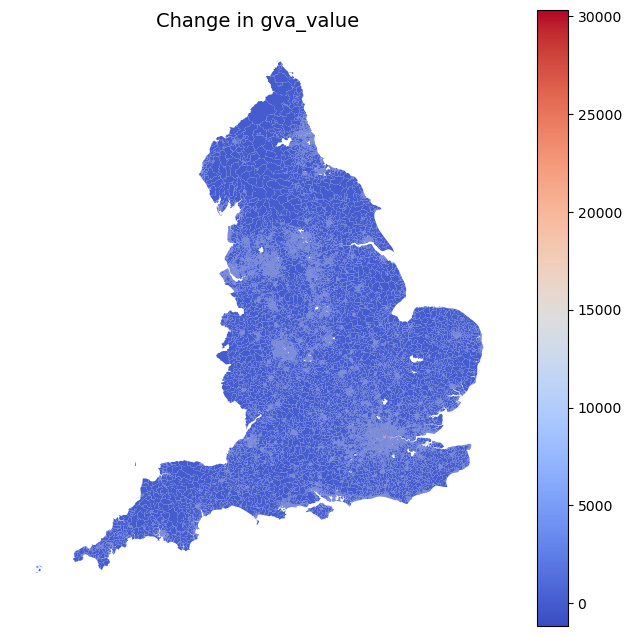

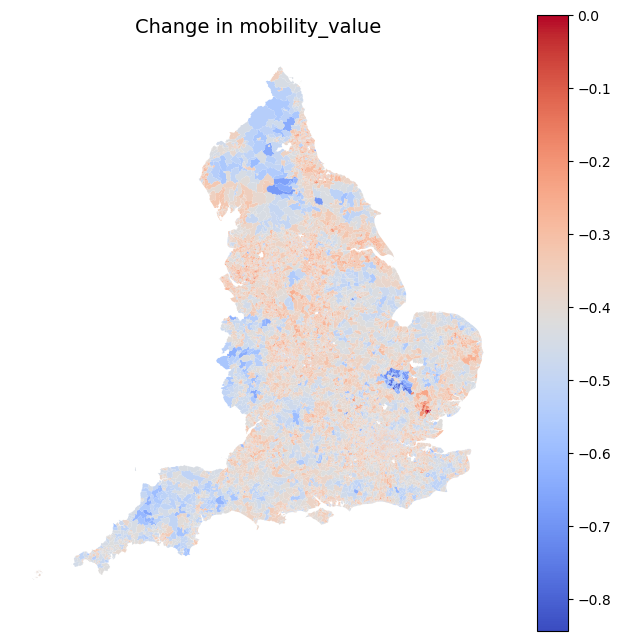

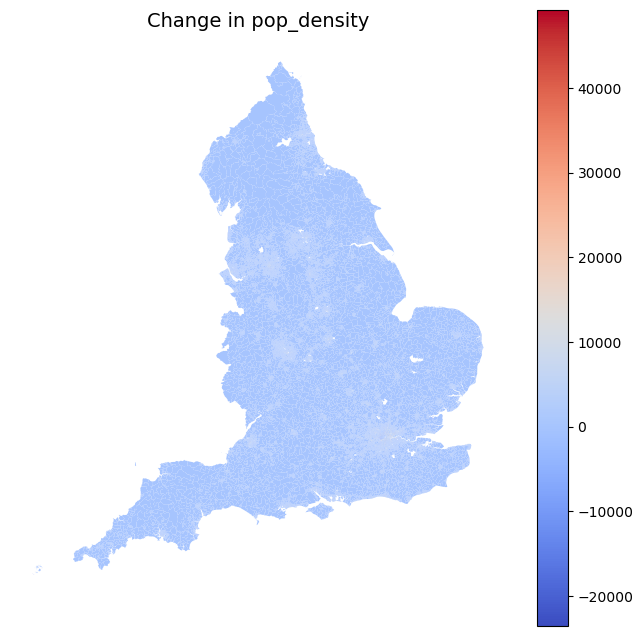

In [57]:
# List of columns to plot
attributes_to_plot = [col for col in change_gdf.columns if col.endswith('_change')]

# Set up the plots
for attr in attributes_to_plot:
    fig, ax = plt.subplots(figsize=(8, 8))  # Adjust size as needed
    
    change_gdf.plot(
        column=attr,
        cmap='coolwarm',    # blue-red diverging color map
        legend=True,
        ax=ax,
        edgecolor='black',  # outlines
        linewidth=0
    )
    
    ax.set_title(f"Change in {attr.replace('_change', '')}", fontsize=14)
    ax.axis('off')  # Hide axis
    
    plt.show()

In [58]:
regression_df_2019 = regression_df[regression_df['year'] == 2019].copy()


numeric_cols = [ # cols to normalise
    'vineyard_count', 'vineyard_area', 
    'imd_score', 'all_median_price', 'total_pop', 'pop_density', 'gva_value', 'mobility_value',
    'pct_kids', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors',
    'D_median_price', 'F_median_price', 'O_median_price', 'S_median_price', 'T_median_price'
]
numeric_cols = [col for col in numeric_cols if col in regression_df_2019.columns] # ensure all exist in the df
scaler = StandardScaler() # apply z-score normalisation
scaled_values = scaler.fit_transform(regression_df_2019[numeric_cols])
regression_df_normal_2019 = regression_df_2019.copy() # create a new df
regression_df_normal_2019[numeric_cols] = scaled_values

In [59]:
regression_df_2019

,LSOA11CD,LSOA11NM,geometry,year,vineyard_count,vineyard_area,imd_score,D_median_price,F_median_price,O_median_price,...,all_median_price,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density
834072,E01000001,City of London 001A,"POLYGON ((532151.537 181867.433, 532152.500 18...",2019,0.0,0.0,6.208,NaN,840000.0,600000.0,...,840000.0,1677.0,0.097197,0.265355,0.228980,0.167561,0.240906,1342.833,0.332,12913.378827
834073,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",2019,0.0,0.0,5.143,NaN,845000.0,206250000.0,...,880000.0,1423.0,0.080815,0.276177,0.238932,0.230499,0.173577,11140.686,0.399,6229.762172
834074,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.250 18...",2019,0.0,0.0,19.402,NaN,520000.0,NaN,...,520000.0,1841.0,0.083650,0.281369,0.243889,0.219446,0.171646,78.513,0.285,31174.671160
834075,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",2019,0.0,0.0,28.652,NaN,395000.0,975033.5,...,725000.0,1426.0,0.161290,0.450912,0.165498,0.145863,0.076438,1615.314,0.297,7521.981330
834076,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",2019,0.0,0.0,19.837,NaN,205000.0,NaN,...,240000.0,1844.0,0.264100,0.267354,0.245662,0.133948,0.088937,7.515,0.206,12583.852910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867040,E01033748,Liverpool 050I,"MULTIPOLYGON (((334607.901 388176.505, 334600....",2019,0.0,0.0,14.690,NaN,125250.0,111250.0,...,125000.0,1282.0,0.061622,0.521061,0.215289,0.118565,0.083463,507.201,0.480,2651.422694
867041,E01033749,Liverpool 042F,"POLYGON ((338929.000 388182.000, 338936.000 38...",2019,0.0,0.0,14.244,NaN,NaN,NaN,...,185000.0,787.0,0.425032,0.252224,0.146760,0.094663,0.081321,9.895,0.266,3882.896322
867042,E01033750,Liverpool 061A,"POLYGON ((334442.091 389502.020, 334489.805 38...",2019,0.0,0.0,11.769,NaN,134995.0,NaN,...,134995.0,2071.0,0.099952,0.587156,0.146789,0.105263,0.060840,52.027,0.594,4194.929966
867043,E01033751,Liverpool 062A,"POLYGON ((334674.977 391540.458, 334679.726 39...",2019,0.0,0.0,41.135,NaN,194575.0,115000.0,...,194260.0,2376.0,0.219276,0.537037,0.110690,0.087542,0.045455,81.205,0.478,3976.195220


In [60]:
regression_df_normal_2019

,LSOA11CD,LSOA11NM,geometry,year,vineyard_count,vineyard_area,imd_score,D_median_price,F_median_price,O_median_price,...,all_median_price,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density
834072,E01000001,City of London 001A,"POLYGON ((532151.537 181867.433, 532152.500 18...",2019,-0.12839,-0.044872,-1.008544,NaN,3.657398,-0.047704,...,2.335446,-0.081269,-2.428588,0.867398,1.000409,-0.650952,0.613942,3.498425,1.460988,1.888661
834073,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",2019,-0.12839,-0.044872,-1.078040,NaN,3.686297,40.353903,...,2.504023,-0.669083,-2.731045,0.997011,1.288621,0.857504,-0.185081,30.058106,2.180680,0.391523
834074,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.250 18...",2019,-0.12839,-0.044872,-0.147575,NaN,1.807846,NaN,...,0.986835,0.298265,-2.678704,1.059190,1.432194,0.592593,-0.207998,0.071150,0.956130,5.979212
834075,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",2019,-0.12839,-0.044872,0.456030,NaN,1.085365,0.025974,...,1.850789,-0.662141,-1.245269,3.089718,-0.838147,-1.171010,-1.337869,4.237057,1.085030,0.680981
834076,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",2019,-0.12839,-0.044872,-0.119189,NaN,-0.012806,NaN,...,-0.193200,0.305208,0.652856,0.891336,1.483527,-1.456573,-1.189533,-0.121309,0.107538,1.814847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867040,E01033748,Liverpool 050I,"MULTIPOLYGON (((334607.901 388176.505, 334600....",2019,-0.12839,-0.044872,-0.455055,NaN,-0.473749,-0.143723,...,-0.677857,-0.995390,-3.085392,3.929860,0.603874,-1.825268,-1.254492,1.233223,3.050755,-0.410029
867041,E01033749,Liverpool 042F,"POLYGON ((338929.000 388182.000, 338936.000 38...",2019,-0.12839,-0.044872,-0.484158,NaN,NaN,NaN,...,-0.424993,-2.140934,3.624072,0.710132,-1.380832,-2.398124,-1.279911,-0.114857,0.752038,-0.134178
867042,E01033750,Liverpool 061A,"POLYGON ((334442.091 389502.020, 334489.805 38...",2019,-0.12839,-0.044872,-0.645663,NaN,-0.417425,NaN,...,-0.635734,0.830538,-2.377736,4.721448,-1.379988,-2.144072,-1.522970,-0.000647,4.275305,-0.064282
867043,E01033751,Liverpool 062A,"POLYGON ((334674.977 391540.458, 334679.726 39...",2019,-0.12839,-0.044872,1.270603,NaN,-0.073061,-0.142986,...,-0.385967,1.536379,-0.174703,4.121199,-2.425468,-2.568800,-1.705557,0.078447,3.029272,-0.113279


---

---

In [61]:
%whos

Variable                        Type              Data/Info
-----------------------------------------------------------
AgglomerativeClustering         type              <class 'sklearn.cluster._<...>AgglomerativeClustering'>
DBSCAN                          type              <class 'sklearn.cluster._dbscan.DBSCAN'>
DistanceBand                    type              <class 'libpysal.weights.distance.DistanceBand'>
GM_Error                        type              <class 'spreg.error_sp.GM_Error'>
GWR                             type              <class 'mgwr.gwr.GWR'>
G_Local                         type              <class 'esda.getisord.G_Local'>
KMeans                          ABCMeta           <class 'sklearn.cluster._kmeans.KMeans'>
KNN                             type              <class 'libpysal.weights.distance.KNN'>
KernelDensity                   type              <class 'sklearn.neighbors._kde.KernelDensity'>
Line2D                          type              <class 'matplotli

merged                          GeoDataFrame                LSOA11CD       <...>042590 rows x 28 columns]
new_order                       list              n=27
norm                            norm_gen          <scipy.stats._continuous_<...>ct at 0x0000020458E54E90>
np                              module            <module 'numpy' from 'C:\<...>ges\\numpy\\__init__.py'>
numeric_attributes              list              n=18
numeric_cols                    list              n=18
onspd_df                        DataFrame                     pcd7      pcd<...>647046 rows x 25 columns]
os                              module            <module 'os' (frozen)>
p_col                           str               P90
part                            int               2
pct_cols                        list              n=5
pd                              module            <module 'pandas' from 'C:<...>es\\pandas\\__init__.py'>
pivot_df                        GeoDataFrame                            

In [62]:
process = psutil.Process()
print(process.memory_info().rss / (1024 ** 2), "MB")  # Resident Set Size (RAM used) in MB

3973.84375 MB


In [63]:
sorted([(x, sys.getsizeof(x)) for x in dir()], key=lambda x: x[1], reverse=True)

[('ZeroInflatedNegativeBinomialP', 78),
 ('stephen_skelton_data_filepath', 78),
 ('harmonise_age_data_to_2011', 75),
 ('libpysal', 75),
 ('requests', 75),
 ('regression_df_normal_2019', 74),
 ('variance_inflation_factor', 74),
 ('AgglomerativeClustering', 72),
 ('imd_2004_2007_2010_path', 72),
 ('price_paid_data_by_year', 72),
 ('resi_mobility_data_long', 72),
 ('age_mf_2011_2014_path', 70),
 ('age_mf_2015_2018_path', 70),
 ('age_mf_2019_2022_path', 70),
 ('lookup_2001_2011_path', 70),
 ('lookup_2011_2021_path', 70),
 ('price_summary_by_lsoa', 70),
 ('age_t_2002_2006_path', 69),
 ('age_t_2007_2011_path', 69),
 ('folium', 69),
 ('psutil', 69),
 ('regression_df_normal', 69),
 ('change_df_2004_2019', 68),
 ('harmonised_age_2011', 68),
 ('imd_2004_harmonised', 68),
 ('imd_2007_harmonised', 68),
 ('vineyard_points_gdf', 68),
 ('attributes_to_plot', 67),
 ('filter_imd_by_year', 67),
 ('imd_2004_2007_2010', 67),
 ('imd_2010_2015_path', 67),
 ('lsoa_2011_bfe_path', 67),
 ('lsoa_2011_repeated',

In [64]:
my_objects = [
    'stephen_skelton_data_filepath', 'harmonise_age_data_to_2011', 'imd_2004_2007_2010_path', 'price_paid_data_by_year', 
    'resi_mobility_data_long', 'age_mf_2011_2014_path', 'age_mf_2015_2018_path', 'age_mf_2019_2022_path', 'lookup_2001_2011_path',
    'lookup_2011_2021_path', 'price_summary_by_lsoa', 'age_t_2002_2006_path', 'age_t_2007_2011_path', 'harmonised_age_2011',
    'imd_2004_harmonised', 'imd_2007_harmonised', 'filter_imd_by_year', 'imd_2004_2007_2010', 'imd_2010_2015_path', 'lsoa_2011_repeated',
    'price_summary_list', 'resi_mobility_data', 'resi_mobility_path', 'lookup_2001_2011', 'lookup_2011_2021', 'age_early_years', 
    'medians_by_type', 'medians_overall', 'postcode_lookup', 'lsoa_2011_path', 'age_all_years', 'gva_lsoa_data', 'gva_lsoa_path',
    'harmonise_imd', 'harmonised_df', 'imd_2000_path', 'imd_2019_path', 'imd_2010_2015'
]

for varname in my_objects:
    if varname in globals():
        del globals()[varname]

# Clean up
gc.collect()

sorted([(x, sys.getsizeof(x)) for x in dir()], key=lambda x: x[1], reverse=True)

[('ZeroInflatedNegativeBinomialP', 78),
 ('libpysal', 75),
 ('requests', 75),
 ('regression_df_normal_2019', 74),
 ('variance_inflation_factor', 74),
 ('AgglomerativeClustering', 72),
 ('folium', 69),
 ('psutil', 69),
 ('regression_df_normal', 69),
 ('change_df_2004_2019', 68),
 ('vineyard_points_gdf', 68),
 ('attributes_to_plot', 67),
 ('lsoa_2011_bfe_path', 67),
 ('numeric_attributes', 67),
 ('regression_df_2019', 67),
 ('change_gdf_normal', 66),
 ('vineyard_expanded', 66),
 ('NegativeBinomial', 65),
 ('change_df_normal', 65),
 ('vineyard_summary', 65),
 ('StandardScaler', 63),
 ('attr', 63),
 ('esda', 63),
 ('important_cols', 63),
 ('json', 63),
 ('tqdm', 63),
 ('KernelDensity', 62),
 ('expanded_rows', 62),
 ('lsoa_2011_bfe', 62),
 ('lsoa_2011_gdp', 62),
 ('regression_df', 62),
 ('scaled_values', 62),
 ('DistanceBand', 61),
 ('MultiPolygon', 61),
 ('__builtins__', 61),
 ('cols_to_drop', 61),
 ('cols_to_keep', 61),
 ('coord_lookup', 61),
 ('gaussian_kde', 61),
 ('imd_complete', 61),


In [65]:
process = psutil.Process()
print(process.memory_info().rss / (1024 ** 2), "MB")  # Resident Set Size (RAM used) in MB

4582.71875 MB


---

# EDA

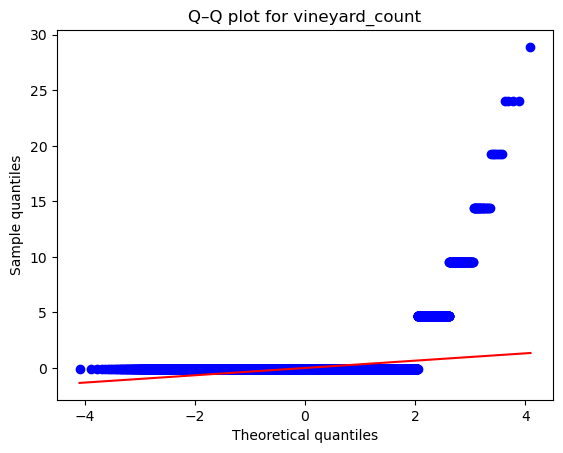

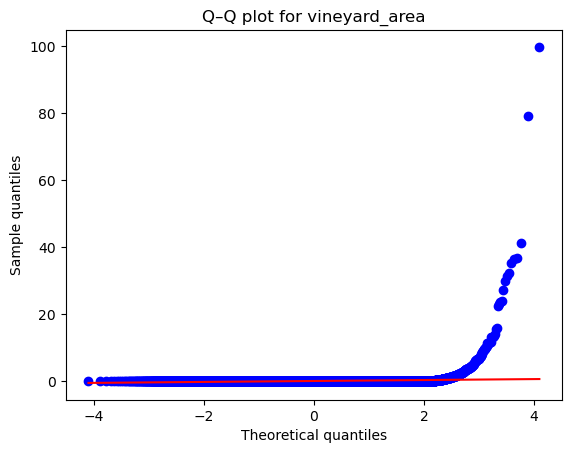

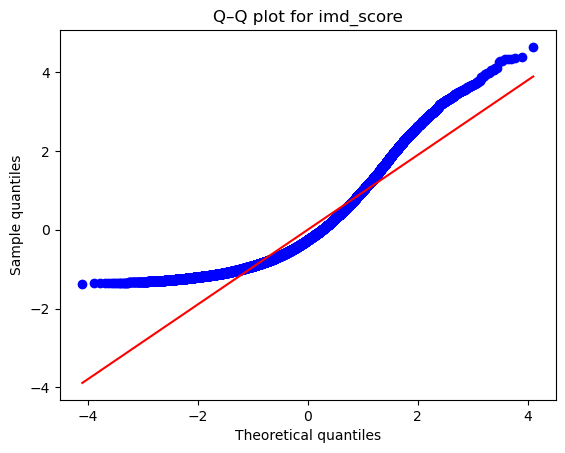

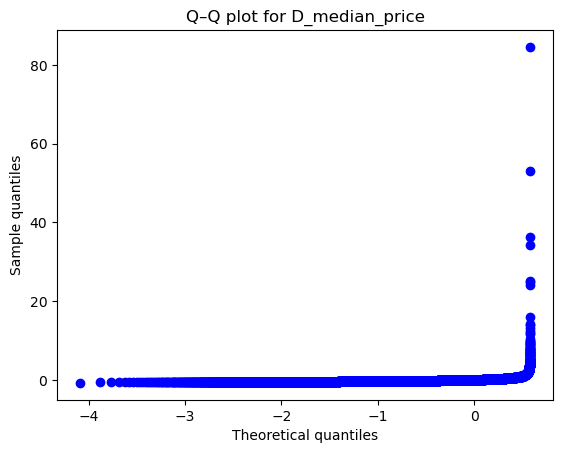

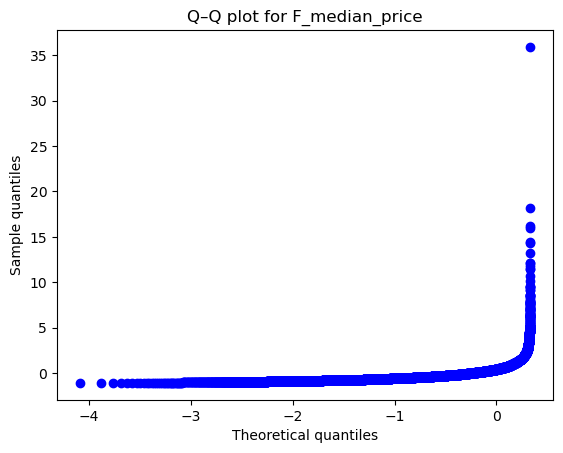

...

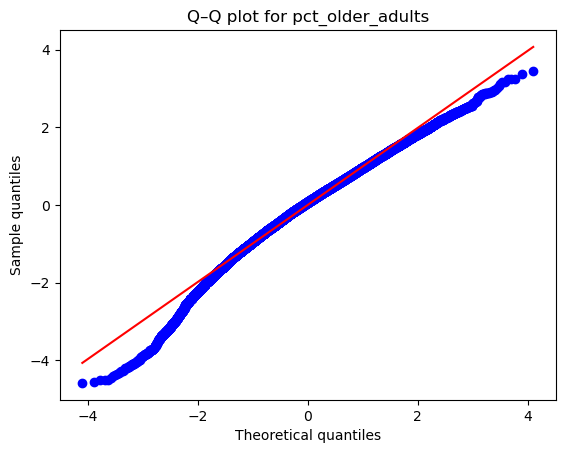

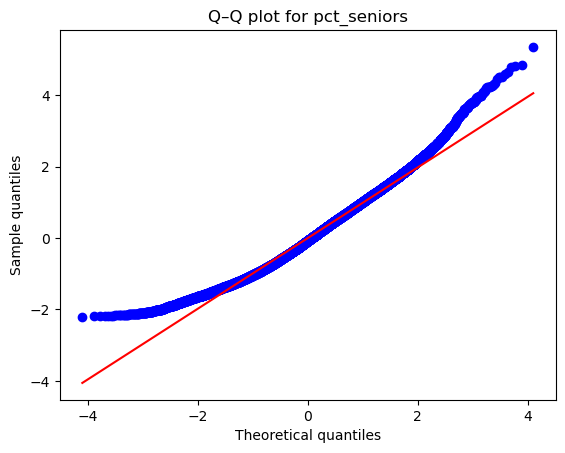

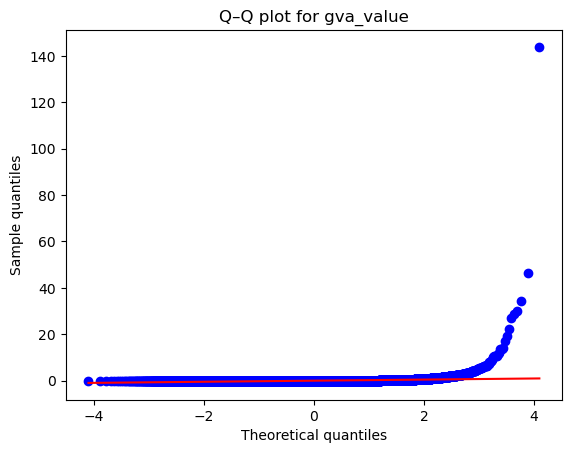

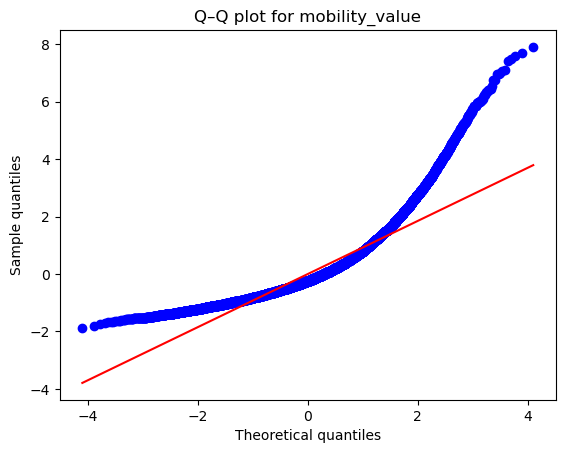

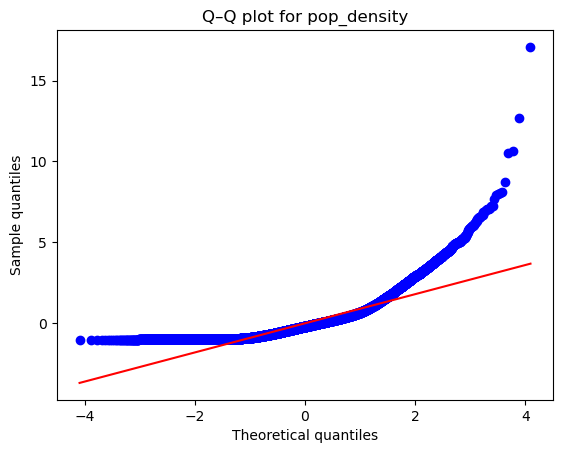

In [134]:
# qq plot for normalised vals
pct_cols = [
    'vineyard_count', 'vineyard_area', 'imd_score', 'D_median_price', 'F_median_price', 'O_median_price',
    'S_median_price', 'T_median_price', 'all_median_price', 'total_pop',    'pct_kids', 'pct_young_adults', 
    'pct_middle_aged', 'pct_older_adults','pct_seniors', 'gva_value', 'mobility_value', 'pop_density'
]

for col in pct_cols:
    plt.figure()  # one separate figure per plot
    stats.probplot(regression_df_normal_2019[col], dist="norm", plot=plt)
    plt.title(f"Q–Q plot for {col}")
    plt.xlabel("Theoretical quantiles")
    plt.ylabel("Sample quantiles")
    plt.show()

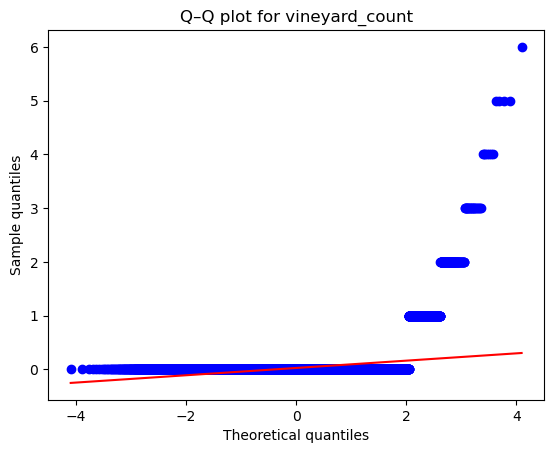

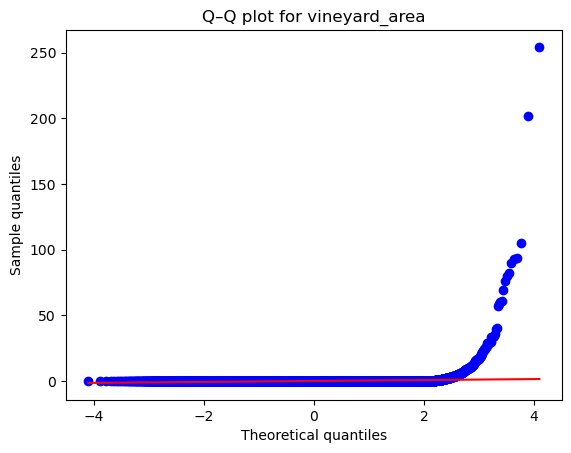

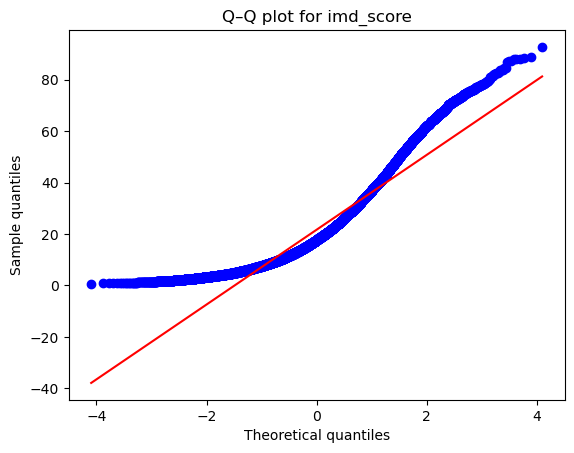

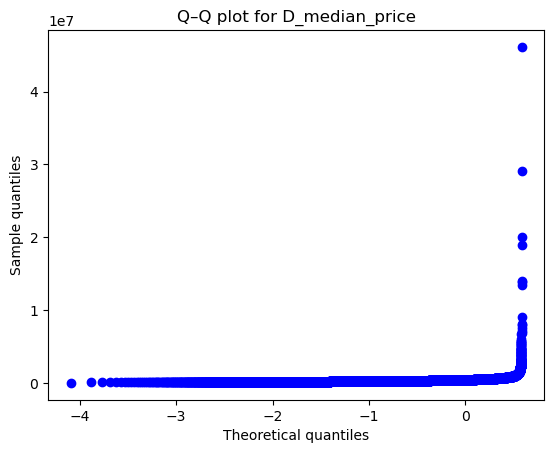

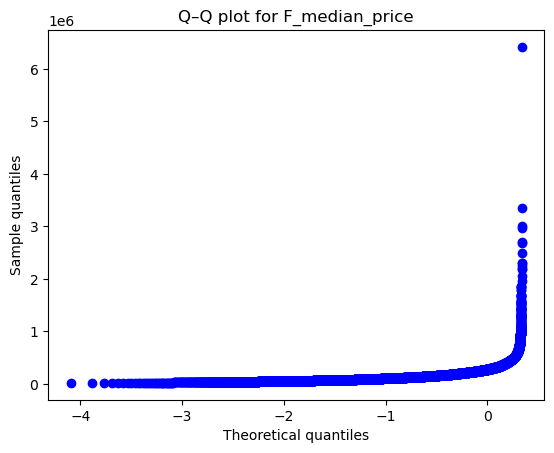

...

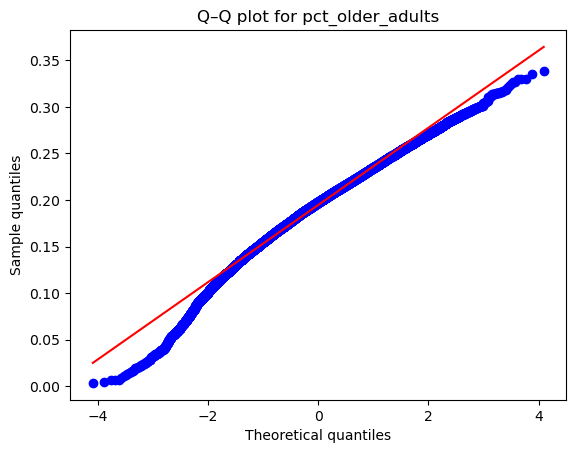

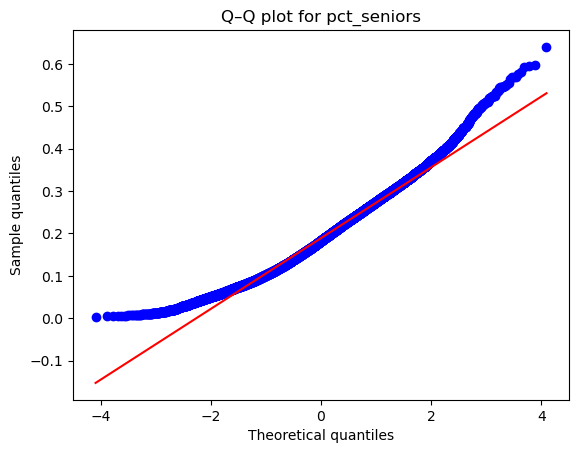

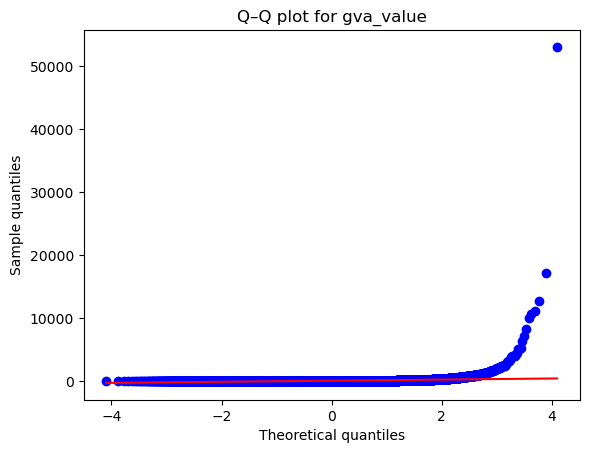

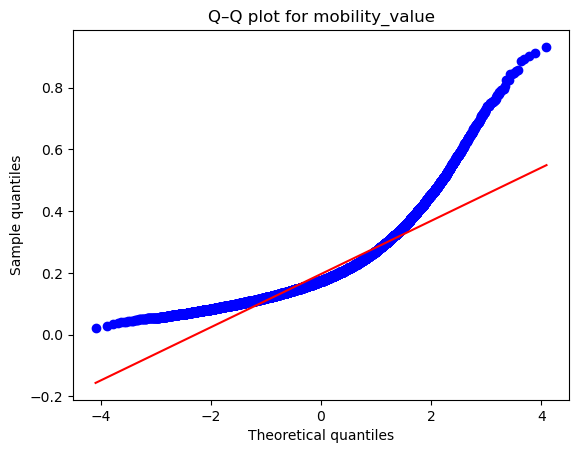

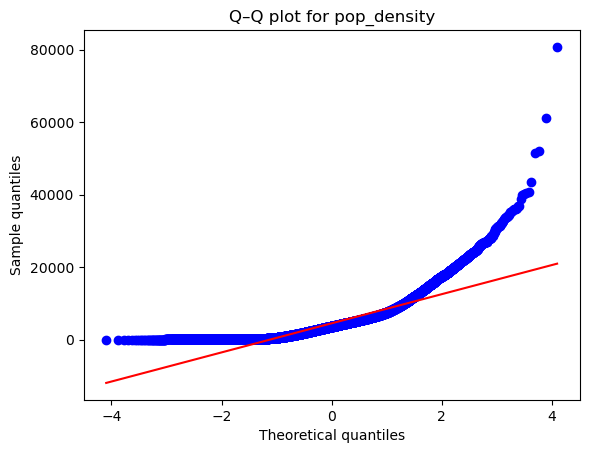

In [135]:
# qq plot for absolute vals
pct_cols = [
    'vineyard_count', 'vineyard_area', 'imd_score', 'D_median_price', 'F_median_price', 'O_median_price',
    'S_median_price', 'T_median_price', 'all_median_price', 'total_pop', 'pct_kids', 'pct_young_adults', 
    'pct_middle_aged', 'pct_older_adults','pct_seniors', 'gva_value', 'mobility_value', 'pop_density'
]

for col in pct_cols:
    plt.figure()  # one separate figure per plot
    stats.probplot(regression_df_2019[col], dist="norm", plot=plt)
    plt.title(f"Q–Q plot for {col}")
    plt.xlabel("Theoretical quantiles")
    plt.ylabel("Sample quantiles")
    plt.show()

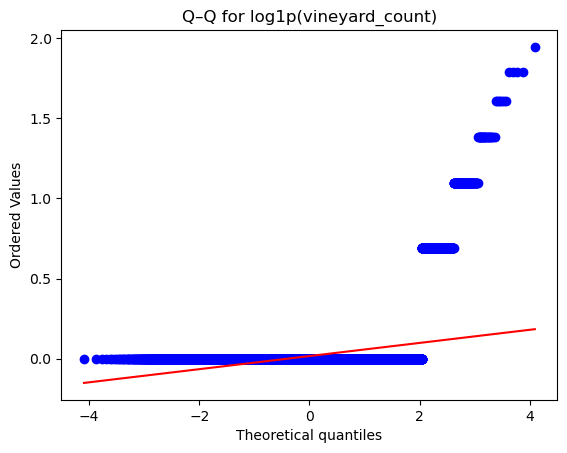

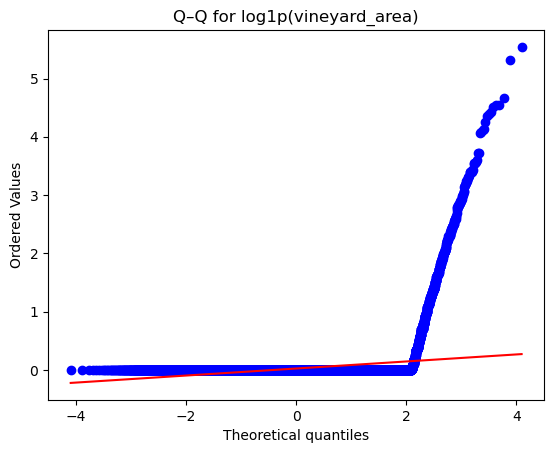

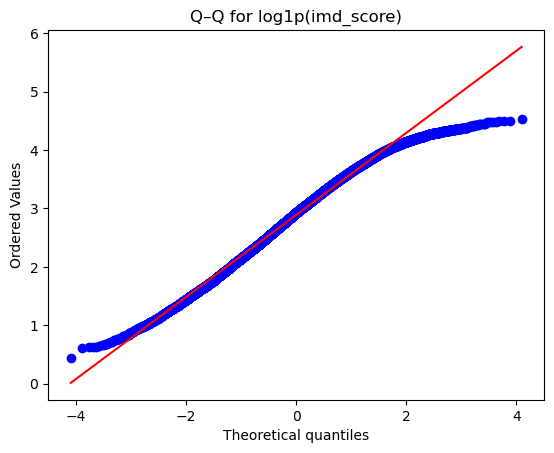

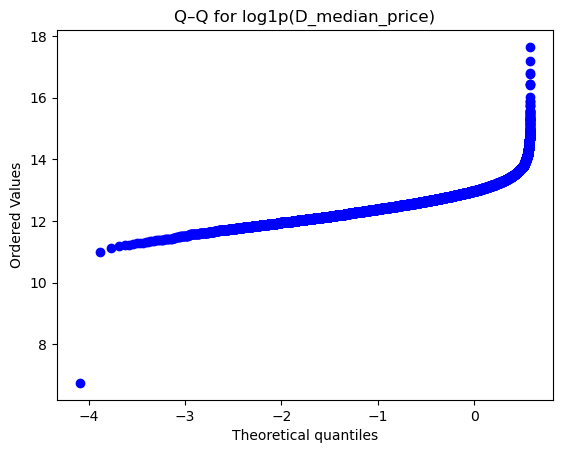

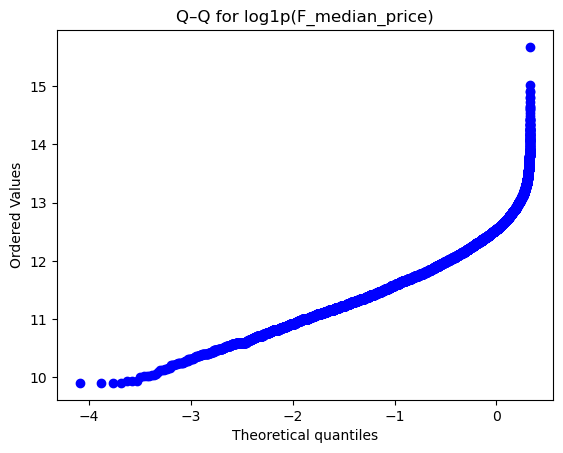

...

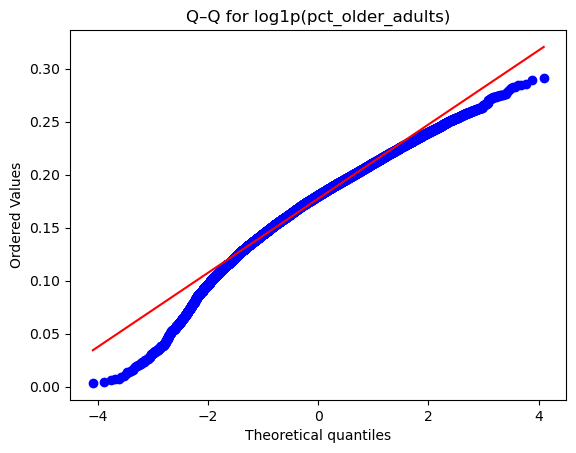

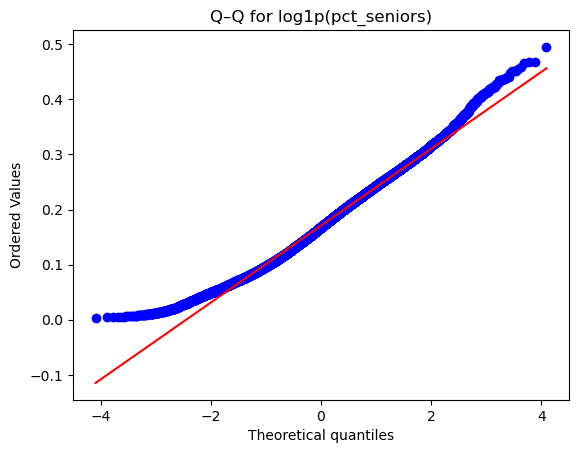

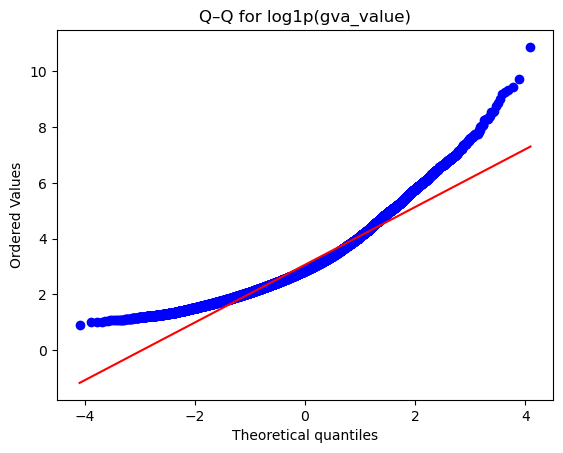

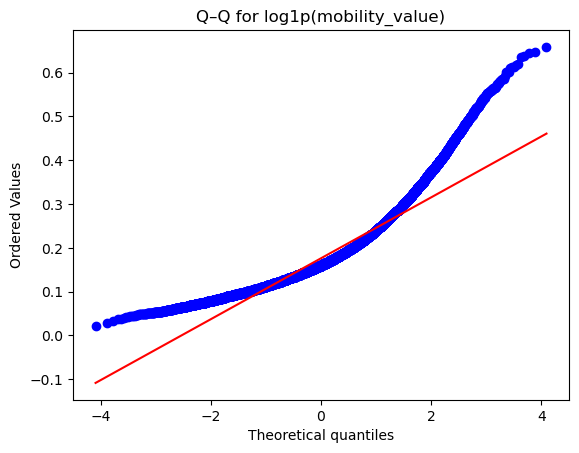

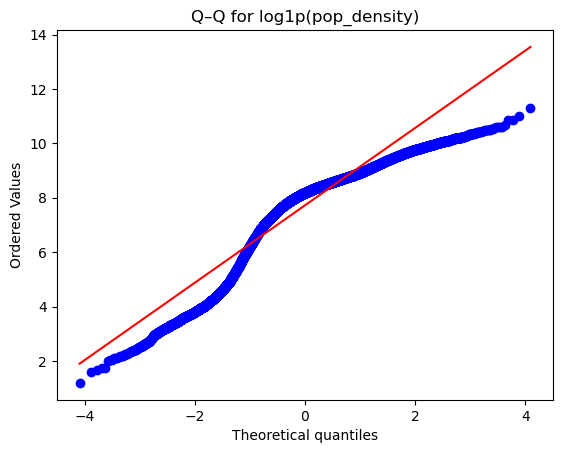

In [136]:
# qq plot for absolute vals (log transformed)
for col in [
    'vineyard_count', 'vineyard_area', 'imd_score', 'D_median_price', 'F_median_price', 'O_median_price',
    'S_median_price', 'T_median_price', 'all_median_price', 'total_pop', 'pct_kids', 'pct_young_adults',
    'pct_middle_aged', 'pct_older_adults','pct_seniors', 'gva_value', 'mobility_value', 'pop_density'
]:
    transformed = np.log1p(regression_df_2019[col])
    plt.figure()
    stats.probplot(transformed, dist='norm', plot=plt)
    plt.title(f"Q–Q for log1p({col})")
    plt.show()

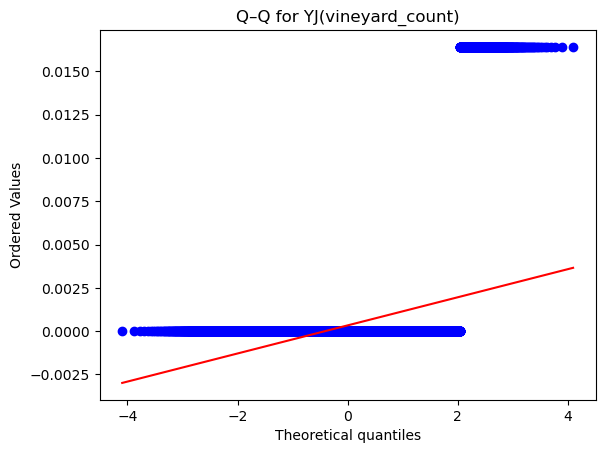

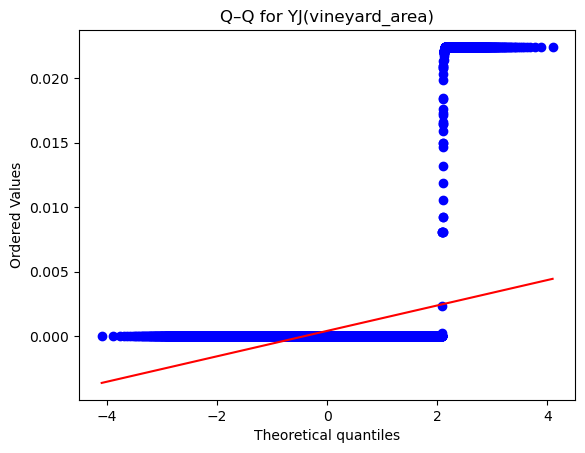

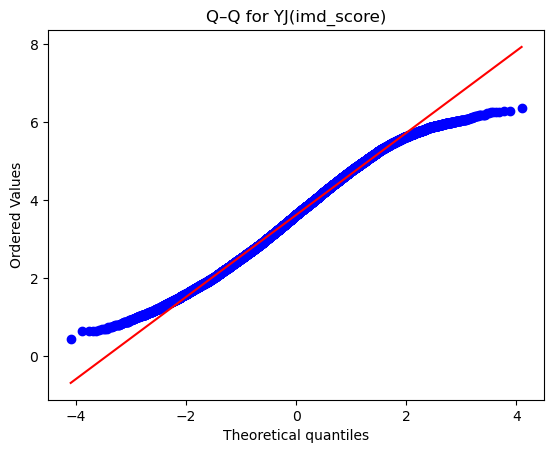

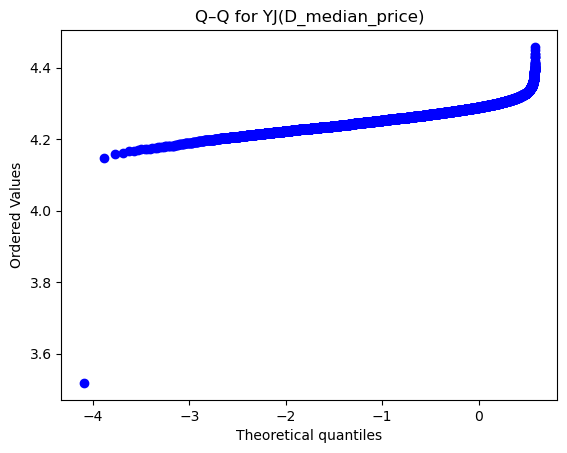

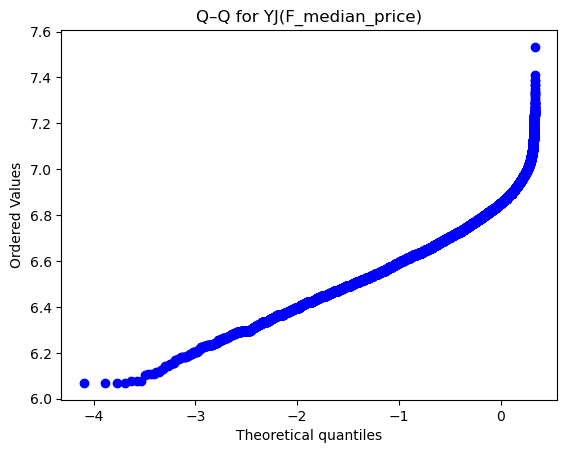

...

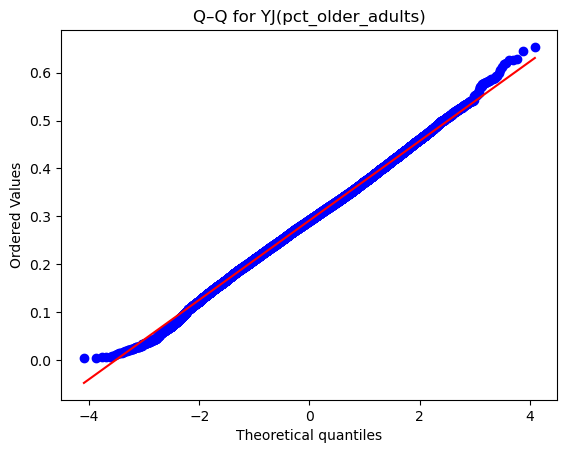

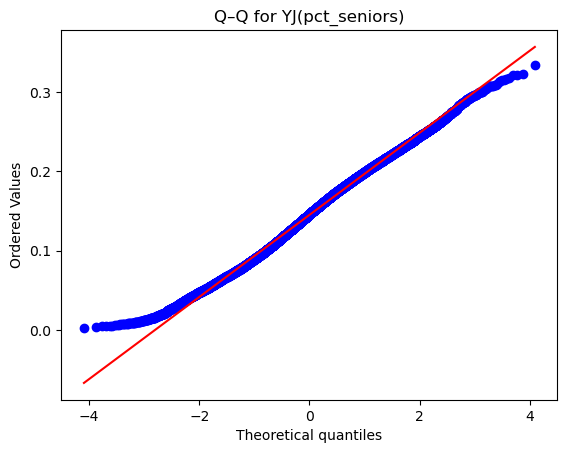

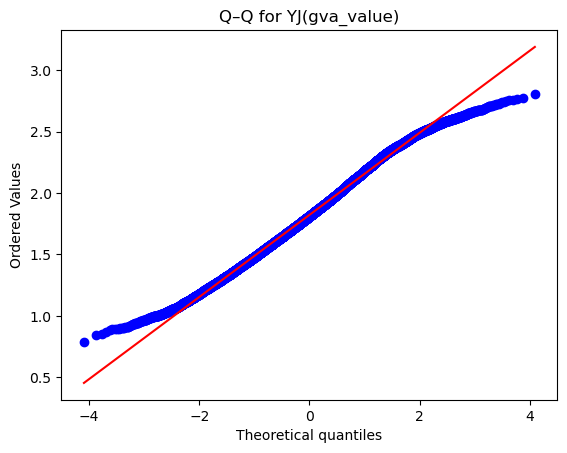

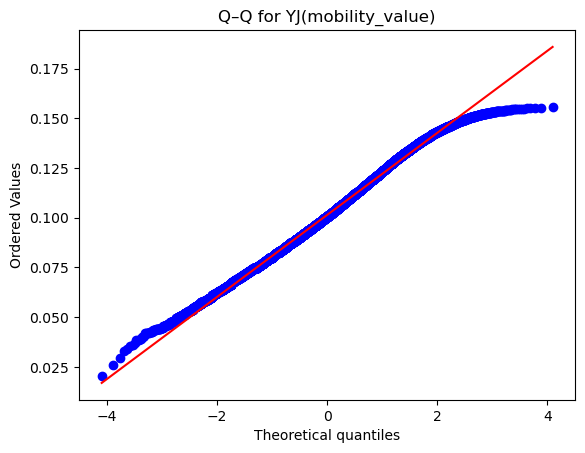

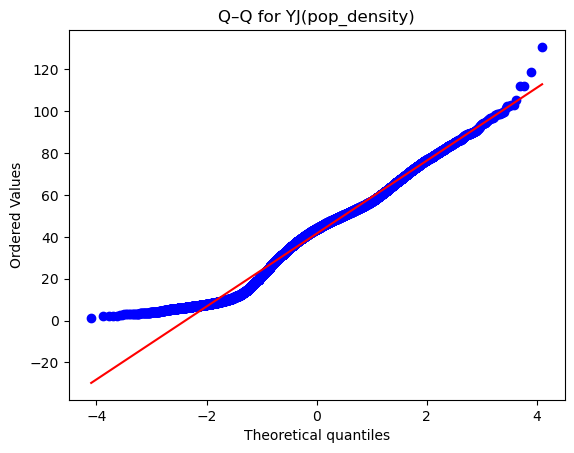

In [137]:
# qq plot for absolute vals (yeo-johnson)
pt = PowerTransformer(method='yeo-johnson', standardize=False)
for col in [
    'vineyard_count', 'vineyard_area', 'imd_score', 'D_median_price', 'F_median_price', 'O_median_price',
    'S_median_price', 'T_median_price', 'all_median_price', 'total_pop', 'pct_kids', 'pct_young_adults',
    'pct_middle_aged', 'pct_older_adults','pct_seniors', 'gva_value', 'mobility_value', 'pop_density'
]:
    transformed = pt.fit_transform(regression_df_2019[[col]])[:,0]
    plt.figure()
    stats.probplot(transformed, dist='norm', plot=plt)
    plt.title(f"Q–Q for YJ({col})")
    plt.show()

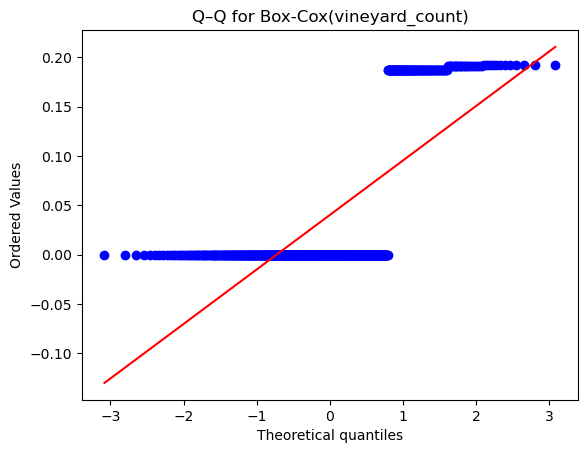

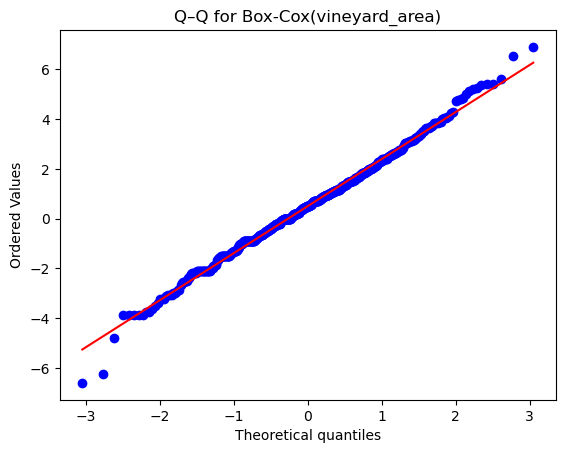

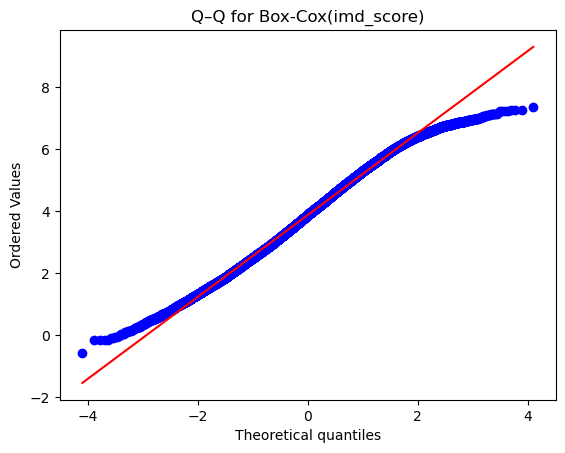

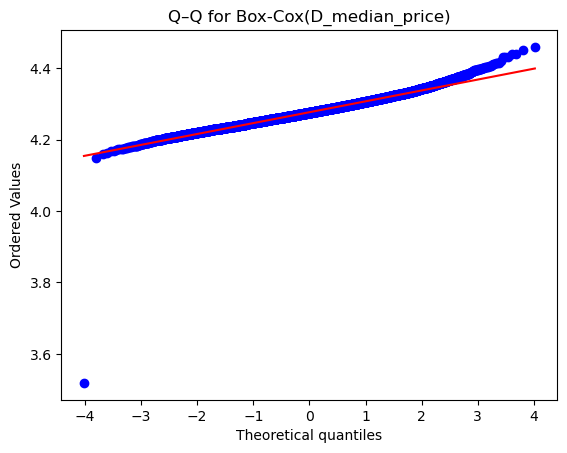

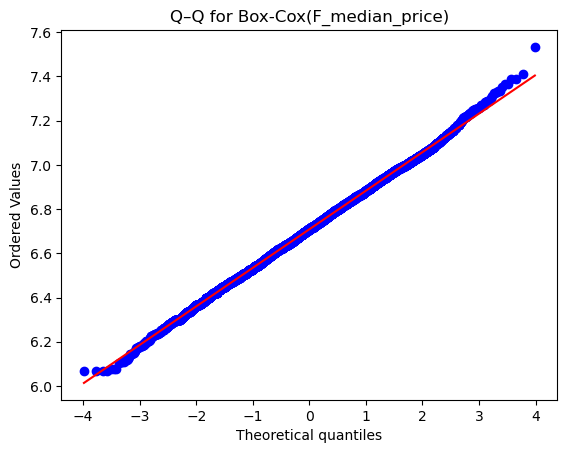

...

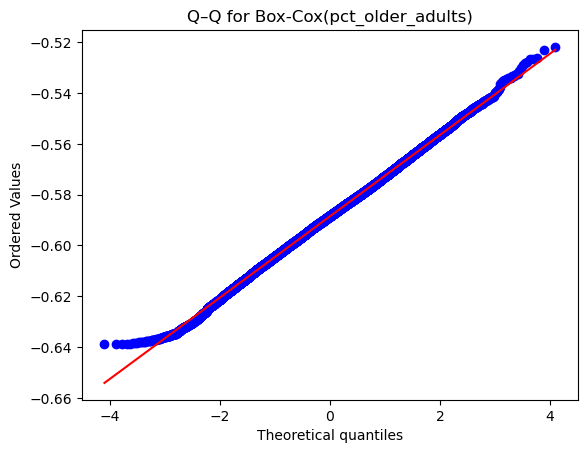

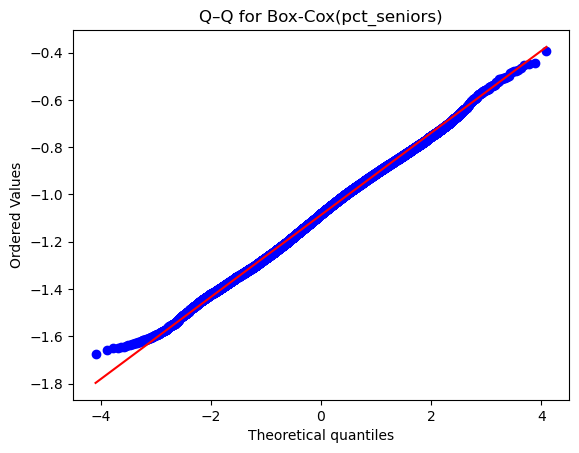

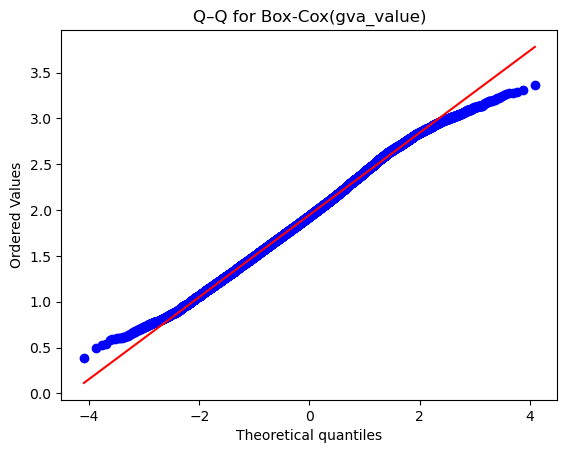

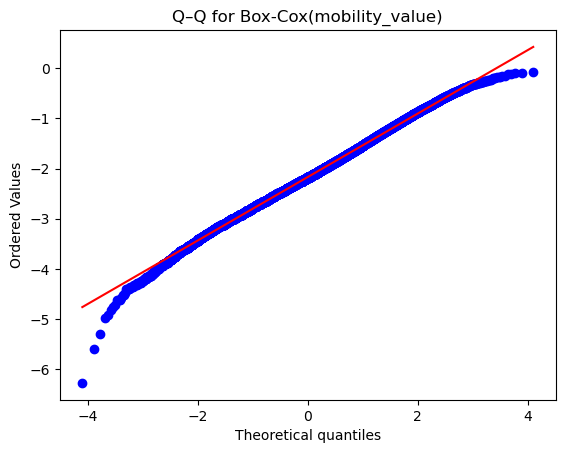

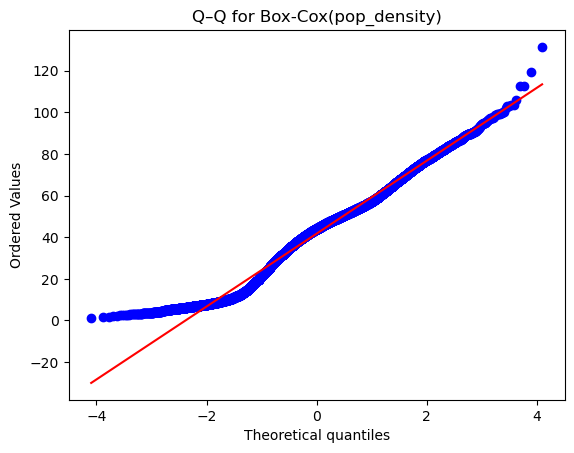

In [139]:
# qq plot for absolute vals (box cox transformed)

for col in [
    'vineyard_count', 'vineyard_area', 'imd_score', 'D_median_price', 'F_median_price', 'O_median_price',
    'S_median_price', 'T_median_price', 'all_median_price', 'total_pop', 'pct_kids', 'pct_young_adults',
    'pct_middle_aged', 'pct_older_adults','pct_seniors', 'gva_value', 'mobility_value', 'pop_density'
]:
    data = regression_df_2019[col]
    data_pos = data[data > 0]  # Box-Cox requires > 0
    transformed, _ = boxcox(data_pos)
    
    plt.figure()
    stats.probplot(transformed, dist='norm', plot=plt)
    plt.title(f"Q–Q for Box-Cox({col})")
    plt.show()

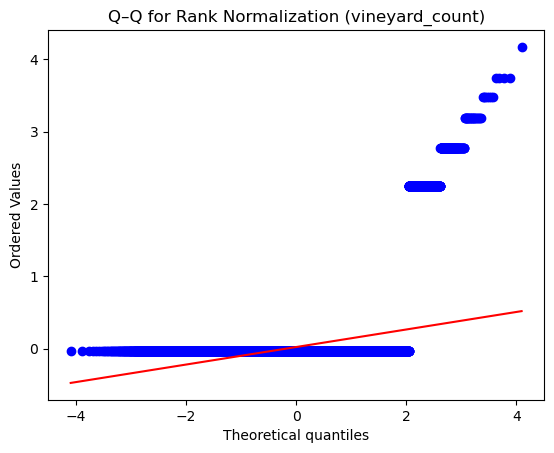

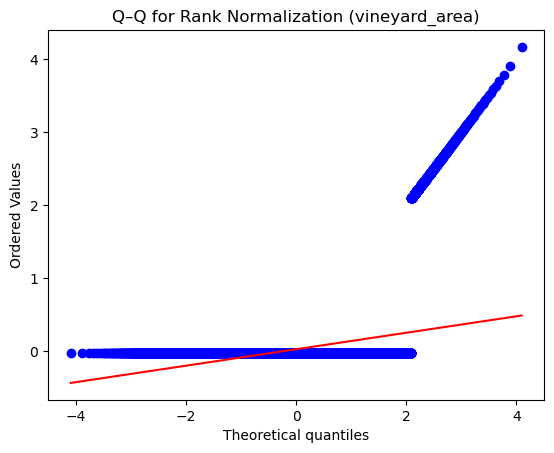

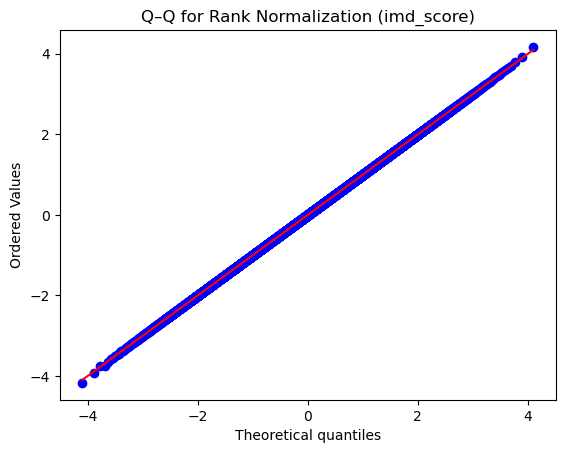

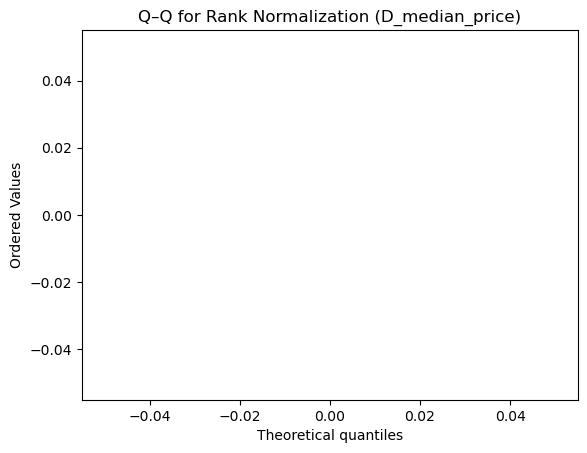

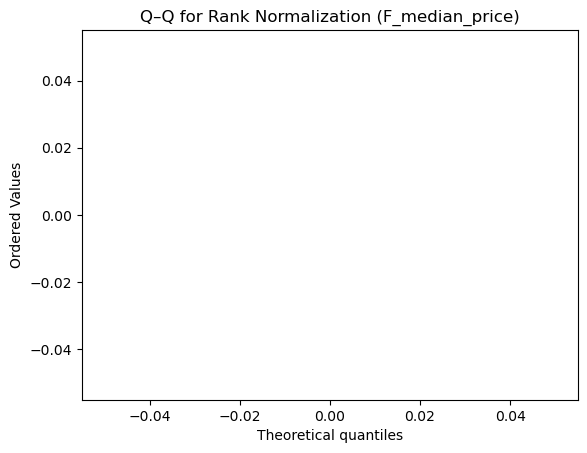

...

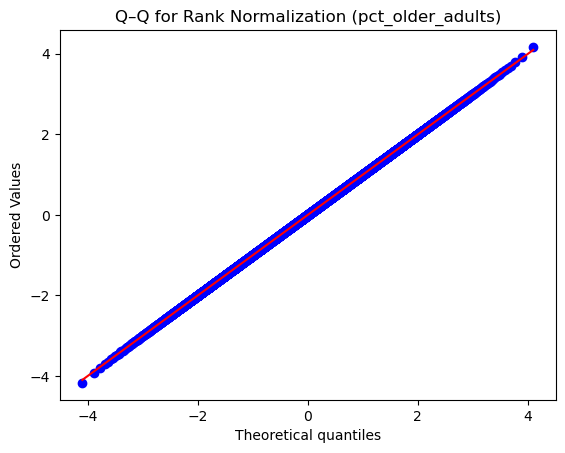

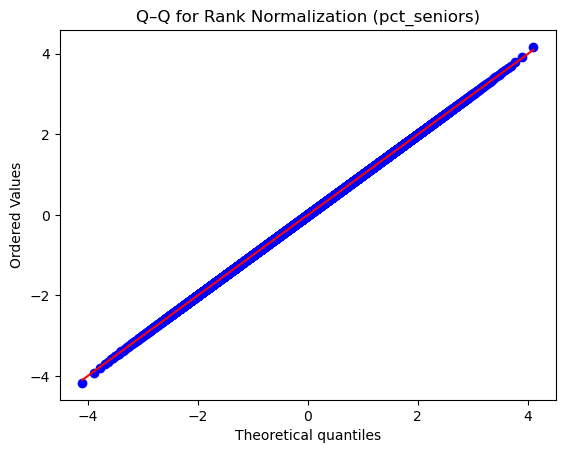

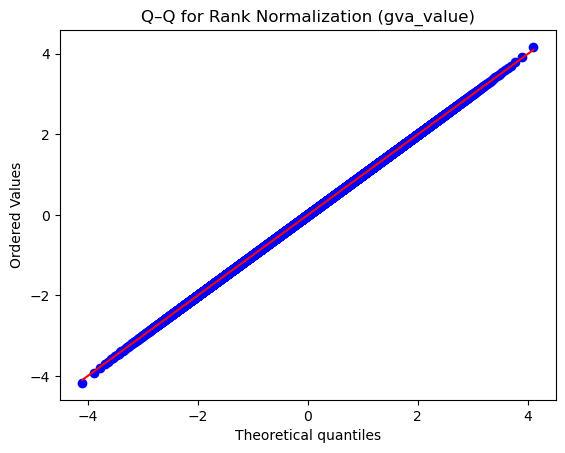

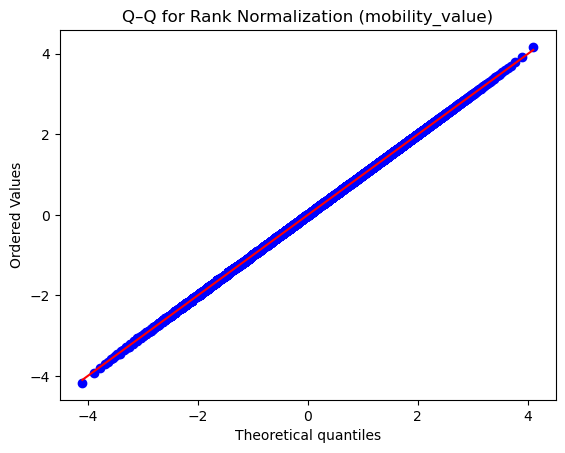

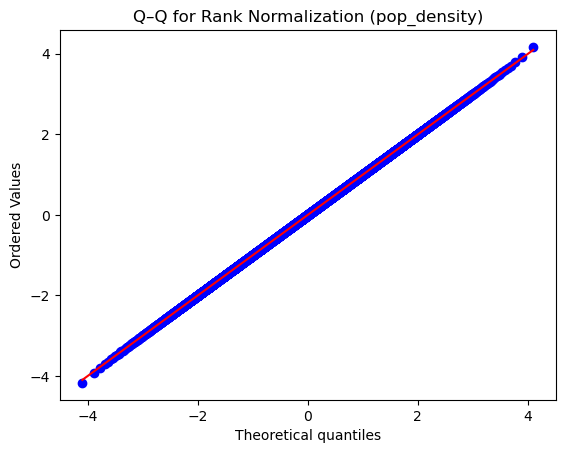

In [140]:
# qq plot for absolute vals (Rank-based Inverse Normal transformed)


for col in pct_cols:
    ranks = rankdata(regression_df_2019[col])
    normalized = norm.ppf((ranks - 0.5) / len(ranks))
    
    plt.figure()
    stats.probplot(normalized, dist='norm', plot=plt)
    plt.title(f"Q–Q for Rank Normalization ({col})")
    plt.show()

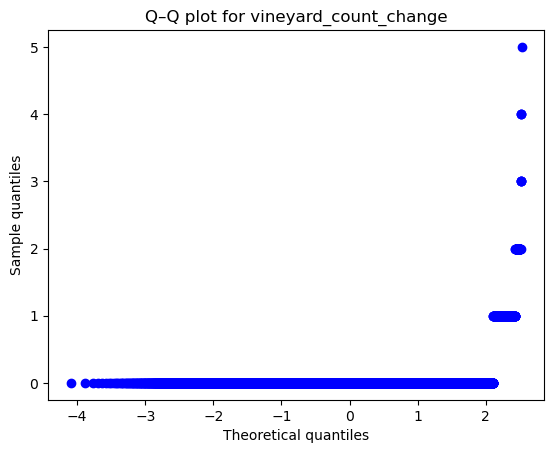

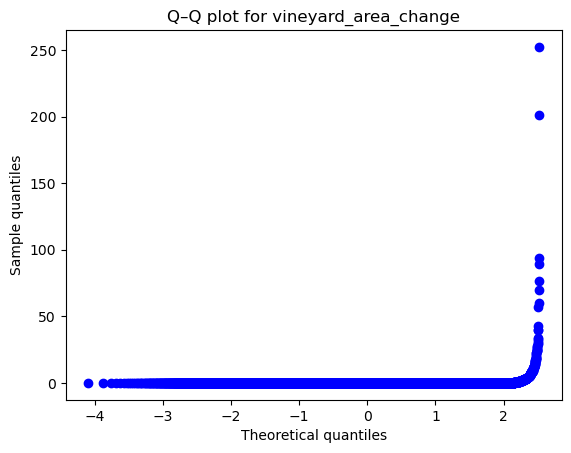

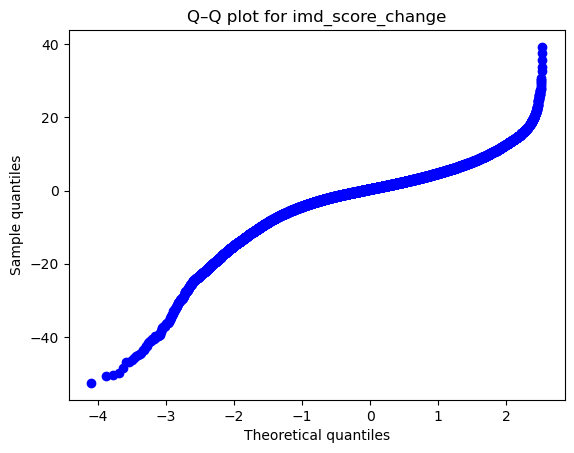

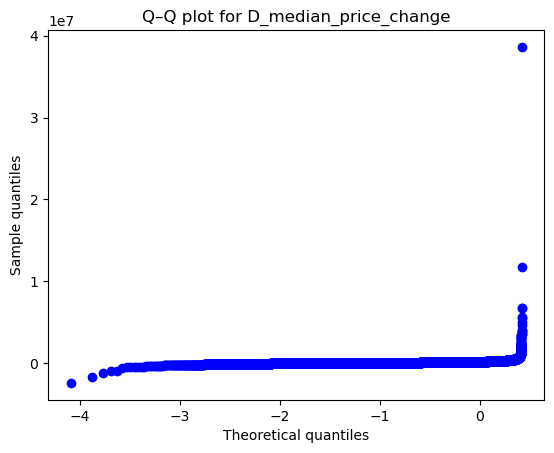

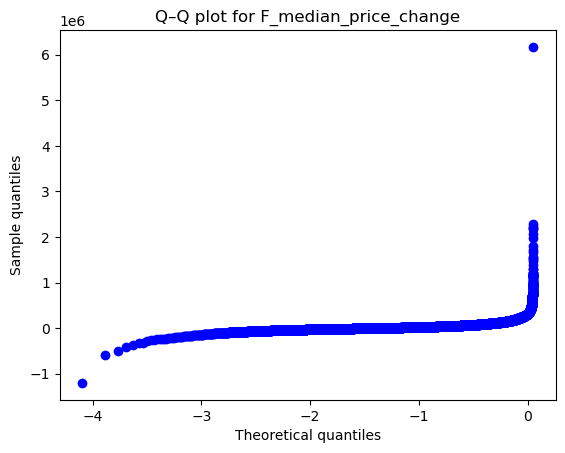

...

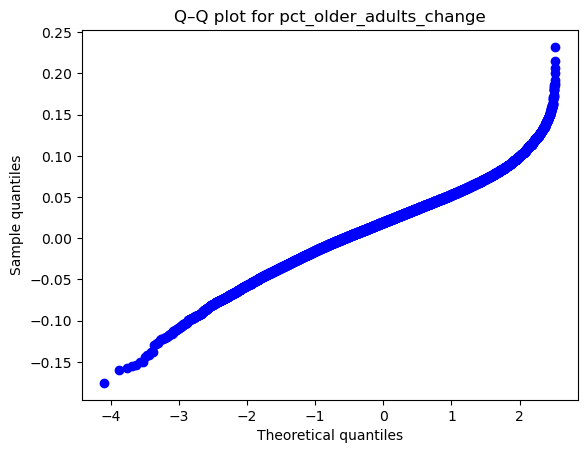

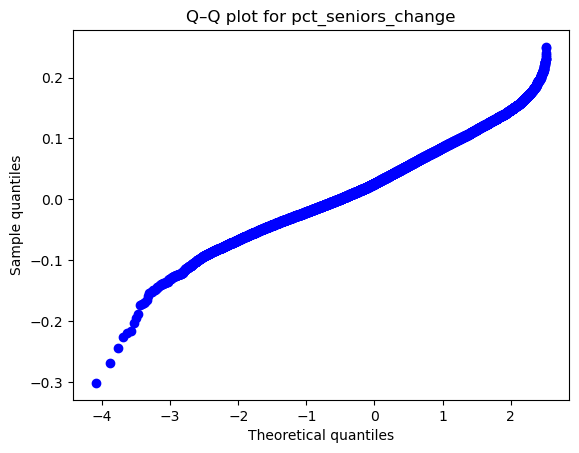

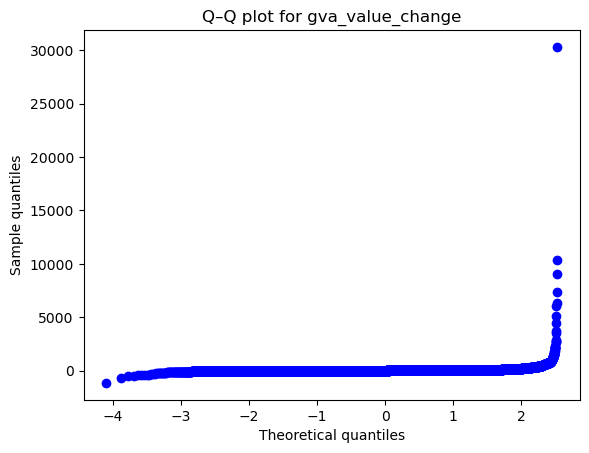

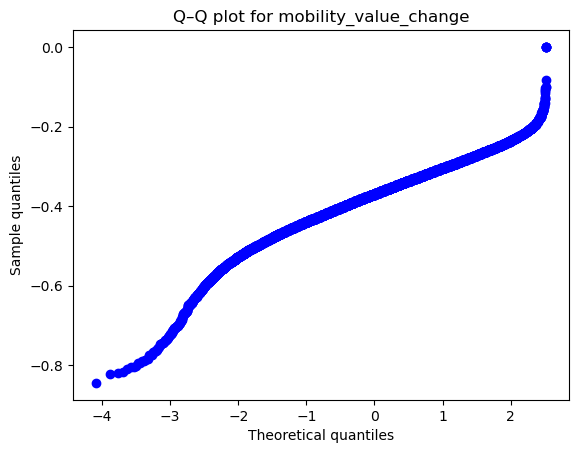

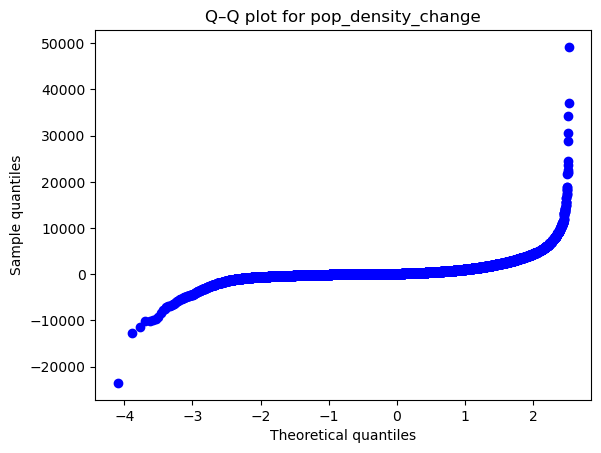

In [147]:
# qq plot for absolute vals - change_gdf
pct_cols = [
    'vineyard_count_change', 'vineyard_area_change', 'imd_score_change', 'D_median_price_change', 'F_median_price_change', 
    'O_median_price_change', 'S_median_price_change', 'T_median_price_change', 'all_median_price_change', 'total_pop_change', 
    'pct_kids_change', 'pct_young_adults_change', 'pct_middle_aged_change', 'pct_older_adults_change', 'pct_seniors_change', 
    'gva_value_change', 'mobility_value_change', 'pop_density_change'
]

for col in pct_cols:
    plt.figure()  # one separate figure per plot
    stats.probplot(change_gdf[col], dist="norm", plot=plt)
    plt.title(f"Q–Q plot for {col}")
    plt.xlabel("Theoretical quantiles")
    plt.ylabel("Sample quantiles")
    plt.show()

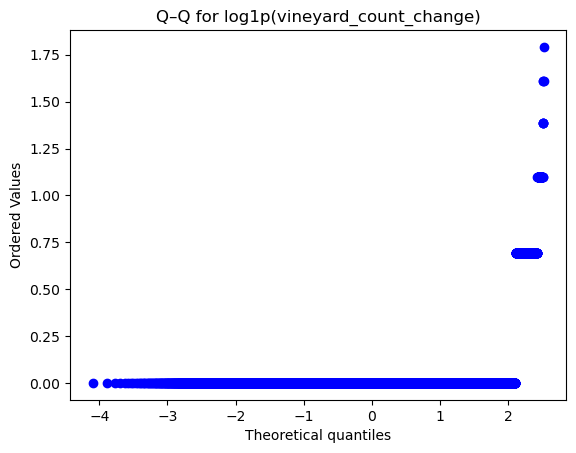

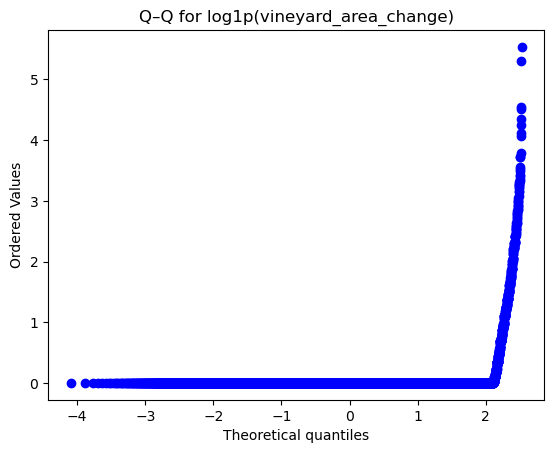

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


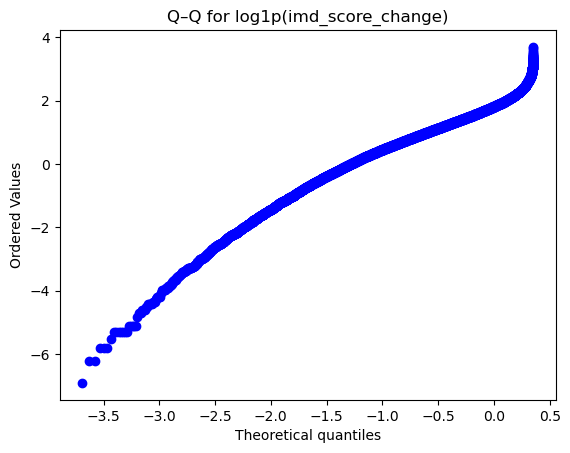

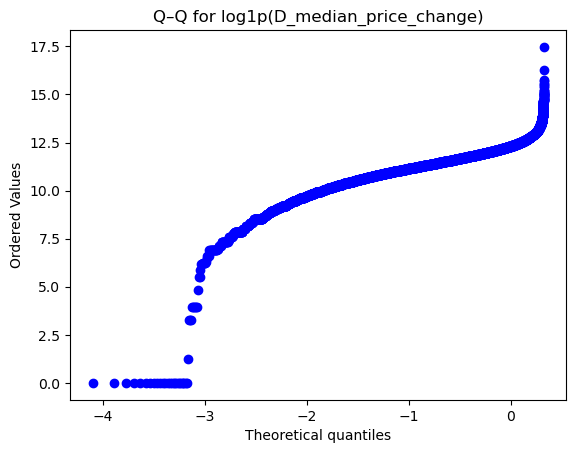

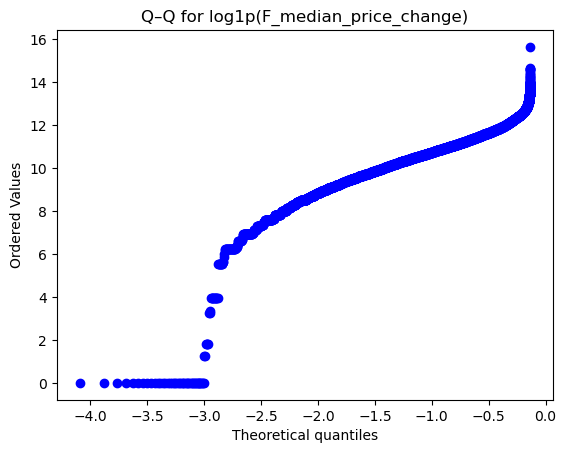

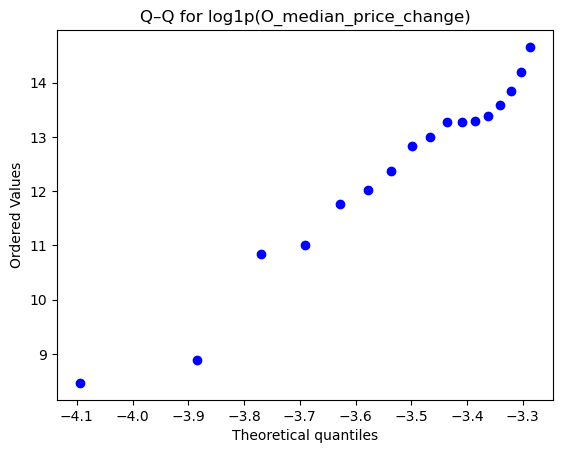

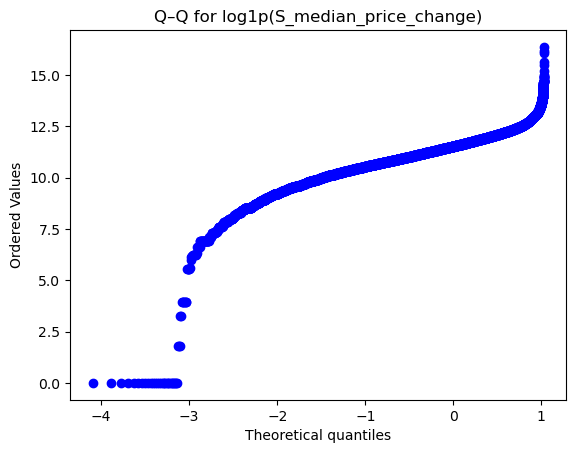

...

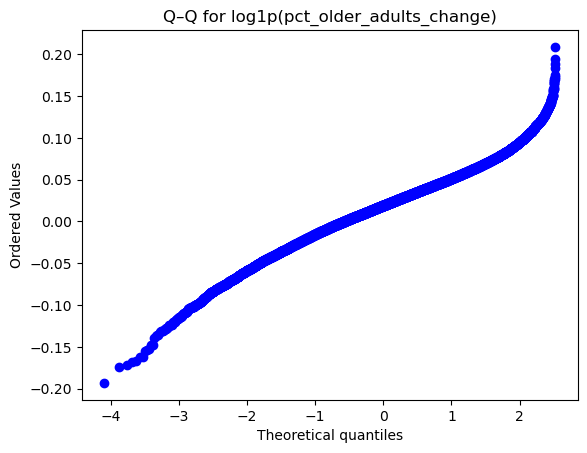

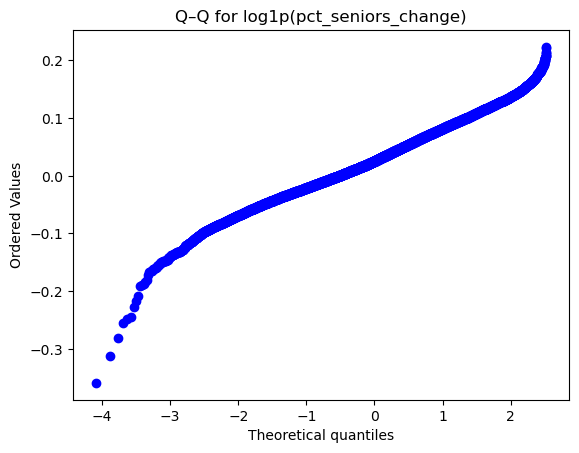

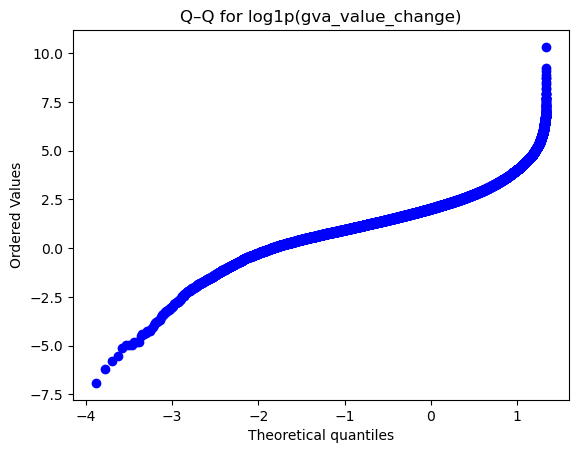

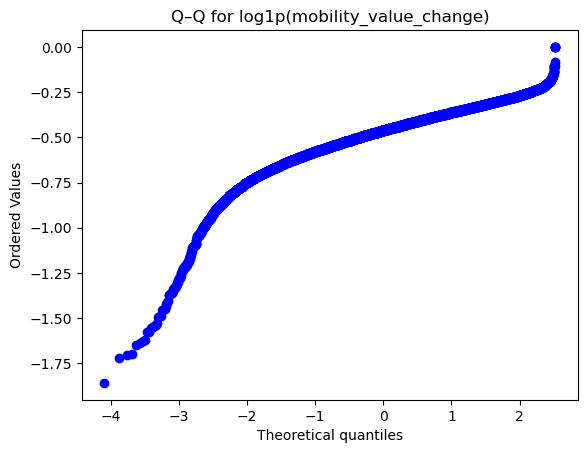

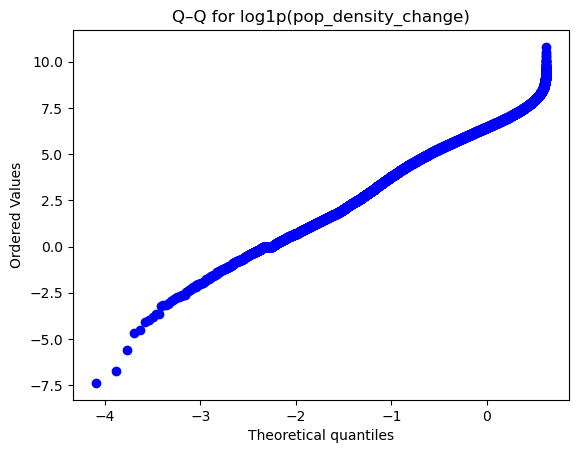

In [148]:
# qq plot for absolute vals (log transformed) - change_gdf
for col in [
    'vineyard_count_change', 'vineyard_area_change', 'imd_score_change', 'D_median_price_change', 'F_median_price_change', 
    'O_median_price_change', 'S_median_price_change', 'T_median_price_change', 'all_median_price_change', 'total_pop_change', 
    'pct_kids_change', 'pct_young_adults_change', 'pct_middle_aged_change', 'pct_older_adults_change', 'pct_seniors_change', 
    'gva_value_change', 'mobility_value_change', 'pop_density_change'
]:
    transformed = np.log1p(change_gdf[col])
    plt.figure()
    stats.probplot(transformed, dist='norm', plot=plt)
    plt.title(f"Q–Q for log1p({col})")
    plt.show()

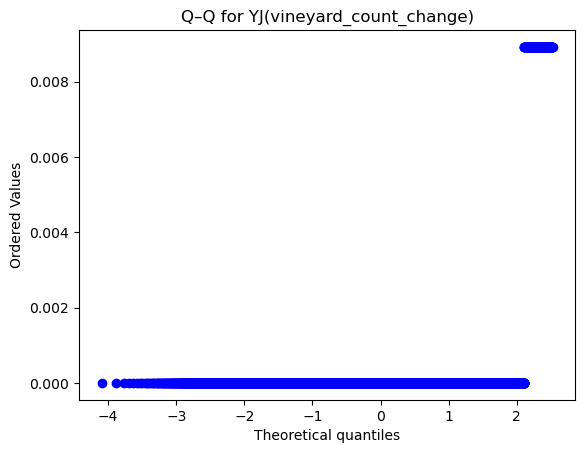

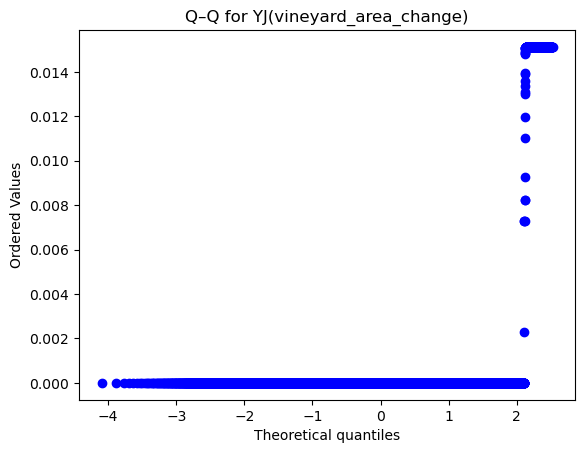

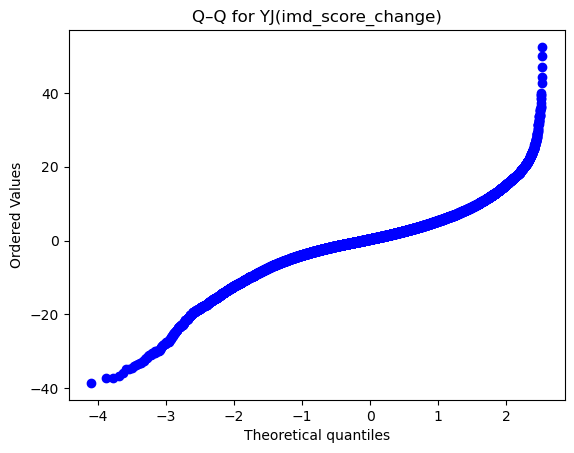

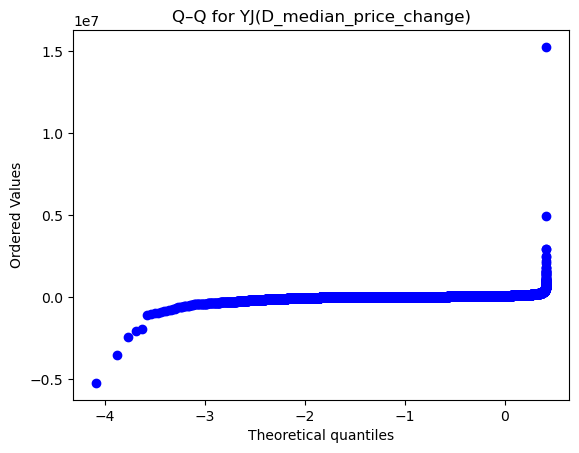

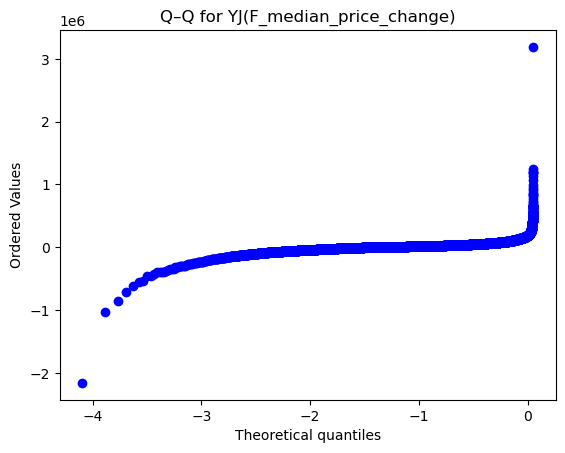

...

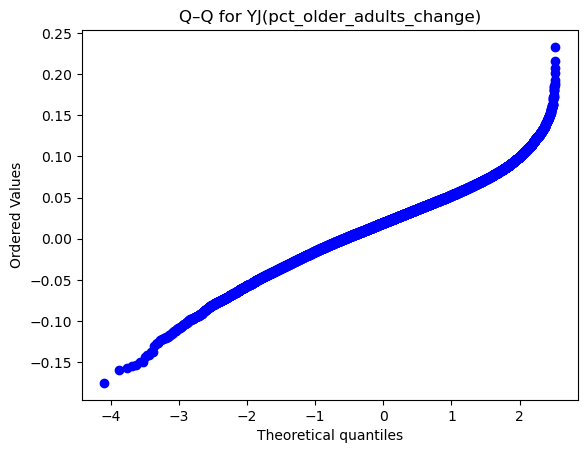

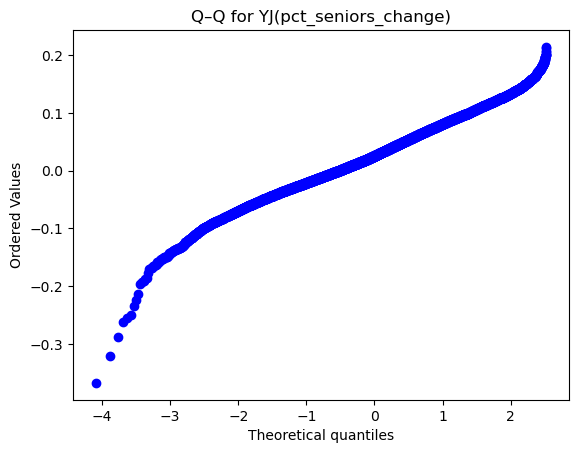

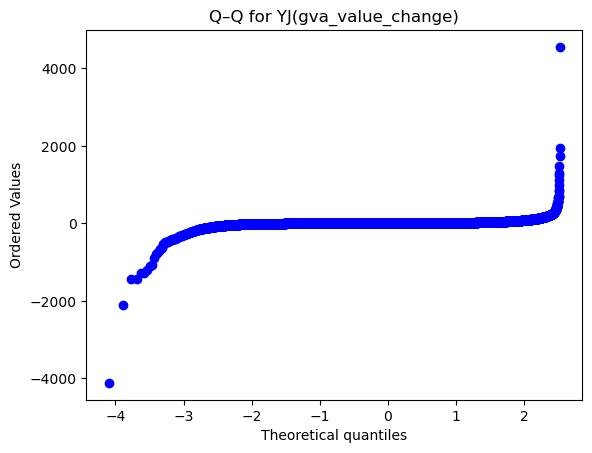

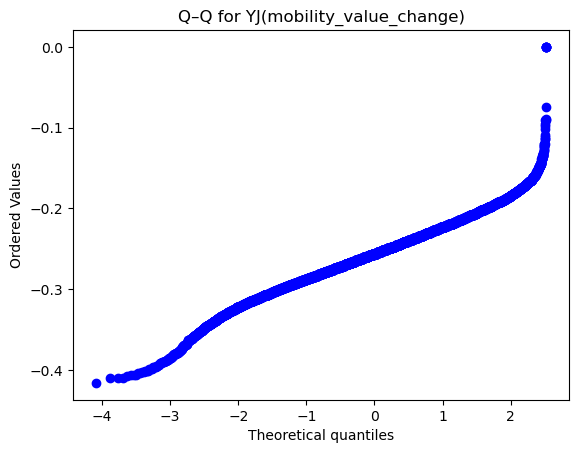

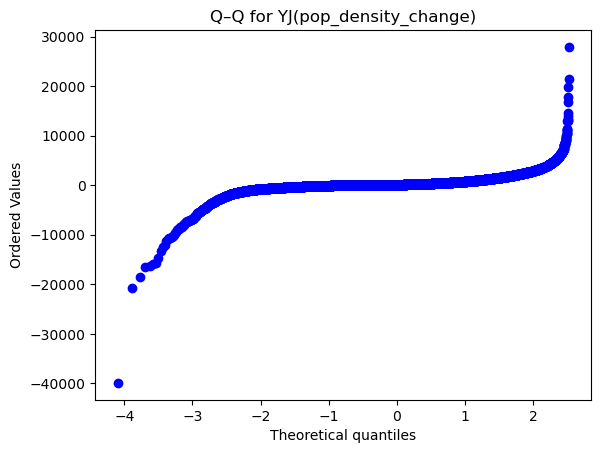

In [149]:
# qq plot for absolute vals (yeo-johnson) - change_gdf
pt = PowerTransformer(method='yeo-johnson', standardize=False)
for col in [
    'vineyard_count_change', 'vineyard_area_change', 'imd_score_change', 'D_median_price_change', 'F_median_price_change', 
    'O_median_price_change', 'S_median_price_change', 'T_median_price_change', 'all_median_price_change', 'total_pop_change', 
    'pct_kids_change', 'pct_young_adults_change', 'pct_middle_aged_change', 'pct_older_adults_change', 'pct_seniors_change', 
    'gva_value_change', 'mobility_value_change', 'pop_density_change'
]:
    transformed = pt.fit_transform(change_gdf[[col]])[:,0]
    plt.figure()
    stats.probplot(transformed, dist='norm', plot=plt)
    plt.title(f"Q–Q for YJ({col})")
    plt.show()

---

# 3. Analysis

In [76]:
vineyard_points_gdf.columns

Index(['Name', 'Type', 'County', 'Region', 'postcode', 'X (easting) [added]',
       'Y (northing) [added]', 'Latitude [added]', 'Longitude [added]',
       'Country', 'Website', 'Grapes', 'AreaPlanted', 'YearFirstPlanted',
       'Org_Bio', 'Open To Public', 'Postcode [added]', 'Description [added]',
       'Grid Reference [added]', 'LSOA11CD', 'LSOA11NM', 'northing', 'easting',
       'geometry'],
      dtype='object')

In [153]:
output_folder = 'output'

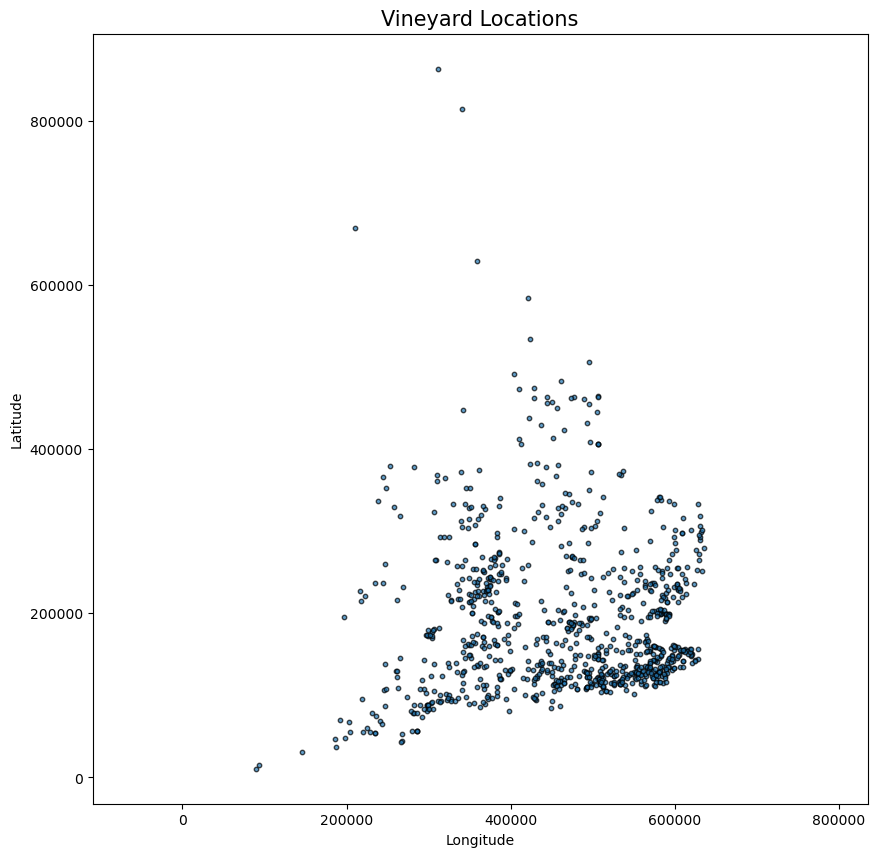

In [213]:
# plot vineyard points
fig, ax = plt.subplots(figsize=(10, 10))
vineyard_points_gdf.plot(ax=ax, markersize=10, alpha=0.7, edgecolor='k')

# Add some map basics
ax.set_title('Vineyard Locations', fontsize=15)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.axis('equal')
plt.show()

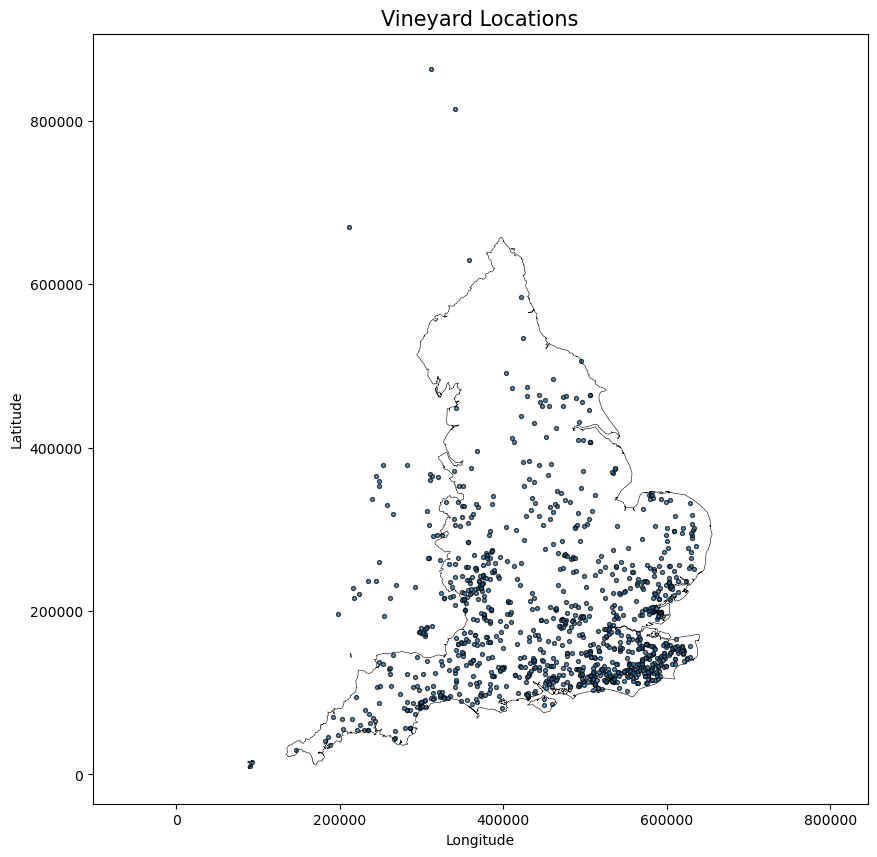

In [309]:
fig, ax = plt.subplots(figsize=(10, 10))
vineyard_points_gdf.plot(ax=ax, markersize=8, alpha=0.7, edgecolor='k')

# overlay England boundary
england.boundary.plot(ax=ax,
                         edgecolor='black',
                         linewidth=0.4)

ax.set_title('Vineyard Locations', fontsize=15)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.axis('equal')
plt.show()

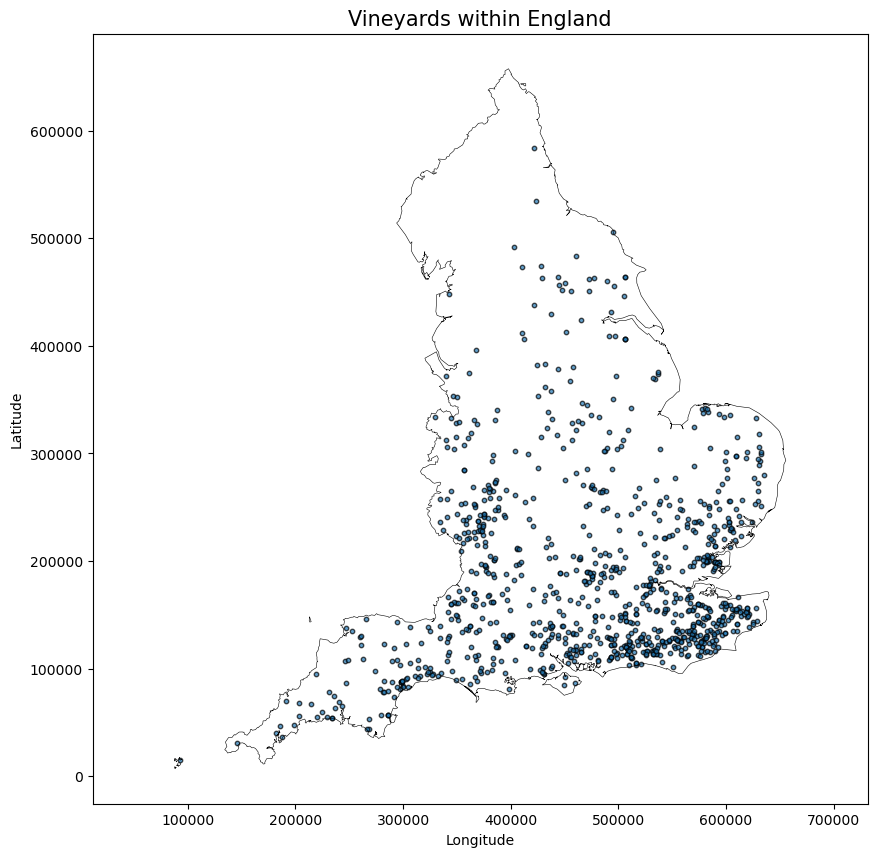

In [315]:
#make sure both layers use the same CRS
vineyard_points_gdf = vineyard_points_gdf.to_crs(england.crs)

# simple mask with unary_union + .within()
england_poly = england.unary_union
vineyards_in_england = vineyard_points_gdf[
    vineyard_points_gdf.within(england_poly)
]

# plot 
fig, ax = plt.subplots(figsize=(10, 10))
england.boundary.plot(ax=ax, edgecolor='black', linewidth=0.4)
vineyards_in_england.plot(ax=ax, markersize=10, alpha=0.7, edgecolor='k')

ax.set_title('Vineyards within England', fontsize=15)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.axis('equal')
plt.show()

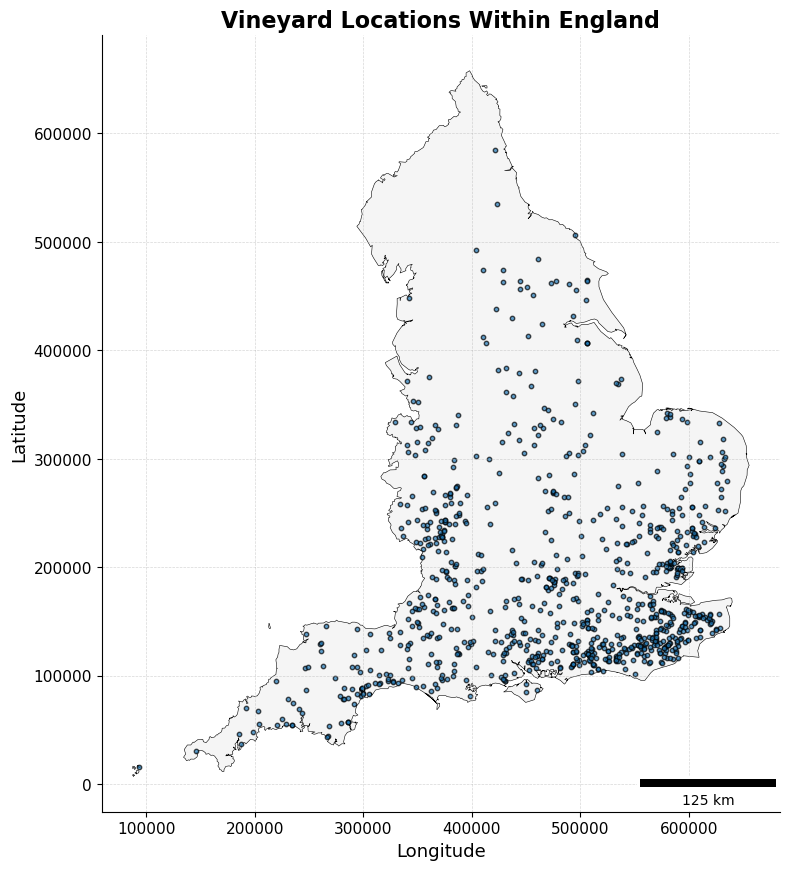

In [214]:
# Make sure share the same CRS
vineyard_points_gdf = vineyard_points_gdf.to_crs(england.crs)

# Mask vineyards within England
england_poly = england.unary_union
vineyards_in_england = vineyard_points_gdf[
    vineyard_points_gdf.within(england_poly)
]

# plot
fig, ax = plt.subplots(figsize=(8, 10))  # Portrait for England's shape
england.plot(ax=ax, color='whitesmoke', edgecolor='black', linewidth=0.4)
vineyards_in_england.plot(ax=ax, markersize=10, alpha=0.7, edgecolor='k')
ax.set_title('Vineyard Locations Within England', fontsize=16, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=13)
ax.set_ylabel('Latitude', fontsize=13)
ax.tick_params(labelsize=11)
ax.set_aspect('equal')
scalebar = ScaleBar(1, location='lower right')  # Assuming meters
ax.add_artist(scalebar)
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()

fig.savefig(os.path.join(output_folder, 'vineyards_within_england_academic_map.png'), dpi=300, bbox_inches='tight')

plt.show()

In [215]:
print(f"Number of vineyard points: {len(vineyards_in_england)}")

Number of vineyard points: 874


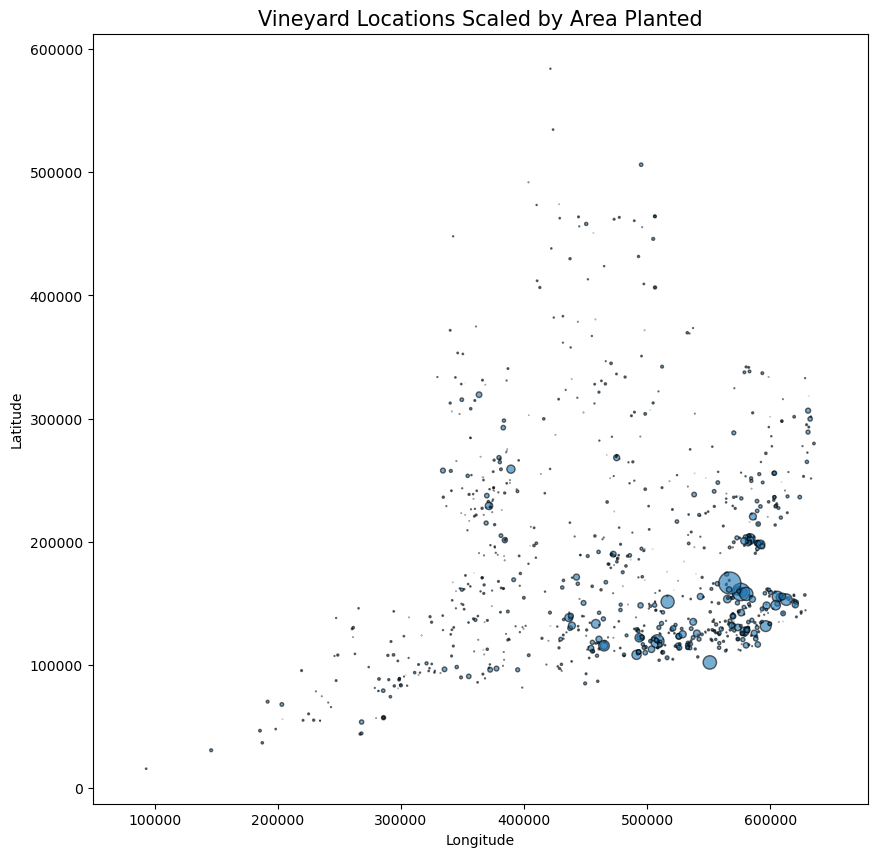

In [216]:
# plot vineyard points scaled by 'AreaPlanted'
fig, ax = plt.subplots(figsize=(10, 10))
vineyards_in_england.plot(
    ax=ax,
    markersize=vineyards_in_england['AreaPlanted'],  # Scale size
    alpha=0.6,
    edgecolor='black'
)

# Map basics
ax.set_title('Vineyard Locations Scaled by Area Planted', fontsize=15)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.axis('equal')
plt.show()

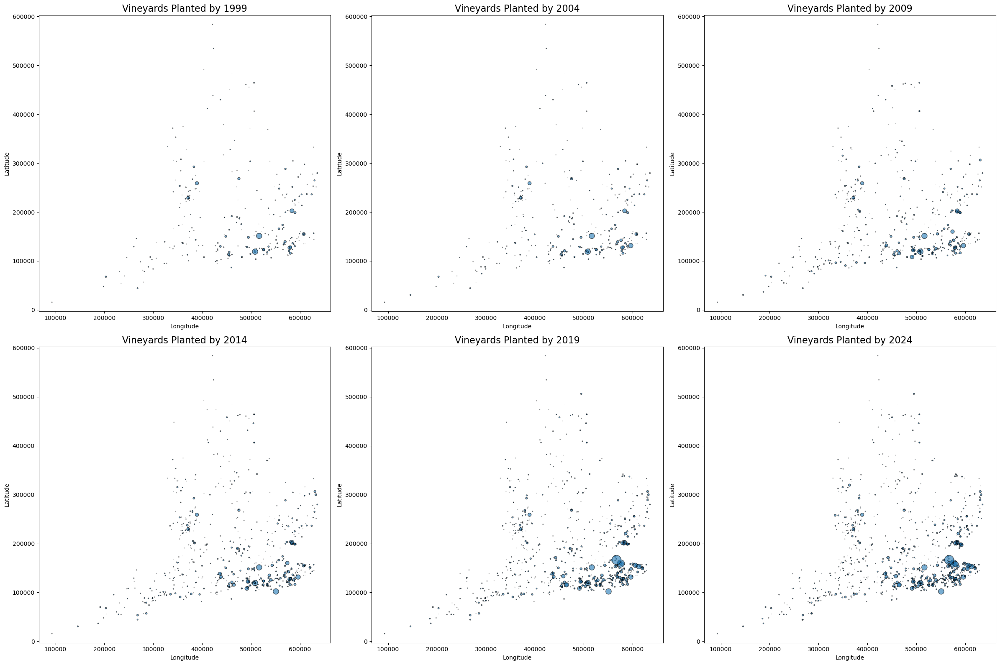

In [217]:
# mapping vineyard locations at 5-year intervals from 1999

# Define the cut-off years
cutoff_years = [1999, 2004, 2009, 2014, 2019, 2024]


fig, axes = plt.subplots(2, 3, figsize=(24, 16))
axes = axes.flatten()

# Loop through each cutoff year and plot
for idx, year in enumerate(cutoff_years):
    # Filter vineyards planted on or before the cutoff year
    filtered_vineyards = vineyards_in_england[vineyards_in_england['YearFirstPlanted'] <= year]
    
    # Plot
    filtered_vineyards.plot(
        ax=axes[idx],
        markersize=filtered_vineyards['AreaPlanted'],
        alpha=0.6,
        edgecolor='black'
    )

    axes[idx].set_title(f'Vineyards Planted by {year}', fontsize=16)
    axes[idx].set_xlabel('Longitude')
    axes[idx].set_ylabel('Latitude')
    axes[idx].axis('equal')

# Remove empty subplots
for i in range(len(cutoff_years), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

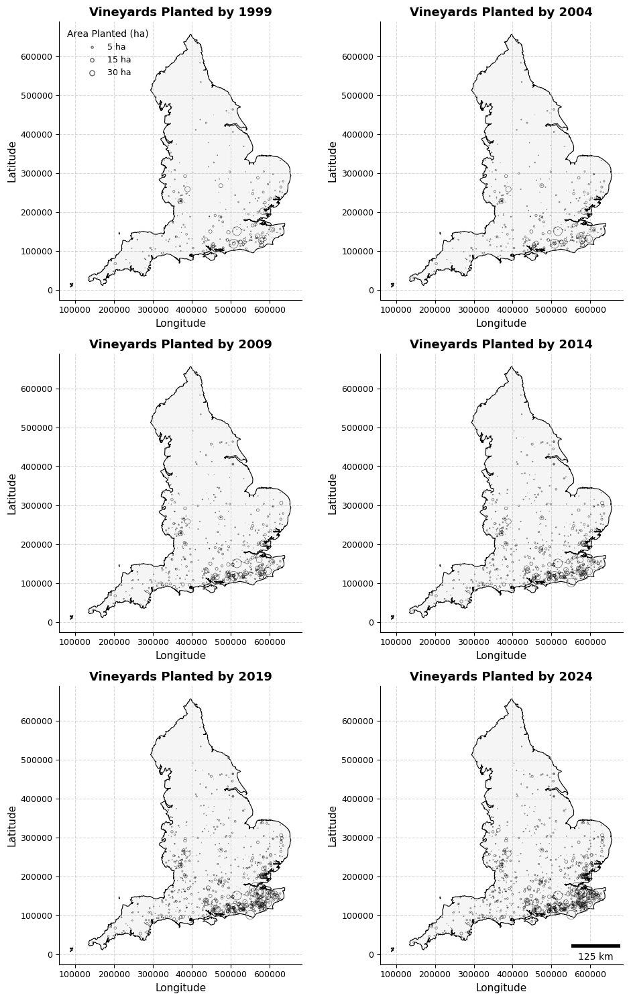

In [218]:
# Define the cut-off years
cutoff_years = [1999, 2004, 2009, 2014, 2019, 2024]

# Create subplots: 3 rows x 2 columns
fig, axes = plt.subplots(3, 2, figsize=(10, 15))  # Portrait A4-friendly

# Flatten axes array for easy iteration
axes = axes.flatten()

# Loop through each cutoff year and plot
for idx, year in enumerate(cutoff_years):
    ax = axes[idx]
    
    england.plot(
        ax=ax,
        color='whitesmoke',
        edgecolor='black',
        linewidth=0.8
    )

    filtered_vineyards = vineyards_in_england[
        vineyards_in_england['YearFirstPlanted'] <= year
    ]

    filtered_vineyards.plot(
        ax=ax,
        markersize=filtered_vineyards['AreaPlanted'],
        alpha=0.6,
        facecolor='none',
        edgecolor='black',
        linewidth=0.5
    )
    
  
    ax.set_title(f'Vineyards Planted by {year}', fontsize=13, fontweight='bold')
    ax.set_xlabel('Longitude', fontsize=11)
    ax.set_ylabel('Latitude', fontsize=11)
    ax.tick_params(labelsize=9)
    ax.set_aspect('equal')
    
   
    ax.grid(True, linestyle='--', alpha=0.5)

    # Remove top and right spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Remove extra empty subplots
for i in range(len(cutoff_years), len(axes)):
    fig.delaxes(axes[i])

# scale bar 
scalebar = ScaleBar(1, location='lower right', units='m', dimension='si-length')  # Assuming meters CRS
axes[-1].add_artist(scalebar)

# Add a manual legend for vineyard point sizes
legend_sizes = [5, 15, 30]  # Example vineyard areas in hectares
legend_labels = ['5 ha', '15 ha', '30 ha']

legend_handles = [
    plt.scatter([], [], s=size, facecolors='none', edgecolors='black', label=label, alpha=0.6)
    for size, label in zip(legend_sizes, legend_labels)
]

axes[0].legend(
    handles=legend_handles,
    title='Area Planted (ha)',
    loc='upper left',
    fontsize=9,
    title_fontsize=10,
    frameon=False
)

plt.tight_layout()


fig.savefig(os.path.join(output_folder, 'vineyards_by_cutoff_years_3x2_scaled.png'), dpi=300, bbox_inches='tight')

plt.show()

In [219]:
# Dictionary to store results
cumulative_area_by_year = {}

# Loop through each cutoff year
for year in cutoff_years:
    # Filter vineyards planted on or before the cutoff year
    filtered_vineyards = vineyards_in_england[vineyards_in_england['YearFirstPlanted'] <= year]
    
    # Sum the 'AreaPlanted'
    total_area = filtered_vineyards['AreaPlanted'].sum()
    
    # Store the result
    cumulative_area_by_year[year] = total_area

# Print results with changes
print("Cumulative Vineyard Area by Year (hectares):")
previous_area = None
for year, area in cumulative_area_by_year.items():
    if previous_area is None:
        # First interval — no change to report
        print(f"{year}: {area:.2f} ha")
    else:
        # Calculate absolute and % change
        absolute_change = area - previous_area
        percent_change = (absolute_change / previous_area) * 100 if previous_area != 0 else float('inf')
        print(f"{year}: {area:.2f} ha (+{absolute_change:.2f} ha / +{percent_change:.1f}%)")
    
    previous_area = area

Cumulative Vineyard Area by Year (hectares):
1999: 967.28 ha
2004: 1141.62 ha (+174.34 ha / +18.0%)
2009: 1842.66 ha (+701.05 ha / +61.4%)
2014: 2338.52 ha (+495.86 ha / +26.9%)
2019: 3752.31 ha (+1413.79 ha / +60.5%)
2024: 4303.45 ha (+551.14 ha / +14.7%)


In [220]:
cumulative_area_by_year

{1999: 967.2798000000001,
 2004: 1141.6174,
 2009: 1842.6634,
 2014: 2338.52,
 2019: 3752.3076,
 2024: 4303.4494}

In [221]:
cumulative_area_by_year

{1999: 967.2798000000001,
 2004: 1141.6174,
 2009: 1842.6634,
 2014: 2338.52,
 2019: 3752.3076,
 2024: 4303.4494}

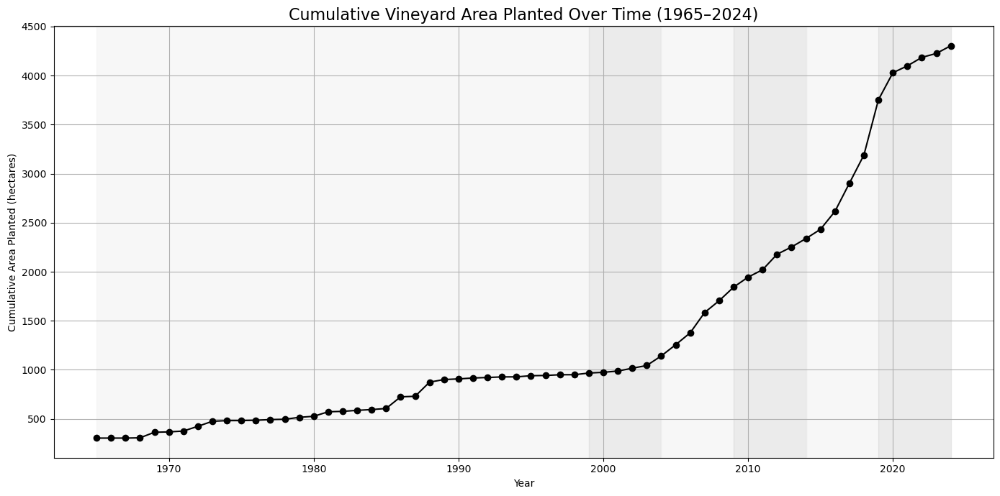

In [222]:
# 1. Create a list of years from 1965 to 2024
years = list(range(1965, 2025))  # Inclusive of 2024

# 2. Calculate cumulative area planted for each year
cumulative_area_by_year = {}

for year in years:
    filtered_vineyards = vineyards_in_england[vineyards_in_england['YearFirstPlanted'] <= year]
    total_area = filtered_vineyards['AreaPlanted'].sum()
    cumulative_area_by_year[year] = total_area

# 3. Convert to pandas DataFrame
cumulative_area_df = pd.DataFrame({
    'Year': list(cumulative_area_by_year.keys()),
    'CumulativeAreaHa': list(cumulative_area_by_year.values())
})

# 4. Plot the line chart
fig, ax = plt.subplots(figsize=(14, 7))

# Plot line
ax.plot(cumulative_area_df['Year'], cumulative_area_df['CumulativeAreaHa'], marker='o', color='black')
ax.set_title('Cumulative Vineyard Area Planted Over Time (1965–2024)', fontsize=16)
ax.set_xlabel('Year')
ax.set_ylabel('Cumulative Area Planted (hectares)')
ax.grid(True)

# 5. Shade intervals
intervals = [(1965, 1999), (1999, 2004), (2004, 2009), (2009, 2014), (2014, 2019), (2019, 2024)]
colors = ['#f0f0f0', '#d9d9d9']  # Two light greys alternating

for idx, (start, end) in enumerate(intervals):
    ax.axvspan(start, end, color=colors[idx % 2], alpha=0.5)

plt.tight_layout()
plt.show()


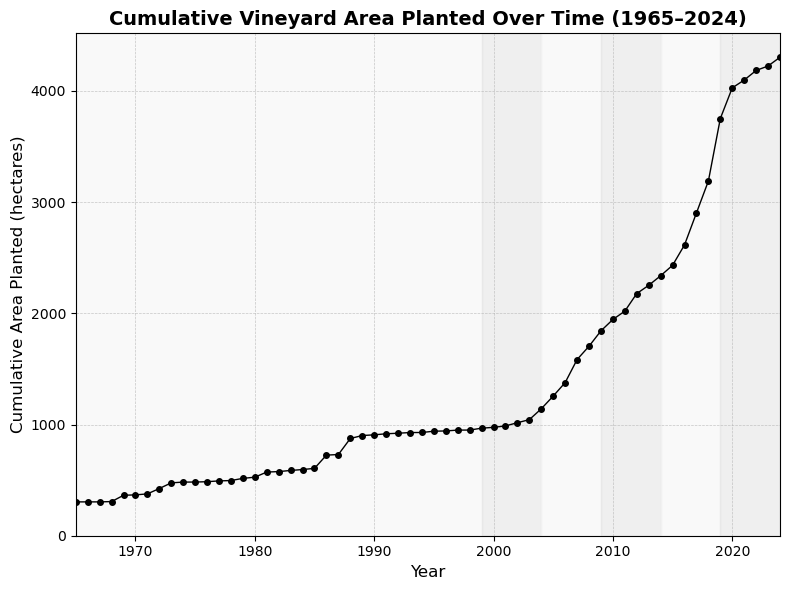

In [223]:
# 1. Create a list of years from 1965 to 2024
years = list(range(1965, 2025))

# 2. Calculate cumulative area planted for each year
cumulative_area_by_year = {}

for year in years:
    filtered_vineyards = vineyards_in_england[
        vineyards_in_england['YearFirstPlanted'] <= year
    ]
    total_area = filtered_vineyards['AreaPlanted'].sum()
    cumulative_area_by_year[year] = total_area

# 3. Convert to pandas DataFrame
cumulative_area_df = pd.DataFrame({
    'Year': list(cumulative_area_by_year.keys()),
    'CumulativeAreaHa': list(cumulative_area_by_year.values())
})

# 4. Plot
fig, ax = plt.subplots(figsize=(8, 6))  # Academic size for portrait or journal page

# Shaded intervals first
intervals = [(1965, 1999), (1999, 2004), (2004, 2009), (2009, 2014), (2014, 2019), (2019, 2024)]
colors = ['#f5f5f5', '#e0e0e0']  # Lighter shades of grey

for idx, (start, end) in enumerate(intervals):
    ax.axvspan(start, end, color=colors[idx % 2], alpha=0.5)

# Then the line
ax.plot(
    cumulative_area_df['Year'], 
    cumulative_area_df['CumulativeAreaHa'], 
    marker='o', 
    markersize=4, 
    color='black', 
    linewidth=1
)

# Styling
ax.set_title('Cumulative Vineyard Area Planted Over Time (1965–2024)', fontsize=14, fontweight='bold')
ax.set_xlabel('Year', fontsize=12)
ax.set_ylabel('Cumulative Area Planted (hectares)', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=10)
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

ax.set_xlim(1965, 2024)
ax.set_ylim(0, cumulative_area_df['CumulativeAreaHa'].max() * 1.05)  # Little headroom


plt.tight_layout()

# Save the fig
fig.savefig(os.path.join(output_folder, 'cumulative_vineyard_area_plot.png'), dpi=300, bbox_inches='tight')

plt.show()

## cleaning

In [224]:
print(vineyards_in_england.geometry.is_empty.sum())  # Empty geometries?
print(vineyards_in_england.geometry.has_z.sum())     # 3D coordinates?
print(vineyards_in_england.geometry.x.isna().sum())  # NaNs in x?
print(vineyards_in_england.geometry.y.isna().sum())  # NaNs in y?

0
0
0
0


In [225]:
# clean geoms - remove empty geoms

# remove empty geometries
vineyards_in_england = vineyards_in_england[~vineyards_in_england.geometry.is_empty]

# prep coordinates
coords = np.vstack([vineyards_in_england.geometry.x, vineyards_in_england.geometry.y])

## KDE - heatmaps!

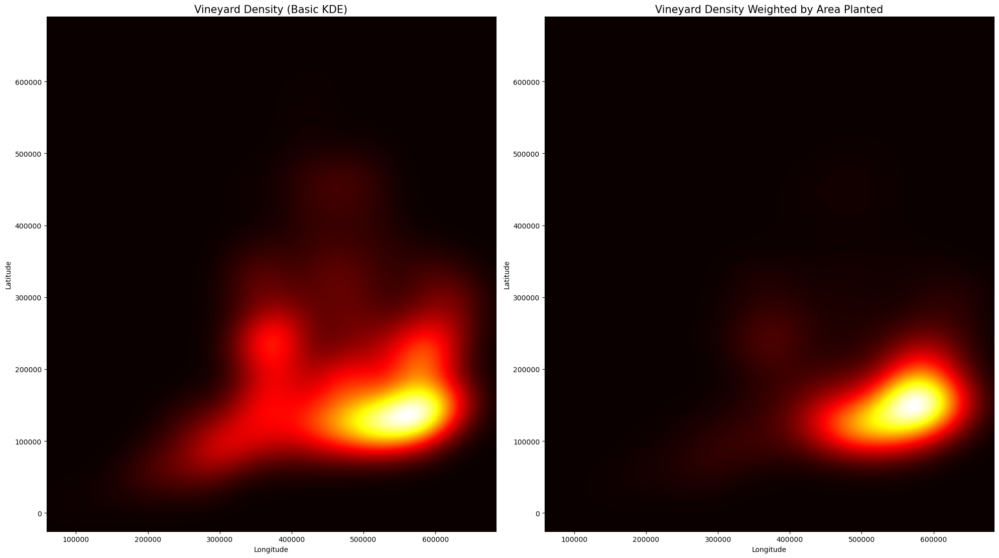

In [226]:
# KDE - making some heatmaps (one for count, ome weighted by 'AreaPlanted')

# KDE without weighting (basic density)
kde = gaussian_kde(coords)

# KDE with weighting by 'AreaPlanted'
weights = vineyards_in_england['AreaPlanted']
kde_weighted = gaussian_kde(coords, weights=weights)

# create a grid to evaluate the KDE
   # get total bounds of points or boundary
xmin, ymin, xmax, ymax = england.total_bounds
   # add a buffer (5% of map size)
x_buffer = (xmax - xmin) * 0.05
y_buffer = (ymax - ymin) * 0.05
xmin -= x_buffer
xmax += x_buffer
ymin -= y_buffer
ymax += y_buffer
   # create a grid with that buffer
X, Y = np.mgrid[xmin:xmax:500j, ymin:ymax:500j]  # 500x500 grid

positions = np.vstack([X.ravel(), Y.ravel()])

Z_basic = np.reshape(kde(positions).T, X.shape)
Z_weighted = np.reshape(kde_weighted(positions).T, X.shape)

# plot both heatmaps
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 14))

# basic (count) density heatmap
ax1.imshow(np.rot90(Z_basic), extent=[xmin, xmax, ymin, ymax], cmap=plt.cm.hot)
ax1.set_title('Vineyard Density (Basic KDE)', fontsize=15)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')

# weighted (areaplanted) density heatmap 
ax2.imshow(np.rot90(Z_weighted), extent=[xmin, xmax, ymin, ymax], cmap=plt.cm.hot)
ax2.set_title('Vineyard Density Weighted by Area Planted', fontsize=15)
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')

plt.tight_layout()
plt.show()

In [227]:
# 1. Get vineyard coordinates
coords = np.vstack([vineyard_points_gdf.geometry.x, vineyard_points_gdf.geometry.y])

# 2. Basic KDE
kde_basic = gaussian_kde(coords)

# 3. Weighted KDE (if you have area planted info)
weights = vineyard_points_gdf['AreaPlanted']
kde_weighted = gaussian_kde(coords, weights=weights)

# 4. Create meshgrid for evaluation
xmin, ymin, xmax, ymax = vineyard_points_gdf.total_bounds
X, Y = np.mgrid[xmin:xmax:500j, ymin:ymax:500j]  # Adjust 500j to control resolution
positions = np.vstack([X.ravel(), Y.ravel()])

# 5. Evaluate the KDE on the grid
Z_basic = np.reshape(kde_basic(positions).T, X.shape)
Z_weighted = np.reshape(kde_weighted(positions).T, X.shape)

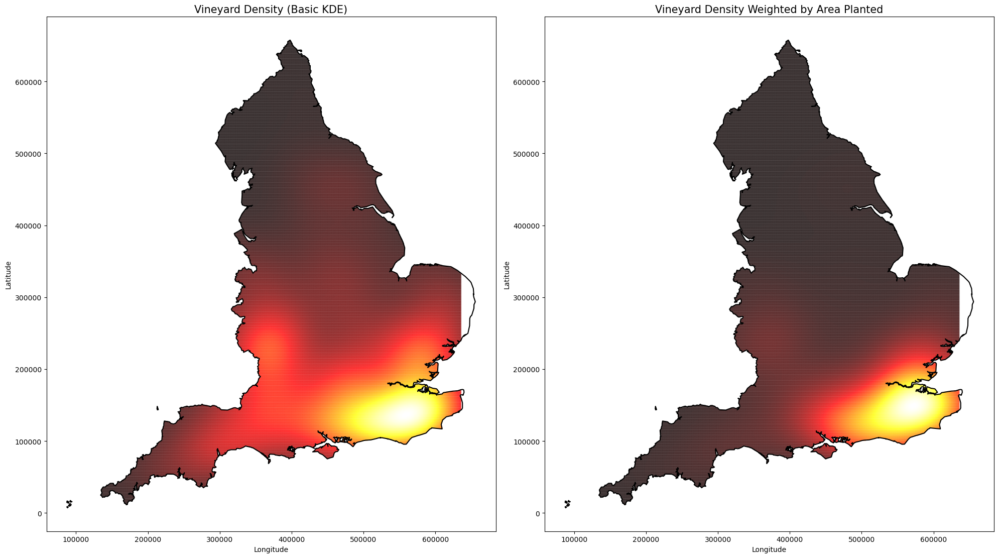

In [228]:
# Basic KDE
heatmap_points_basic = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(X.ravel(), Y.ravel()),
    data={'intensity': Z_basic.ravel()},
    crs=vineyard_points_gdf.crs
)

# Weighted KDE
heatmap_points_weighted = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(X.ravel(), Y.ravel()),
    data={'intensity': Z_weighted.ravel()},
    crs=vineyard_points_gdf.crs
)

# 6. Clip both heatmaps by England boundary
heatmap_clipped_basic = gpd.clip(heatmap_points_basic, england)
heatmap_clipped_weighted = gpd.clip(heatmap_points_weighted, england)

# 7. Plot both clipped heatmaps
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 14))

# Basic (count) density heatmap
england.boundary.plot(ax=ax1, color='black')
heatmap_clipped_basic.plot(ax=ax1, column='intensity', cmap='hot', markersize=1, alpha=0.6)
ax1.set_title('Vineyard Density (Basic KDE)', fontsize=15)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')

# Weighted (area planted) density heatmap
england.boundary.plot(ax=ax2, color='black')
heatmap_clipped_weighted.plot(ax=ax2, column='intensity', cmap='hot', markersize=1, alpha=0.6)
ax2.set_title('Vineyard Density Weighted by Area Planted', fontsize=15)
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')

plt.tight_layout()
plt.show()

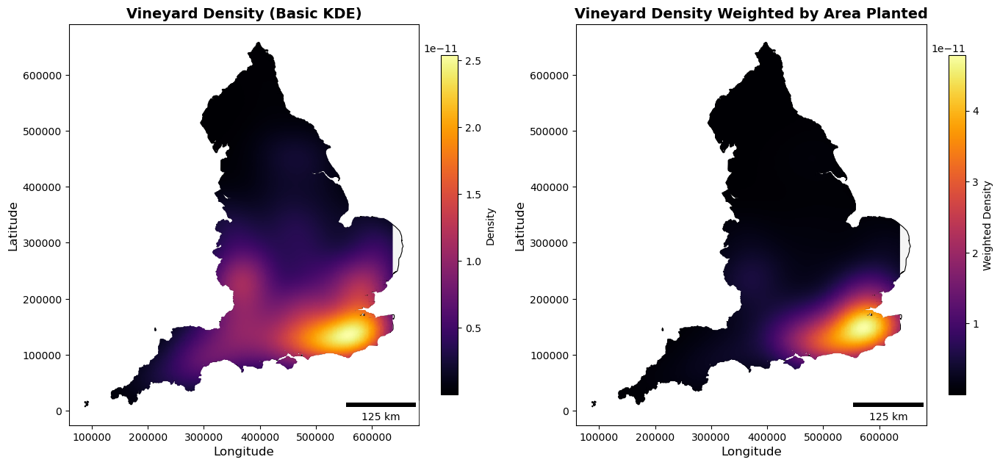

In [229]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 8))

# Shared settings
for ax in [ax1, ax2]:
    england.plot(
        ax=ax,
        color='whitesmoke',         
        edgecolor='black',
        linewidth=0.8
    )

# Basic (count) density heatmap
plot_basic = heatmap_clipped_basic.plot(
    ax=ax1,
    column='intensity',
    cmap='inferno',              
    markersize=1,
    alpha=0.8,
    legend=True,
    legend_kwds={'label': "Density", 'shrink': 0.6}
)

ax1.set_title('Vineyard Density (Basic KDE)', fontsize=14, fontweight='bold')
ax1.set_xlabel('Longitude', fontsize=12)
ax1.set_ylabel('Latitude', fontsize=12)
ax1.tick_params(labelsize=10)
ax1.set_aspect('equal')

#  scalebar
scalebar1 = ScaleBar(1, location='lower right')
ax1.add_artist(scalebar1)

# Weighted (area planted) density heatmap
plot_weighted = heatmap_clipped_weighted.plot(
    ax=ax2,
    column='intensity',
    cmap='inferno',
    markersize=1,
    alpha=0.8,
    legend=True,
    legend_kwds={'label': "Weighted Density", 'shrink': 0.6}
)

ax2.set_title('Vineyard Density Weighted by Area Planted', fontsize=14, fontweight='bold')
ax2.set_xlabel('Longitude', fontsize=12)
ax2.set_ylabel('Latitude', fontsize=12)
ax2.tick_params(labelsize=10)
ax2.set_aspect('equal')

scalebar2 = ScaleBar(1, location='lower right')
ax2.add_artist(scalebar2)

plt.tight_layout()

fig.savefig(os.path.join(output_folder, 'vineyard_density_kde_maps.png'), dpi=300, bbox_inches='tight')

plt.show()

## Clustering!

### Point Based (count) - dbscan

In [230]:
# dbscan - spatial clustering identification (basic on location / count)

# extract coords
coords = np.array(list(zip(vineyards_in_england.geometry.x, vineyards_in_england.geometry.y)))

########
min_samples_val = 10
eps_val = 10000
########

# run dbscan
db = DBSCAN(eps=eps_val, min_samples=min_samples_val).fit(coords)  # eps = distance threshold

# assign cluster labels
vineyards_in_england['cluster'] = db.labels_

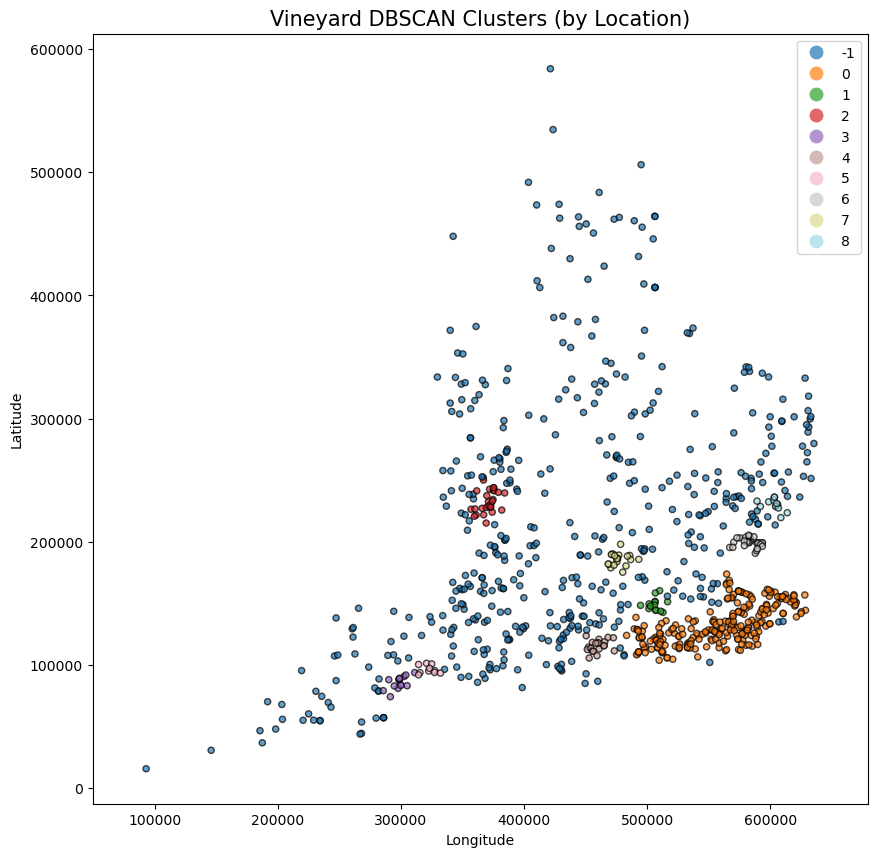

In [231]:

fig, ax = plt.subplots(figsize=(10, 10))

# Plot the points, colored by cluster
unique_clusters = vineyards_in_england['cluster'].unique()
n_clusters = len(unique_clusters)
cmap = plt.get_cmap('tab20', n_clusters)

# Plot vineyard points
vineyards_in_england.plot(
    ax=ax,
    column='cluster',
    categorical=True,
    legend=True,
    markersize=20,
    cmap=cmap,
    alpha=0.7,
    edgecolor='black'
)

# Title and axes
ax.set_title('Vineyard DBSCAN Clusters (by Location)', fontsize=15)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.axis('equal')
plt.show()

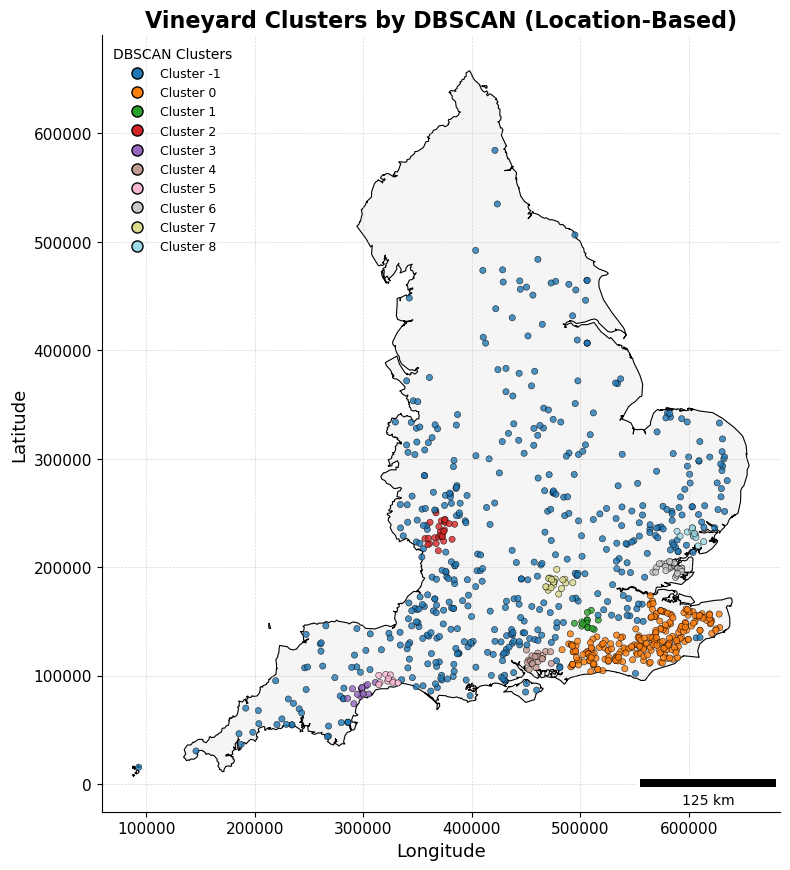

In [232]:

fig, ax = plt.subplots(figsize=(8, 10))  # Portrait-oriented for England

# Plot England boundary
england.plot(
    ax=ax,
    color='whitesmoke',    # Light grey background
    edgecolor='black',
    linewidth=0.8
)

# Get cluster info
unique_clusters = sorted(vineyards_in_england['cluster'].unique())
n_clusters = len(unique_clusters)
cmap = plt.get_cmap('tab20', n_clusters)

# Plot vineyard points, colored by cluster
vineyards_in_england.plot(
    ax=ax,
    column='cluster',
    categorical=True,
    cmap=cmap,
    markersize=20,
    alpha=0.8,
    edgecolor='black',
    linewidth=0.4,
    legend=False  
)

# Add a custom legend
legend_elements = [
    Line2D(
        [0], [0], marker='o', color='w',
        label=f'Cluster {int(c)}',
        markerfacecolor=cmap(i),
        markeredgecolor='black',
        markersize=8
    )
    for i, c in enumerate(unique_clusters)
]

ax.legend(
    handles=legend_elements,
    title='DBSCAN Clusters',
    loc='upper left',
    fontsize=9,
    title_fontsize=10,
    frameon=False
)

# Map basics
ax.set_title('Vineyard Clusters by DBSCAN (Location-Based)', fontsize=16, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=13)
ax.set_ylabel('Latitude', fontsize=13)
ax.tick_params(labelsize=11)
ax.set_aspect('equal')

# scalebar
scalebar = ScaleBar(1, location='lower right')  # Assumes meters CRS
ax.add_artist(scalebar)

# subtle gridlines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)

# Remove unnecessary spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

fig.savefig(os.path.join(output_folder, 'vineyard_clusters_dbscan_academic.png'), dpi=300, bbox_inches='tight')

plt.show()

### Weighted (by area planted) - several options

In [233]:
vineyards_in_england.columns

Index(['Name', 'Type', 'County', 'Region', 'postcode', 'X (easting) [added]',
       'Y (northing) [added]', 'Latitude [added]', 'Longitude [added]',
       'Country', 'Website', 'Grapes', 'AreaPlanted', 'YearFirstPlanted',
       'Org_Bio', 'Open To Public', 'Postcode [added]', 'Description [added]',
       'Grid Reference [added]', 'LSOA11CD', 'LSOA11NM', 'northing', 'easting',
       'geometry', 'cluster'],
      dtype='object')

In [234]:
multiplier = ((vineyards_in_england['AreaPlanted'] * 10).round().sum())/(len(vineyards_in_england))
print(f"The multiplier for min_samples is {multiplier}")
min_smaples_for_weighted = min_samples_val*multiplier
min_smaples_for_weighted = min_smaples_for_weighted.round().astype(int)
print(f"The multiplier for min_samples is {min_smaples_for_weighted}")

The multiplier for min_samples is 49.215102974828376
The multiplier for min_samples is 492


In [235]:
# 1. Scale AreaPlanted and repeat rows
vineyards_in_england['reps'] = (vineyards_in_england['AreaPlanted'] * 10).round().astype(int)
repeated = vineyards_in_england.loc[vineyards_in_england.index.repeat(vineyards_in_england['reps'])].copy()

# 2. Run DBSCAN on repeated points
coords_weighted = np.array(list(zip(repeated.geometry.x, repeated.geometry.y)))
db_weighted = DBSCAN(eps=eps_val, min_samples=min_smaples_for_weighted).fit(coords_weighted)
repeated['cluster'] = db_weighted.labels_

# 3. Aggregate cluster labels back to original dataset
# assign the most common cluster per original vineyard
cluster_labels = (
    repeated.groupby(repeated.index)['cluster']
    .agg(lambda x: x.value_counts().idxmax())  # most frequent label
)

# 4. Assign back to original GeoDataFrame
vineyards_in_england['cluster_weighted'] = vineyards_in_england.index.map(cluster_labels)

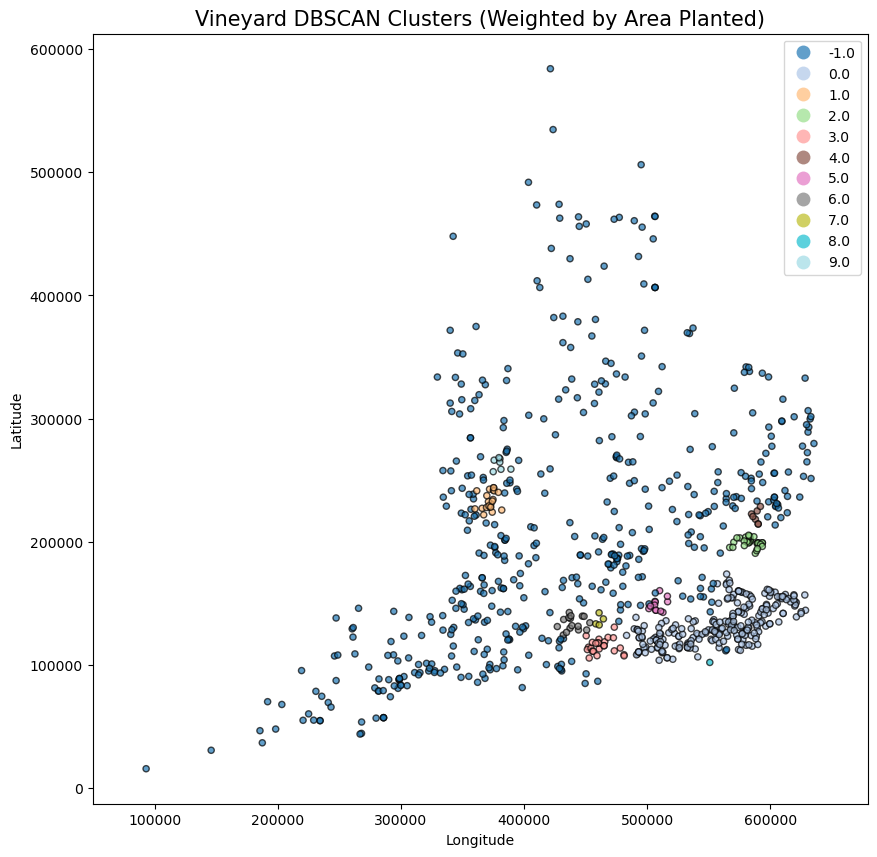

In [236]:
# Set up plot
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the points, colored by cluster
unique_clusters = vineyards_in_england['cluster_weighted'].unique()
n_clusters = len(unique_clusters)
cmap = plt.get_cmap('tab20', n_clusters)

# Plot vineyard points
vineyards_in_england.plot(
    ax=ax,
    column='cluster_weighted',
    categorical=True,
    legend=True,
    markersize=20,
    cmap=cmap,
    alpha=0.7,
    edgecolor='black'
)

# Title and axes
ax.set_title('Vineyard DBSCAN Clusters (Weighted by Area Planted)', fontsize=15)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.axis('equal')
plt.show()

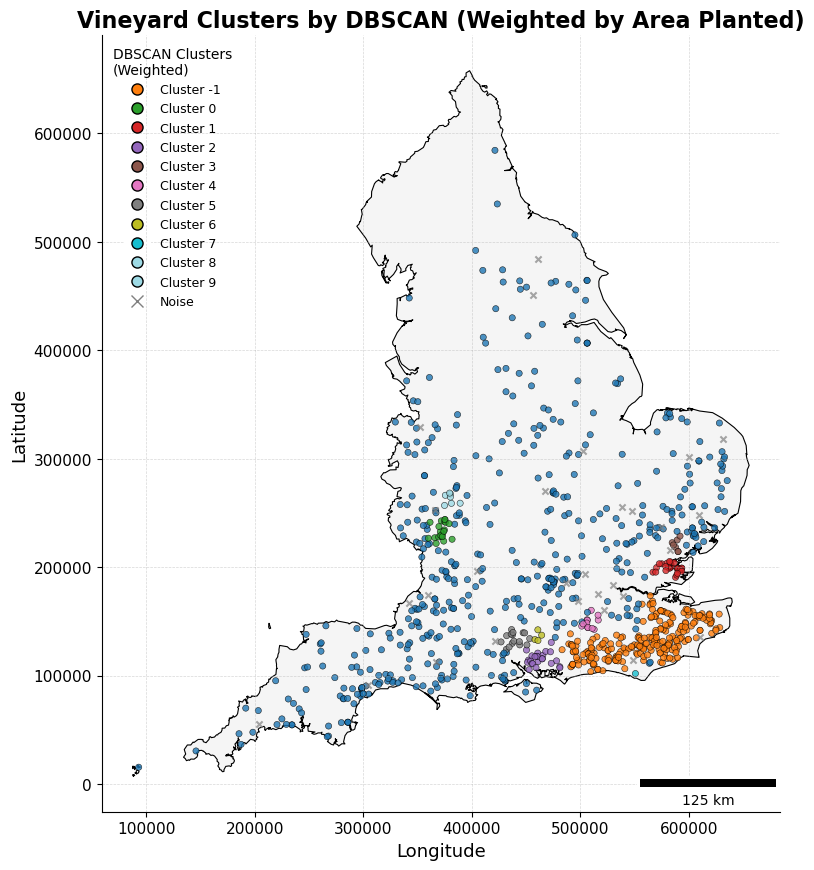

In [237]:
# Set up plot
fig, ax = plt.subplots(figsize=(8, 10))

# Plot England boundary
england.plot(
    ax=ax,
    color='whitesmoke',
    edgecolor='black',
    linewidth=0.8
)

# Fill NaNs in 'cluster_weighted' with a placeholder (-99 or 'Noise')
vineyards_in_england['cluster_weighted_clean'] = vineyards_in_england['cluster_weighted'].fillna(-99)

# Get unique clusters
unique_clusters = sorted(vineyards_in_england['cluster_weighted_clean'].unique())
n_clusters = len([c for c in unique_clusters if c != -99])  # Exclude noise from color mapping

cmap = plt.get_cmap('tab20', n_clusters)

# Plot clusters
vineyards_in_england[vineyards_in_england['cluster_weighted_clean'] != -99].plot(
    ax=ax,
    column='cluster_weighted_clean',
    categorical=True,
    cmap=cmap,
    markersize=20,
    alpha=0.8,
    edgecolor='black',
    linewidth=0.4,
    legend=False
)

# Plot noise points separately
vineyards_in_england[vineyards_in_england['cluster_weighted_clean'] == -99].plot(
    ax=ax,
    color='grey',
    marker='x',
    markersize=20,
    alpha=0.7,
    legend=False
)

# Create custom legend
legend_elements = [
    Line2D(
        [0], [0], marker='o', color='w',
        label=f'Cluster {int(c)}',
        markerfacecolor=cmap(i),
        markeredgecolor='black',
        markersize=8
    )
    for i, c in enumerate(unique_clusters) if c != -99
]

# Add noise separately in legend
legend_elements.append(
    Line2D(
        [0], [0], marker='x', color='grey', label='Noise', markersize=8, linestyle='None'
    )
)

ax.legend(
    handles=legend_elements,
    title='DBSCAN Clusters\n(Weighted)',
    loc='upper left',
    fontsize=9,
    title_fontsize=10,
    frameon=False
)

# Map basics
ax.set_title('Vineyard Clusters by DBSCAN (Weighted by Area Planted)', fontsize=16, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=13)
ax.set_ylabel('Latitude', fontsize=13)
ax.tick_params(labelsize=11)
ax.set_aspect('equal')

# scalebar
scalebar = ScaleBar(1, location='lower right')
ax.add_artist(scalebar)

# Light grid
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

fig.savefig(os.path.join(output_folder, 'vineyard_clusters_dbscan_weighted_academic_fixed.png'), dpi=300, bbox_inches='tight')

plt.show()

## Getis Ord - statistically significant spatial clusters
hotspot and coldspot identification

In [238]:
# Extract coordinates as NumPy array (what PySAL actually wants)
coords = np.array(list(zip(vineyards_in_england.geometry.x, vineyards_in_england.geometry.y)))

# Build spatial weights (set threshold)
w = DistanceBand(coords, threshold=eps_val, silence_warnings=True)

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\esda\getisord.py:527: RuntimeWarning: divide by zero encountered in divide
  z_scores = (statistic - expected_value) / np.sqrt(expected_variance)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\esda\getisord.py:527: RuntimeWarning: invalid value encountered in divide
  z_scores = (statistic - expected_value) / np.sqrt(expected_variance)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\esda\getisord.py:450: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Gs - self.EG_sim) / self.seG_sim


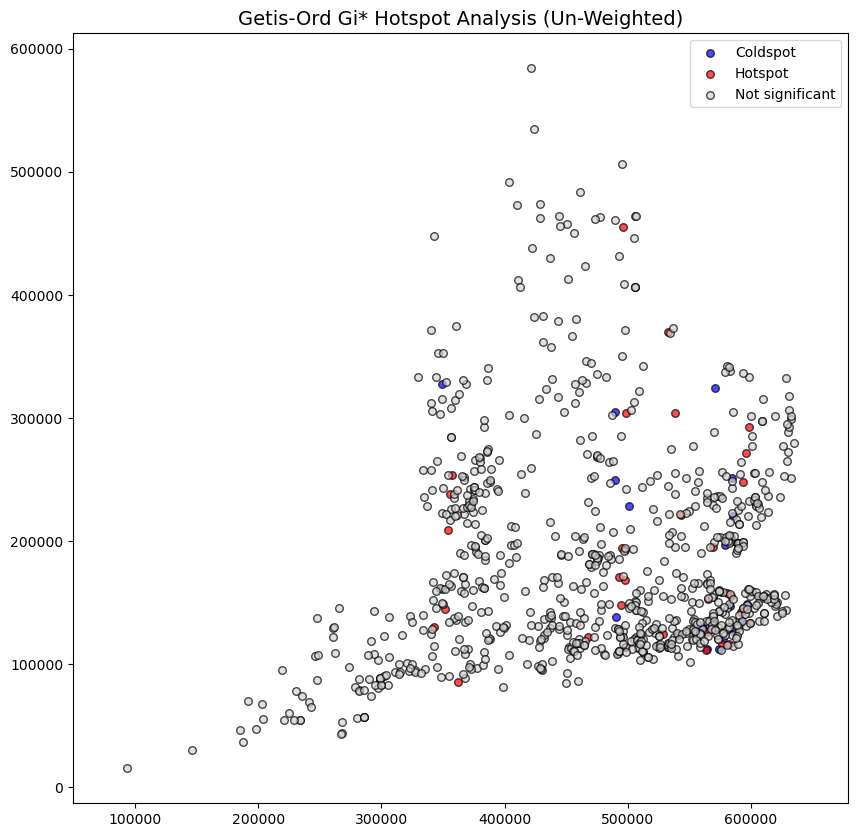

In [243]:
# Run Getis-Ord Gi* (un-weighted)

# assign constant weight to each point
vineyards_in_england['ones'] = 1.0

# run getis ord
g_count = G_Local(vineyards_in_england['ones'], w)

#attached results
vineyards_in_england['GiZ_count'] = g_count.Zs
vineyards_in_england['pval_count'] = g_count.p_sim

# Create significance bins
def classify_count_hotspot(row):
    if row['pval_count'] < 0.05:
        if row['GiZ_count'] > 0:
            return 'Hotspot'
        elif row['GiZ_count'] < 0:
            return 'Coldspot'
    return 'Not significant'

vineyards_in_england['hotspot_class'] = vineyards_in_england.apply(classify_count_hotspot, axis=1)

# Plot
fig, ax = plt.subplots(figsize=(10, 10))
colors = {'Hotspot': 'red', 'Coldspot': 'blue', 'Not significant': 'lightgrey'}
for cls, data in vineyards_in_england.groupby('hotspot_class'):
    data.plot(ax=ax, color=colors[cls], label=cls, markersize=30, alpha=0.7, edgecolor='k')

plt.legend()
plt.title("Getis-Ord Gi* Hotspot Analysis (Un-Weighted)", fontsize=14)
plt.axis('equal')
plt.show()

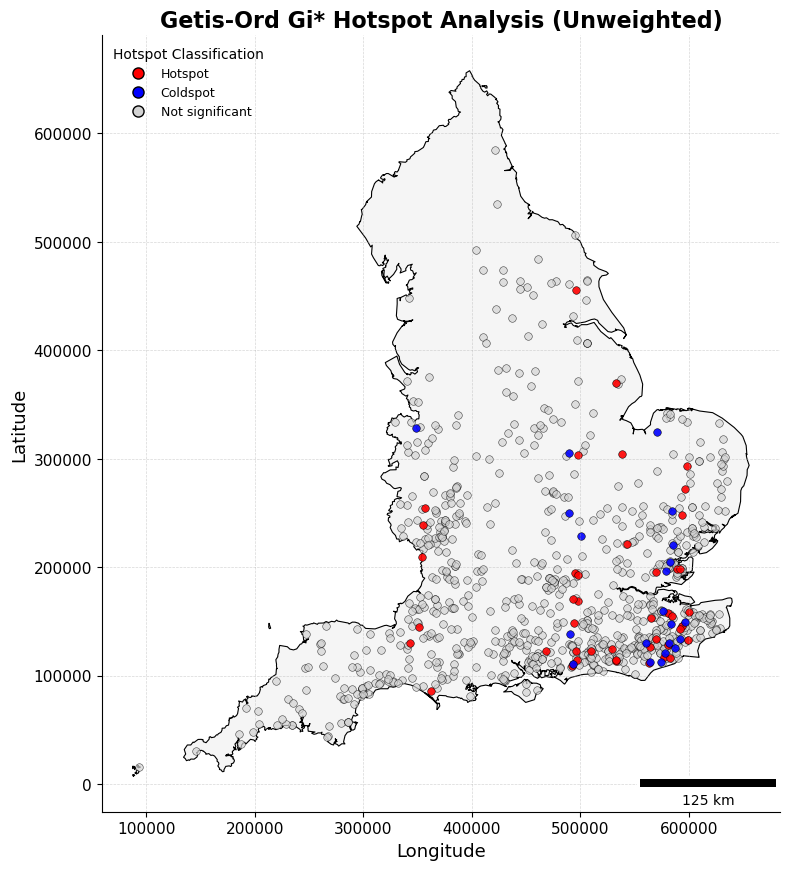

In [247]:
# Set up plot
fig, ax = plt.subplots(figsize=(8, 10))

# Plot England boundary
england.plot(
    ax=ax,
    color='whitesmoke',
    edgecolor='black',
    linewidth=0.8
)

# Plot order: Not significant first, then Hotspots, then Coldspots
# 1. Not significant (background points)
vineyards_in_england[vineyards_in_england['hotspot_class'] == 'Not significant'].plot(
    ax=ax,
    color='lightgrey',
    markersize=30,
    alpha=0.7,
    edgecolor='black',
    linewidth=0.4,
    label='Not significant'
)

# 2. Hotspots
vineyards_in_england[vineyards_in_england['hotspot_class'] == 'Hotspot'].plot(
    ax=ax,
    color='red',
    markersize=30,
    alpha=0.9,
    edgecolor='black',
    linewidth=0.4,
    label='Hotspot'
)

# 3. Coldspots
vineyards_in_england[vineyards_in_england['hotspot_class'] == 'Coldspot'].plot(
    ax=ax,
    color='blue',
    markersize=30,
    alpha=0.9,
    edgecolor='black',
    linewidth=0.4,
    label='Coldspot'
)

# Custom legend
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Hotspot', markerfacecolor='red', markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Coldspot', markerfacecolor='blue', markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Not significant', markerfacecolor='lightgrey', markeredgecolor='black', markersize=8)
]
ax.legend(
    handles=legend_elements,
    title='Hotspot Classification',
    loc='upper left',
    fontsize=9,
    title_fontsize=10,
    frameon=False
)

# Map styling
ax.set_title('Getis-Ord Gi* Hotspot Analysis (Unweighted)', fontsize=16, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=13)
ax.set_ylabel('Latitude', fontsize=13)
ax.tick_params(labelsize=11)
ax.set_aspect('equal')

# scale bar
scalebar = ScaleBar(1, location='lower right')
ax.add_artist(scalebar)

# Grid
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)

# spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

fig.savefig(os.path.join(output_folder, 'getis_ord_hotspot_unweighted_academic.png'), dpi=300, bbox_inches='tight')

plt.show()

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\esda\getisord.py:527: RuntimeWarning: invalid value encountered in divide
  z_scores = (statistic - expected_value) / np.sqrt(expected_variance)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\esda\getisord.py:450: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Gs - self.EG_sim) / self.seG_sim


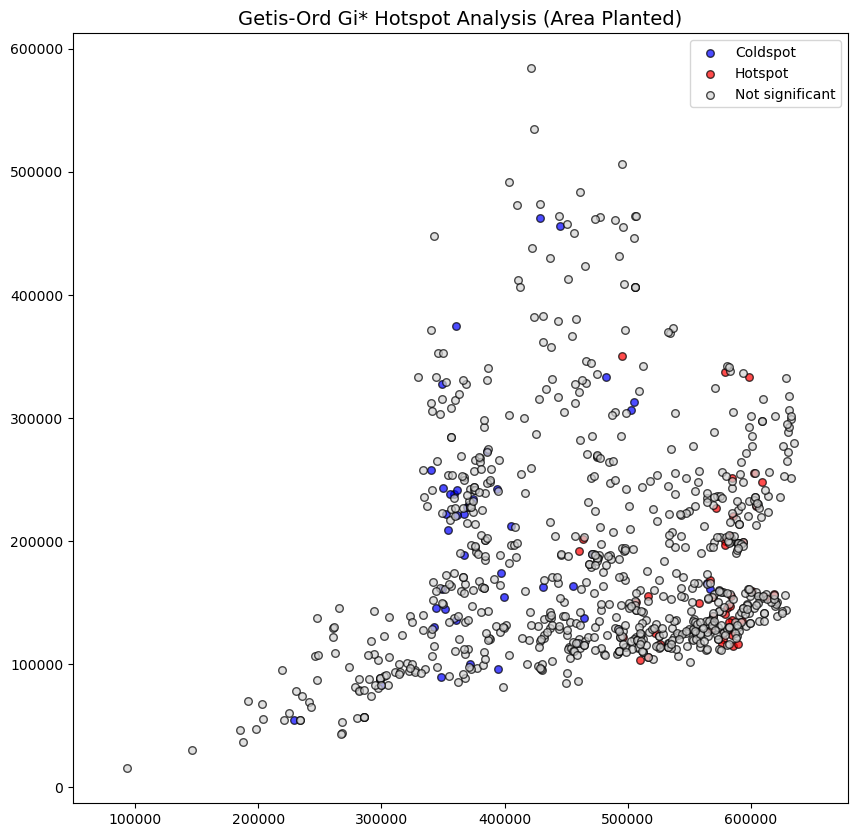

In [244]:
# Run Getis-Ord Gi* (weighted by area planted)
g = G_Local(vineyards_in_england['AreaPlanted'], w)

# Attach results
vineyards_in_england['GiZ'] = g.Zs
vineyards_in_england['pval'] = g.p_sim

# Create significance bins
def classify_hotspot(row):
    if row['pval'] < 0.05:
        if row['GiZ'] > 0:
            return 'Hotspot'
        elif row['GiZ'] < 0:
            return 'Coldspot'
    return 'Not significant'

vineyards_in_england['hotspot_class_weighted'] = vineyards_in_england.apply(classify_hotspot, axis=1)

# Plot
fig, ax = plt.subplots(figsize=(10, 10))
colors = {'Hotspot': 'red', 'Coldspot': 'blue', 'Not significant': 'lightgrey'}
for cls, data in vineyards_in_england.groupby('hotspot_class_weighted'):
    data.plot(ax=ax, color=colors[cls], label=cls, markersize=30, alpha=0.7, edgecolor='k')

plt.legend()
plt.title("Getis-Ord Gi* Hotspot Analysis (Area Planted)", fontsize=14)
plt.axis('equal')
plt.show()

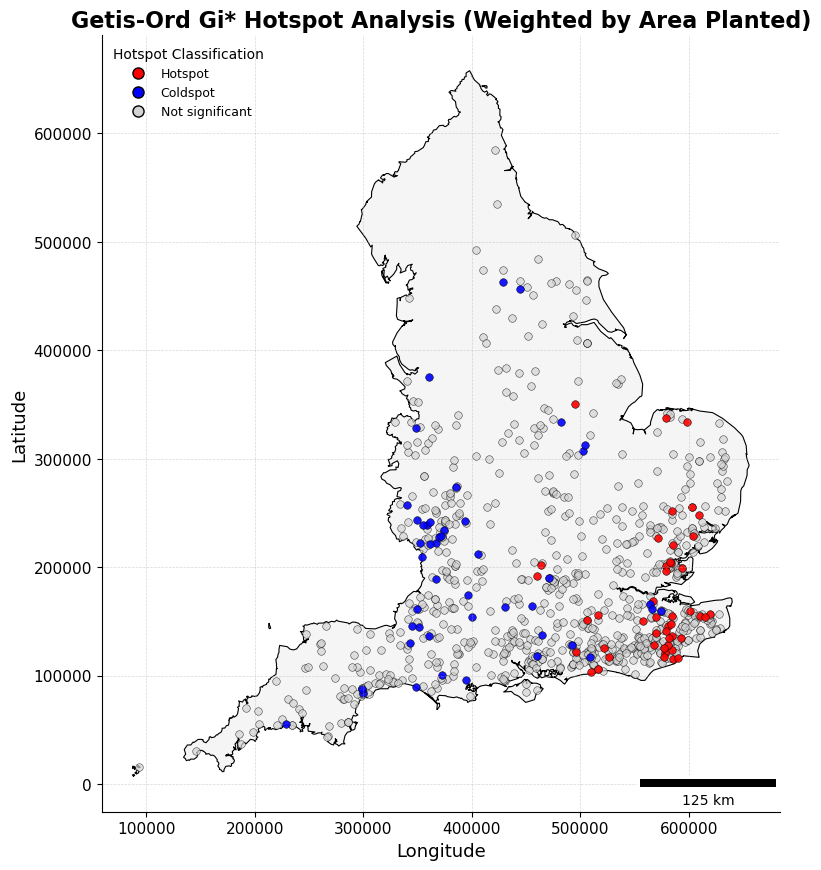

In [248]:
# Set up plot
fig, ax = plt.subplots(figsize=(8, 10))

# Plot England boundary
england.plot(
    ax=ax,
    color='whitesmoke',
    edgecolor='black',
    linewidth=0.8
)

# Plot order: Not significant first, then Hotspots, then Coldspots
# 1. Not significant (background points)
vineyards_in_england[vineyards_in_england['hotspot_class_weighted'] == 'Not significant'].plot(
    ax=ax,
    color='lightgrey',
    markersize=30,
    alpha=0.7,
    edgecolor='black',
    linewidth=0.4,
    label='Not significant'
)

# 2. Hotspots
vineyards_in_england[vineyards_in_england['hotspot_class_weighted'] == 'Hotspot'].plot(
    ax=ax,
    color='red',
    markersize=30,
    alpha=0.9,
    edgecolor='black',
    linewidth=0.4,
    label='Hotspot'
)

# 3. Coldspots
vineyards_in_england[vineyards_in_england['hotspot_class_weighted'] == 'Coldspot'].plot(
    ax=ax,
    color='blue',
    markersize=30,
    alpha=0.9,
    edgecolor='black',
    linewidth=0.4,
    label='Coldspot'
)

# Custom legend
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Hotspot', markerfacecolor='red', markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Coldspot', markerfacecolor='blue', markeredgecolor='black', markersize=8),
    Line2D([0], [0], marker='o', color='w', label='Not significant', markerfacecolor='lightgrey', markeredgecolor='black', markersize=8)
]
ax.legend(
    handles=legend_elements,
    title='Hotspot Classification',
    loc='upper left',
    fontsize=9,
    title_fontsize=10,
    frameon=False
)

# Map styling
ax.set_title('Getis-Ord Gi* Hotspot Analysis (Weighted by Area Planted)', fontsize=16, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=13)
ax.set_ylabel('Latitude', fontsize=13)
ax.tick_params(labelsize=11)
ax.set_aspect('equal')

# Add scale bar
scalebar = ScaleBar(1, location='lower right')
ax.add_artist(scalebar)

# Grid
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)

# Clean spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Tight layout
plt.tight_layout()

# Save
fig.savefig(os.path.join(output_folder, 'getis_ord_hotspot_weighted_academic.png'), dpi=300, bbox_inches='tight')

# Show
plt.show()

---

---

## Panel Dataset EDA

In [261]:
regression_df.columns

Index(['LSOA11CD', 'LSOA11NM', 'geometry', 'year', 'vineyard_count',
       'vineyard_area', 'imd_score', 'D_median_price', 'F_median_price',
       'O_median_price', 'S_median_price', 'T_median_price',
       'all_median_price', 'total_pop', 'pct_kids', 'pct_young_adults',
       'pct_middle_aged', 'pct_older_adults', 'pct_seniors', 'gva_value',
       'mobility_value', 'pop_density', 'vineyard_present'],
      dtype='object')

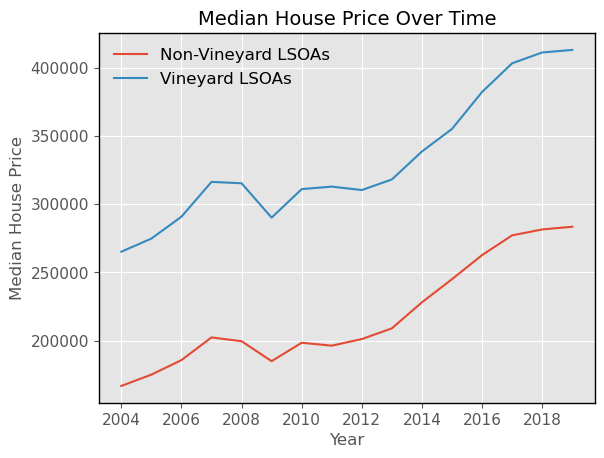

In [260]:
regression_df['vineyard_present'] = (regression_df['vineyard_area'] > 0).groupby(regression_df['LSOA11CD']).transform('any').astype(int)

# Grouped mean
grouped = regression_df.groupby(['year', 'vineyard_present'])['all_median_price'].mean().unstack()

# Plot
grouped.plot()
plt.title('Median House Price Over Time')
plt.ylabel('Median House Price')
plt.xlabel('Year')
plt.legend(['Non-Vineyard LSOAs', 'Vineyard LSOAs'])
plt.show()

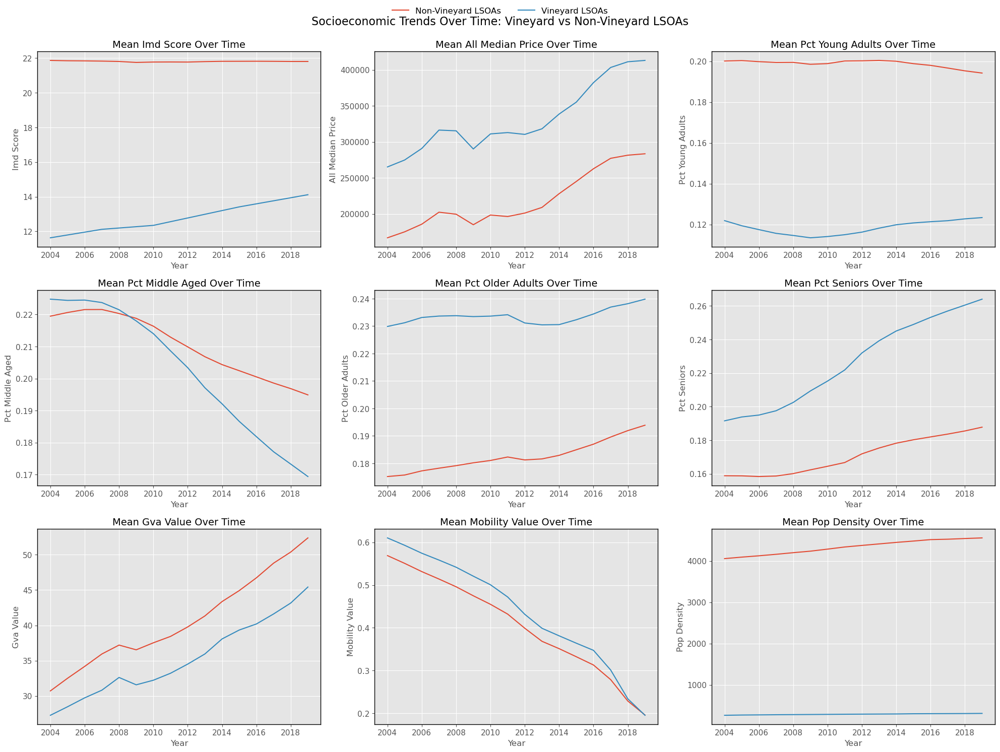

In [262]:
# list of variables
variables = [
    'imd_score', 'all_median_price', 'pct_young_adults',
    'pct_middle_aged', 'pct_older_adults', 'pct_seniors', 'gva_value',
    'mobility_value', 'pop_density'
]

# Create vineyard_present flag
regression_df['vineyard_present'] = (regression_df['vineyard_area'] > 0).groupby(regression_df['LSOA11CD']).transform('any').astype(int)

# Set up the subplots
fig, axes = plt.subplots(3, 3, figsize=(20, 15))  # 4 rows x 3 cols = 12 plots
axes = axes.flatten()

# Loop through variables
for i, var in enumerate(variables):
    # Group and calculate mean
    grouped = regression_df.groupby(['year', 'vineyard_present'])[var].mean().unstack()
    
    # Plot
    grouped.plot(ax=axes[i], legend=False)
    axes[i].set_title(f'Mean {var.replace("_", " ").title()} Over Time')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel(var.replace("_", " ").title())

# Add a single legend for the entire figure
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, ['Non-Vineyard LSOAs', 'Vineyard LSOAs'], loc='upper center', ncol=2, fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for the legend on top
fig.suptitle('Socioeconomic Trends Over Time: Vineyard vs Non-Vineyard LSOAs', fontsize=16)

plt.show()

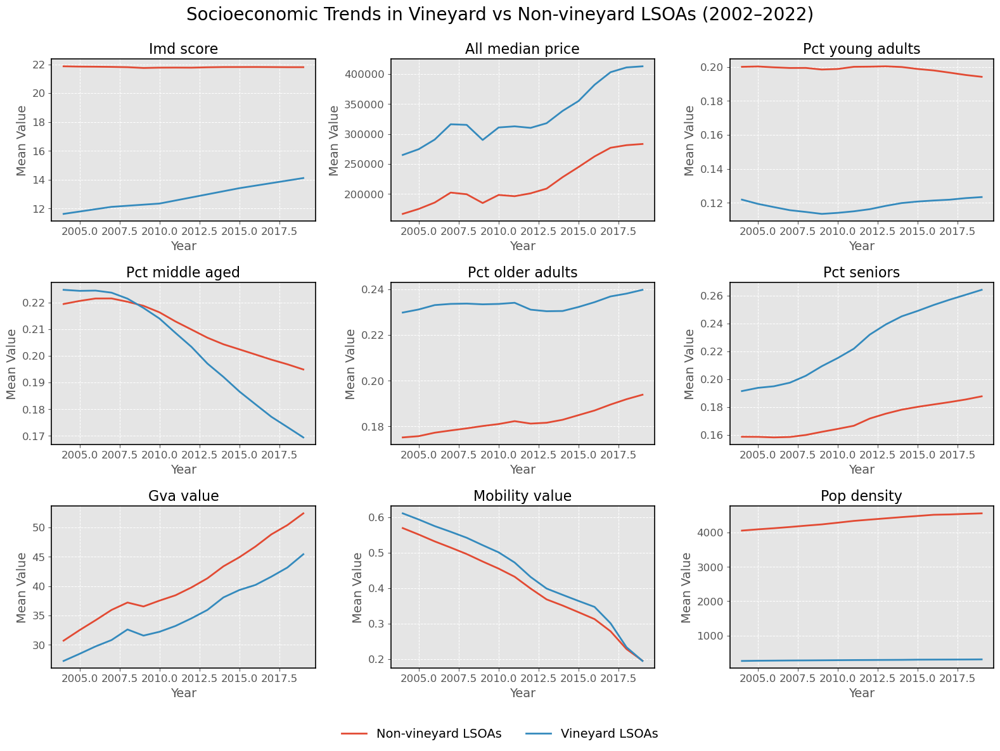

In [266]:
# list of variables
variables = [
    'imd_score', 'all_median_price', 'pct_young_adults',
    'pct_middle_aged', 'pct_older_adults', 'pct_seniors', 'gva_value',
    'mobility_value', 'pop_density'
]

# Create vineyard_present flag
regression_df['vineyard_present'] = (regression_df['vineyard_area'] > 0).groupby(regression_df['LSOA11CD']).transform('any').astype(int)

# plot settings
plt.style.use('ggplot')
plt.rcParams.update({
    'font.size': 14,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'legend.fontsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'axes.edgecolor': 'black',
    'axes.linewidth': 1.2,
    'legend.frameon': False
})

# Set up the subplots
fig, axes = plt.subplots(3, 3, figsize=(16, 12))  # Wider proportion, good for A4
axes = axes.flatten()

# Loop through variables
for i, var in enumerate(variables):
    grouped = regression_df.groupby(['year', 'vineyard_present'])[var].mean().unstack()
    grouped.plot(ax=axes[i], linewidth=2, legend=False)
    axes[i].set_title(f'{var.replace("_", " ").capitalize()}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Mean Value')
    axes[i].grid(visible=True, linestyle='--', linewidth=0.7)

# Remove empty plots if needed
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Add a single legend at the bottom
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, ['Non-vineyard LSOAs', 'Vineyard LSOAs'],
           loc='lower center', ncol=2, fontsize=14)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 0.95])  # Leave space at bottom for legend
fig.suptitle('Socioeconomic Trends in Vineyard vs Non-vineyard LSOAs (2002–2022)', fontsize=20)

# Save if needed
fig.savefig('./output/vineyard_gentrification_trends.png', dpi=300)

plt.show()

---

---

## 3.1 Cluster Analysis

In [65]:
# set up for cluster analysis

# wide format vineyard area per LSOA per year
vineyard_wide = (
    regression_df
    .pivot_table(index='LSOA11CD', columns='year', values='vineyard_area', aggfunc='sum')
    .fillna(0)
)

# normalise
scaler = StandardScaler()
vineyard_scaled = scaler.fit_transform(vineyard_wide)

In [70]:
vineyard_wide[vineyard_wide[2004] > 0]

year,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
LSOA11CD,,,,,,,,,,,,,,,,
E01000749,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556,0.391556
E01003365,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430
E01004349,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430,0.022430
E01011177,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498,0.747498
E01011402,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242,1.413242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
E01032431,0.015839,0.015839,0.015839,0.015839,0.015839,0.015839,0.015839,0.015839,0.015839,0.015839,0.094937,0.094937,0.094937,0.094937,0.094937,0.094937
E01032813,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346,0.088346
E01033143,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337,2.428337


In [ ]:
### HIERARCHICAL CLUSTERING ###

# set number of clusters
agglo = AgglomerativeClustering(n_clusters=3)
clusters_hier = agglo.fit_predict(vineyard_scaled)

# assign to df
vineyard_wide['cluster_hier'] = clusters_hier

# plot dendrogram
linked = linkage(vineyard_scaled, method='ward')
plt.figure(figsize=(12, 5))
dendrogram(linked, no_labels=True, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (truncated)')
plt.xlabel('LSOAs')
plt.ylabel('Distance')
plt.show()

In [ ]:
vineyard_wide

In [ ]:
### DBSCAN CLUSTERING ###

dbscan = DBSCAN(eps=2, min_samples=5)  # eps and min_samples are tunable
clusters_db = dbscan.fit_predict(vineyard_scaled)

vineyard_wide['cluster_dbscan'] = clusters_db

# visualise by merge and plotting
clustered_gdf = regression_df[['LSOA11CD', 'geometry']].drop_duplicates().merge(
    vineyard_wide[['cluster_hier', 'cluster_dbscan']], left_on='LSOA11CD', right_index=True, how='left'
)

clustered_gdf.plot(column='cluster_hier', cmap='Set2', legend=True, figsize=(10, 10))

In [ ]:
np.unique(vineyard_wide['cluster_dbscan'])

In [ ]:
### DBSCAN CLUSTERING 2 ###

dbscan = DBSCAN(eps=1, min_samples=5)  # eps and min_samples are tunable
clusters_db = dbscan.fit_predict(vineyard_scaled)

vineyard_wide['cluster_dbscan'] = clusters_db

# visualise by merge and plotting
clustered_gdf = regression_df[['LSOA11CD', 'geometry']].drop_duplicates().merge(
    vineyard_wide[['cluster_hier', 'cluster_dbscan']], left_on='LSOA11CD', right_index=True, how='left'
)

clustered_gdf.plot(column='cluster_hier', cmap='Set2', legend=True, figsize=(10, 10))

In [ ]:
np.unique(vineyard_wide['cluster_dbscan'])

In [ ]:
# mark noise points
noise_mask = vineyard_wide['cluster_dbscan'] == -1
print(f"{noise_mask.sum()} LSOAs identified as noise (outliers)")

In [ ]:
# map clusters, highlighting the outliers

# merge with gdf
dbscan_map = regression_df[['LSOA11CD', 'geometry']].drop_duplicates().merge(
    vineyard_wide[['cluster_dbscan']], left_on='LSOA11CD', right_index=True, how='left'
)

dbscan_map = gpd.GeoDataFrame(dbscan_map, geometry='geometry', crs=regression_df.crs)

# Plot clusters
fig, ax = plt.subplots(figsize=(10, 10))
dbscan_map[dbscan_map['cluster_dbscan'] != -1].plot(column='cluster_dbscan', ax=ax, cmap='Set3', legend=True)
dbscan_map[dbscan_map['cluster_dbscan'] == -1].plot(ax=ax, color='black', markersize=2, label='Outliers')

plt.title('DBSCAN Clustering of Vineyard Expansion (with Outliers)')
plt.legend()
plt.show()

In [ ]:
# Step 1: Drop 'LSOA11CD' as a column if it's already there
if 'LSOA11CD' in vineyard_wide.columns:
    vineyard_wide = vineyard_wide.drop(columns='LSOA11CD')

# Step 2: Reset the index so 'LSOA11CD' becomes a clean column
vineyard_wide = vineyard_wide.reset_index()

# Step 3: Merge with regression_df
cluster_profile = vineyard_wide.merge(
    regression_df[['LSOA11CD', 'imd_score', 'all_median_price', 'gva_value']],
    on='LSOA11CD',
    how='left'
)

In [ ]:
cluster_profile.columns

In [ ]:
# cluster profiling - total vineyard area

# Create a new column that sums vineyard area across all years
year_cols = list(range(2004, 2020))
cluster_profile['vineyard_area_total'] = cluster_profile[year_cols].sum(axis=1)

# Now profile by DBSCAN cluster
numeric_columns = ['vineyard_area_total', 'imd_score', 'all_median_price', 'gva_value']

summary = cluster_profile.groupby('cluster_dbscan')[numeric_columns].mean()
summary['count'] = cluster_profile.groupby('cluster_dbscan').size()

print(summary)

In [ ]:
# cluster profiling - average vineyard area

# Calculate average annual vineyard area
cluster_profile['vineyard_area_avg'] = cluster_profile[year_cols].mean(axis=1)

# Proceed with profiling
numeric_columns = ['vineyard_area_avg', 'imd_score', 'all_median_price', 'gva_value']

summary = cluster_profile.groupby('cluster_dbscan')[numeric_columns].mean()
summary['count'] = cluster_profile.groupby('cluster_dbscan').size()

print(summary)

In [ ]:
# point data dbscan

# Filter out empty geometries
vineyard_points_gdf = vineyard_points_gdf[~vineyard_points_gdf.geometry.is_empty & vineyard_points_gdf.geometry.notna()]

# Convert to projected coordinates
coords = np.array([[point.x, point.y] for point in vineyard_points_gdf.geometry])

# Scale coordinates (optional but helps)
coords_scaled = StandardScaler().fit_transform(coords)

# Apply DBSCAN
dbscan = DBSCAN(eps=0.3, min_samples=5)  # tune eps based on scaled or unscaled data
vineyard_points_gdf['cluster'] = dbscan.fit_predict(coords_scaled)

vineyard_points_gdf.plot(column='cluster', cmap='tab10', legend=True, figsize=(10, 10))
plt.title("DBSCAN Clusters of Vineyard Locations")
plt.show()

In [ ]:
# aggregate point clusters to lsoas

vineyard_cluster_summary = (
    vineyard_points_gdf.groupby(['LSOA11CD', 'cluster'])
    .size()
    .unstack(fill_value=0)
)

In [ ]:
vineyard_cluster_summary

In [ ]:
# area-weighted dbscan

# Normalize AreaPlanted to integer weights
vineyard_points_gdf['weight'] = (vineyard_points_gdf['AreaPlanted'] / vineyard_points_gdf['AreaPlanted'].max() * 10).round().astype(int)

# Expand the dataframe by repeating rows according to the weight
vineyard_weighted = vineyard_points_gdf.loc[vineyard_points_gdf.index.repeat(vineyard_points_gdf['weight'])].copy()

# Extract coordinates
coords = np.array([[point.x, point.y] for point in vineyard_weighted.geometry])

# Run DBSCAN on weighted coordinates
dbscan = DBSCAN(eps=2000, min_samples=5)
clusters = dbscan.fit_predict(coords)

vineyard_weighted['cluster'] = clusters

vineyard_weighted.plot(column='cluster', cmap='tab10', legend=True, figsize=(10, 10))
plt.title("DBSCAN Clusters of Vineyard Locations")
plt.show()

## 3.1b Hotspot Analysis

### 3.1b.1 Kernel Density Estimation (KDE)

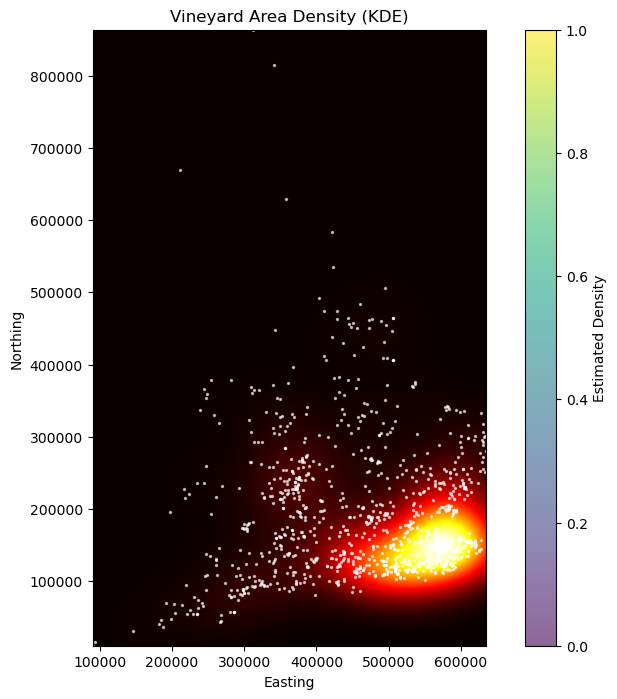

In [301]:
# Get coordinates
coords = np.array([[pt.x, pt.y] for pt in vineyard_points_gdf.geometry])
weights = vineyard_points_gdf['AreaPlanted'].fillna(0).values

# Apply KDE
kde = gaussian_kde(coords.T, weights=weights)
xmin, ymin, xmax, ymax = vineyard_points_gdf.total_bounds
xgrid, ygrid = np.mgrid[xmin:xmax:500j, ymin:ymax:500j]
positions = np.vstack([xgrid.ravel(), ygrid.ravel()])
density = np.reshape(kde(positions), xgrid.shape)

# Plot
plt.figure(figsize=(10, 8))
plt.imshow(np.rot90(density), cmap=plt.cm.hot, extent=[xmin, xmax, ymin, ymax])
plt.scatter(coords[:, 0], coords[:, 1], c='white', s=2, alpha=0.6)
plt.title("Vineyard Area Density (KDE)")
plt.xlabel("Easting")
plt.ylabel("Northing")
plt.colorbar(label='Estimated Density')
plt.show()

### 3.1b.2 Getis-Ord Gi*

## 3.2 Global OLS Regression Model



### 3.2.1 Run Model - With Year Fixed Effects

'vineyard_count',
 'vineyard_area',
 'imd_score',
 'D_median_price',
 'F_median_price',
 'O_median_price',
 'S_median_price',
 'T_median_price',
 'all_median_price',
 'total_pop',
 'pct_kids',
 'pct_young_adults',
 'pct_middle_aged',
 'pct_older_adults',
 'pct_seniors',
 'gva_value',
 'mobility_value'

In [78]:
# create panel dataset for fixed effects model (box cox transform + zscore normalise)
# Copy the original
transformed_df = regression_df.copy()

# List of columns to exclude from transformation
exclude_cols = ['LSOA11CD', 'LSOA11NM', 'year', 'geometry', 'vineyard_present'] 

# Columns to transform
cols_to_transform = [col for col in transformed_df.columns if col not in exclude_cols]

# Create a dictionary to store fitted lambdas (optional)
boxcox_lambdas = {}

# Apply Box-Cox and then z-score
for col in cols_to_transform:
    try:
        # Check if variable has more than one unique value
        if transformed_df[col].nunique() <= 1:
            print(f"Skipping {col}: constant value")
            continue
        
        # Check for non-positive values
        if (transformed_df[col] <= 0).any():
            shifted = transformed_df[col] + abs(transformed_df[col].min()) + 1
        else:
            shifted = transformed_df[col]

        # Apply Box-Cox transformation
        boxcox_transformed, fitted_lambda = stats.boxcox(shifted)
        
        # Save lambda
        boxcox_lambdas[col] = fitted_lambda
        
        # Z-score normalisation
        zscored = (boxcox_transformed - np.mean(boxcox_transformed)) / np.std(boxcox_transformed)
        
        # Replace column with transformed data
        transformed_df[col] = zscored
    
    except Exception as e:
        print(f"Skipping {col}: {e}")

# transformed_df

Skipping D_median_price: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Skipping F_median_price: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Skipping O_median_price: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Skipping S_median_price: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Skipping T_median_price: The algorithm terminated without finding a valid bracket. Consider trying different initial points.


In [79]:
# List of columns to drop
drop_cols = ['D_median_price', 'F_median_price', 'O_median_price', 'S_median_price', 'T_median_price']

# Drop them from transformed_df
transformed_df = transformed_df.drop(columns=drop_cols)

transformed_df

,LSOA11CD,LSOA11NM,geometry,year,vineyard_count,vineyard_area,imd_score,all_median_price,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density
312777,E01000001,City of London 001A,"POLYGON ((532151.537 181867.433, 532152.500 18...",2004,-0.127251,-0.116063,-1.178359,1.028132,-0.121065,-3.803115,1.006210,1.093731,1.795476,0.029773,2.287278,1.425431,1.538083
312778,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",2004,-0.127251,-0.116063,-1.430682,1.125333,-0.686672,-2.940015,0.417649,2.633864,1.832638,-0.364356,2.839249,1.670896,0.707656
312779,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.250 18...",2004,-0.127251,-0.116063,-0.005417,0.378939,-0.367170,-2.914665,1.460243,0.983107,-0.579638,0.229778,0.968214,1.405836,2.700312
312780,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",2004,-0.127251,-0.116063,0.833317,0.057397,-2.234785,-0.596395,1.323950,0.771202,-1.221924,-0.483126,2.554714,1.361556,0.580677
312781,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",2004,-0.127251,-0.116063,0.077024,0.076603,-0.151261,0.078267,1.301713,0.182747,-0.925225,-0.937652,-1.542503,1.405836,1.367198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867040,E01033748,Liverpool 050I,"MULTIPOLYGON (((334607.901 388176.505, 334600....",2019,-0.127251,-0.116063,-0.223351,-0.709750,-1.131810,-3.819934,2.301409,0.118807,-1.387347,-1.267138,2.281222,0.517936,-0.090666
867041,E01033749,Liverpool 042F,"POLYGON ((338929.000 388182.000, 338936.000 38...",2019,-0.127251,-0.116063,-0.262409,0.028135,-3.569174,3.187568,0.896811,-1.796097,-1.837189,-1.305290,-0.352111,-0.827387,0.245363
867042,E01033750,Liverpool 061A,"POLYGON ((334442.091 389502.020, 334489.805 38...",2019,-0.127251,-0.116063,-0.499084,-0.561149,1.381553,-2.822311,2.441095,-1.795346,-1.640492,-1.683433,1.117912,1.125819,0.318929
867043,E01033751,Liverpool 062A,"POLYGON ((334674.977 391540.458, 334679.726 39...",2019,-0.127251,-0.116063,1.224643,0.116739,2.123806,-0.297305,2.339192,-2.678506,-1.966858,-1.984213,1.407967,0.506746,0.267756


In [80]:
transformed_df.columns

Index(['LSOA11CD', 'LSOA11NM', 'geometry', 'year', 'vineyard_count',
       'vineyard_area', 'imd_score', 'all_median_price', 'total_pop',
       'pct_kids', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults',
       'pct_seniors', 'gva_value', 'mobility_value', 'pop_density'],
      dtype='object')

In [277]:
# panel data fixed effects regressions

transformed_df = transformed_df.drop(columns='geometry').reset_index()

# Set multi-index (entity = LSOA, time = year)
transformed_df = transformed_df.set_index(['LSOA11CD', 'year'])

# Run the model
fe_model = PanelOLS.from_formula(
    'vineyard_area ~ 1 + imd_score + all_median_price + total_pop + pct_young_adults + pct_middle_aged + pct_older_adults + pct_seniors + gva_value + mobility_value + pop_density + EntityEffects + TimeEffects',
    data=transformed_df
).fit()

print(fe_model.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:          vineyard_area   R-squared:                        0.0049
Estimator:                   PanelOLS   R-squared (Between):              0.0356
No. Observations:              524201   R-squared (Within):               0.0064
Date:                Sun, Apr 27 2025   R-squared (Overall):              0.0321
Time:                        15:41:47   Log-likelihood                -1.993e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      242.77
Entities:                       32843   P-value                           0.0000
Avg Obs:                       15.961   Distribution:               F(10,491333)
Min Obs:                       1.0000                                           
Max Obs:                       16.000   F-statistic (robust):             242.77
                            

In [81]:
print(transformed_df.index)

Index([312777, 312778, 312779, 312780, 312781, 312782, 312783, 312784, 312785,
       312786,
       ...
       867035, 867036, 867037, 867038, 867039, 867040, 867041, 867042, 867043,
       867044],
      dtype='int64', length=524201)


In [76]:
# panel data fixed effects regressions (clustered standard errors)

transformed_df = transformed_df.set_index(['LSOA11CD', 'year'])

# Run the model
fe_model = PanelOLS.from_formula(
    'vineyard_area ~ 1 + imd_score + all_median_price + pct_young_adults + pct_middle_aged + pct_older_adults + pct_seniors + gva_value + mobility_value + pop_density + EntityEffects + TimeEffects',
    data=transformed_df
).fit(cov_type='clustered', cluster_entity=True)

print(fe_model.summary)

FormulaMaterializerNotFoundError: No materializer has been registered for input type 'geopandas.geodataframe.GeoDataFrame'. Available input types are: set().

In [85]:
# Keep a copy with geometry
#transformed_geo = transformed_df.copy()

# Make a version without geometry for regression
#transformed_df = transformed_df.drop(columns=['geometry'])
#transformed_df = transformed_df.set_index(['LSOA11CD', 'year'])

# Run the regression
fe_model = PanelOLS.from_formula(
    'vineyard_area ~ 1 + imd_score + all_median_price + pct_young_adults + pct_middle_aged + pct_older_adults + pct_seniors + gva_value + mobility_value + pop_density + EntityEffects + TimeEffects',
    data=transformed_df
).fit(cov_type='clustered', cluster_entity=True)

print(fe_model.summary)

                          PanelOLS Estimation Summary                           
Dep. Variable:          vineyard_area   R-squared:                        0.0046
Estimator:                   PanelOLS   R-squared (Between):             -0.0101
No. Observations:              524201   R-squared (Within):               0.0059
Date:                Tue, Apr 29 2025   R-squared (Overall):             -0.0080
Time:                        23:11:52   Log-likelihood                -1.994e+05
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      250.32
Entities:                       32843   P-value                           0.0000
Avg Obs:                       15.961   Distribution:                F(9,491334)
Min Obs:                       1.0000                                           
Max Obs:                       16.000   F-statistic (robust):             22.729
                            

In [ ]:
# global ols regression model (with year fixed effects)

ols_model = smf.ols(
    'vineyard_area ~ imd_score + all_median_price + gva_value + mobility_value + total_pop + \
     pct_kids + pct_young_adults + pct_middle_aged + pct_older_adults + pct_seniors + gva_value + C(year)',
    data=regression_df
).fit()

print(ols_model.summary())

In [243]:
## with a log transformed dependent variable

regression_df['log_vineyard_area'] = np.log1p(regression_df['vineyard_area'])

model_log = smf.ols(
    'log_vineyard_area ~ imd_score + all_median_price + gva_value + mobility_value + \
     pct_young_adults + gva_value + C(year)',
    data=regression_df
).fit()

print(model_log.summary())

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


                            OLS Regression Results                            
Dep. Variable:      log_vineyard_area   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     403.1
Date:                Sat, 26 Apr 2025   Prob (F-statistic):               0.00
Time:                        00:50:36   Log-Likelihood:             2.7070e+05
No. Observations:              524201   AIC:                        -5.414e+05
Df Residuals:                  524180   BIC:                        -5.411e+05
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           -0.0504      0.001  

In [244]:
# vif check - multicollinearity

# Define predictors used in the latest model
X = regression_df[[
    'imd_score', 'all_median_price', 'gva_value',
    'mobility_value', 'pct_young_adults'
]]

# Add constant
X = sm.add_constant(X)

# Calculate VIF
vif_df = pd.DataFrame({
    'Variable': X.columns,
    'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
})

print(vif_df)

           Variable       VIF
0             const  1.000000
1         imd_score  1.309347
2  all_median_price  1.151635
3         gva_value  1.020221
4    mobility_value  1.201742
5  pct_young_adults  1.380114


### 3.2.2 Run Model - With LSOA Fixed Effects

In [ ]:
# global ols regression model (with place-specific characteristics)

df = df.set_index(['LSOA', 'year'])

model_fe = PanelOLS.from_formula(
    'vineyard_area ~ GVA + Mobility + DetachedPrice + Age_U18 + Age_18_35 + Age_35_65 + Age_65_plus + IMD + EntityEffects + TimeEffects',
    data=df
).fit()
print(model_fe.summary)

### 3.2.3 Spatial Autocorrelation Checks

In [274]:
regression_df[regression_df['year'] == 2019]

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry,year,...,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,log_vineyard_area,residuals
834072,E01000001,City of London 001A,532123,181632,-0.097140,51.5182,2635.767993,eaf9e4b8-fcc1-4cae-a46c-22c8a43ff39b,"POLYGON ((532151.537 181867.433, 532152.500 18...",2019,...,0.162597,-2.595004,0.767027,0.550470,-0.349939,0.914542,4.761492,-0.453150,-0.044459,-0.042784
834073,E01000002,City of London 001B,532480,181715,-0.091970,51.5188,2707.881853,4434ca6e-e270-4e88-b3eb-4cfb37f62490,"POLYGON ((532634.497 181926.016, 532632.048 18...",2019,...,-0.595603,-2.898938,0.888993,0.842147,1.025289,0.022738,40.585940,-0.043330,-0.044459,-0.041615
834074,E01000003,City of London 001C,532239,182033,-0.095320,51.5217,1224.638192,d0ff9760-86dc-40da-ad33-3b1dc987ef04,"POLYGON ((532153.703 182165.155, 532158.250 18...",2019,...,0.652143,-2.846341,0.947503,0.987446,0.783775,-0.002841,0.138687,-0.740636,-0.044459,-0.021112
834075,E01000005,City of London 001E,533581,181283,-0.076270,51.5147,2275.805348,474caa9f-a6e3-4de2-8bc1-2f5b0da40271,"POLYGON ((533619.062 181402.364, 533639.868 18...",2019,...,-0.586647,-1.405909,2.858224,-1.310187,-0.824065,-1.263910,5.757780,-0.667235,-0.044459,0.001464
834076,E01000006,Barking and Dagenham 016A,544994,184274,0.089317,51.5387,1966.092607,ff2bc9a6-9e26-4415-9cec-eaea2c0a4f54,"POLYGON ((545126.852 184310.838, 545145.213 18...",2019,...,0.661098,0.501482,0.789553,1.039396,-1.084406,-1.098350,-0.120907,-1.223856,-0.044459,-0.002512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867040,E01033748,Liverpool 050I,335220,387649,-2.975330,53.3817,4330.800070,ebab4e63-f89d-44f7-bbd0-f1e052b2e1a7,"MULTIPOLYGON (((334607.901 388176.505, 334600....",2019,...,-1.016493,-3.255014,3.648794,0.149169,-1.420537,-1.170852,1.706123,0.452124,-0.044459,0.026981
867041,E01033749,Liverpool 042F,338677,387900,-2.923420,53.3844,2340.702574,a371f2f0-d5c4-41dd-a5d9-7a3da72cece9,"POLYGON ((338929.000 388182.000, 338936.000 38...",2019,...,-2.494086,3.487200,0.619041,-1.859396,-1.942798,-1.199221,-0.112205,-0.856853,-0.044459,-0.008246
867042,E01033750,Liverpool 061A,334568,388937,-2.985400,53.3932,4937.800257,156a3ac7-3740-40ea-84b4-abb42032e918,"POLYGON ((334442.091 389502.020, 334489.805 38...",2019,...,1.338701,-2.543904,4.393676,-1.858542,-1.711185,-1.470504,0.041844,1.149430,-0.044459,0.028221
867043,E01033751,Liverpool 062A,333990,391269,-2.994580,53.4141,4360.410024,969316a7-14e5-4803-8da7-a1dcbf6617c3,"POLYGON ((334674.977 391540.458, 334679.726 39...",2019,...,2.249138,-0.330118,3.828843,-2.916590,-2.098400,-1.674293,0.148530,0.439891,-0.044459,0.024980


In [277]:
resid_geo['boundary_type'] = resid_geo['geometry'].boundary.geom_type
print(resid_geo['boundary_type'].value_counts())

boundary_type
LineString         35102
MultiLineString      114
Name: count, dtype: int64


In [88]:
fe_model

Dep. Variable:,vineyard_area,R-squared:,0.0046
Estimator:,PanelOLS,R-squared (Between):,-0.0101
No. Observations:,524201,R-squared (Within):,0.0059
Date:,"Tue, Apr 29 2025",R-squared (Overall):,-0.0080
Time:,23:11:52,Log-likelihood,-1.994e+05
Cov. Estimator:,Clustered,,
,,F-statistic:,250.32
Entities:,32843,P-value,0.0000
Avg Obs:,15.961,Distribution:,"F(9,491334)"
Min Obs:,1.0000,,
Max Obs:,16.000,F-statistic (robust):,22.729


In [100]:
# global morans i - global spatial autocorrelation


# --- 1. Filter dataset to 2019 only ---
regression_df_2019 = regression_df[regression_df['year'] == 2019].copy()

# --- 2. Calculate residuals (with proper index alignment) ---
residuals_flat = fe_model.resids.reset_index()
residuals_flat.columns = ['LSOA11CD', 'year', 'residuals']

# Merge residuals into the 2019 DataFrame
regression_df_2019 = regression_df_2019.merge(
    residuals_flat,
    on=['LSOA11CD', 'year'],
    how='left'
)

# --- 3. Prepare unique geometries ---
geo = regression_df_2019.drop_duplicates(subset='LSOA11CD')[['LSOA11CD', 'geometry']].copy()
geo = geo.set_index('LSOA11CD')

# --- 4. Join residuals to geometries ---
resid_geo = geo.join(
    regression_df_2019[['LSOA11CD', 'residuals']].drop_duplicates(subset='LSOA11CD').set_index('LSOA11CD')
)

# --- 5. Explode MultiPolygons into separate rows ---
resid_geo = resid_geo.explode(index_parts=True)
resid_geo = resid_geo.reset_index(drop=False)
resid_geo['unique_id'] = resid_geo['LSOA11CD'] + '_' + resid_geo['level_1'].astype(str)
resid_geo = resid_geo.set_index('unique_id')

# --- 6. Make sure it's a GeoDataFrame ---
resid_geo = gpd.GeoDataFrame(resid_geo, geometry='geometry')

# --- 7. Fix invalid geometries ---
resid_geo['geometry'] = resid_geo['geometry'].buffer(0)

# --- 8. Drop invalid or empty geometries ---
resid_geo = resid_geo[resid_geo.is_valid & ~resid_geo.is_empty]

# --- 9. Keep only Polygon or MultiPolygon geometries ---
resid_geo = resid_geo[resid_geo.geometry.apply(lambda g: isinstance(g, (Polygon, MultiPolygon)))]

# --- 10. (NEW) Drop geometries with bad boundaries (MultiLineString boundary problem) ---
def is_clean_for_queen(geom):
    try:
        return geom.boundary.geom_type == 'LineString'
    except:
        return False

resid_geo = resid_geo[resid_geo['geometry'].apply(is_clean_for_queen)]

# --- 11. Create Queen spatial weights matrix ---
w = Queen.from_dataframe(resid_geo, ids=resid_geo.index.to_list())
w.transform = 'r'  # Row-standardize weights

# --- 12. Run Moran’s I ---
moran = Moran(resid_geo['residuals'].values, w)

# --- 13. Print results ---
print(f"Moran's I: {moran.I:.4f}")
print(f"Expected I: {moran.EI:.4f}")
print(f"p-value: {moran.p_sim:.4f}")

# --- 14. Plot Moran scatterplot ---
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.title("Moran's I Scatterplot of Regression Residuals (2019)")
plt.show()

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\libpysal\weights\contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 779 disconnected components.
 There are 710 islands with ids: E01000590_0, E01002571_0, E01002581_0, E01002667_0, E01003847_1, E01003896_0, E01006179_0, E01006193_0, E01007196_0, E01007196_1, E01007196_3, E01007601_0, E01008551_0, E01008551_1, E01010617_0, E01010858_0, E01011312_0, E01011928_0, E01012107_0, E01013293_0, E01011653_0, E01011854_0, E01012198_0, E01012335_0, E01012931_0, E01013016_1, E01013020_0, E01013025_0, E01013101_0, E01013405_0, E01013695_0, E01014034_0, E01014496_0, E01014496_13, E01014496_24, E01014496_44, E01014496_45, E01014841_1, E01014954_6, E01014954_15, E01014954_19, E01015082_0, E01015146_0, E01015158_3, E01015158_4, E01015247_0, E01015271_0, E01015271_11, E01015271_14, E01015271_15, E01015271_16, E01015271_17, E01015271_18, E01015271_19, E01015271_20, E01015271_21, E01015271_22, E01015271_23, E0101527

('WARNING: ', 'E01000590_0', ' is an island (no neighbors)')
('WARNING: ', 'E01002571_0', ' is an island (no neighbors)')
('WARNING: ', 'E01002581_0', ' is an island (no neighbors)')
('WARNING: ', 'E01002667_0', ' is an island (no neighbors)')
('WARNING: ', 'E01003847_1', ' is an island (no neighbors)')
('WARNING: ', 'E01003896_0', ' is an island (no neighbors)')
('WARNING: ', 'E01006179_0', ' is an island (no neighbors)')
('WARNING: ', 'E01006193_0', ' is an island (no neighbors)')
('WARNING: ', 'E01007196_0', ' is an island (no neighbors)')
('WARNING: ', 'E01007196_1', ' is an island (no neighbors)')
('WARNING: ', 'E01007196_3', ' is an island (no neighbors)')
('WARNING: ', 'E01007601_0', ' is an island (no neighbors)')
('WARNING: ', 'E01008551_0', ' is an island (no neighbors)')
('WARNING: ', 'E01008551_1', ' is an island (no neighbors)')
('WARNING: ', 'E01010617_0', ' is an island (no neighbors)')
('WARNING: ', 'E01010858_0', ' is an island (no neighbors)')
('WARNING: ', 'E01011312

Moran's I: 0.0714
Expected I: -0.0000
p-value: 0.0010


NameError: name 'moran_scatterplot' is not defined

In [101]:
# 1. Extract spatial lag and original residuals
residuals = resid_geo['residuals'].values
w_matrix = w.full()[0]  # full weight matrix
spatial_lag = w.sparse @ residuals  # spatially lagged residuals

# 2. Plot
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(residuals, spatial_lag, alpha=0.5, edgecolor='k', linewidth=0.5)

# 3. Plot mean lines
ax.axhline(spatial_lag.mean(), color='red', linestyle='--', linewidth=1)
ax.axvline(residuals.mean(), color='red', linestyle='--', linewidth=1)

# 4. Add best fit line
m, b = np.polyfit(residuals, spatial_lag, 1)
ax.plot(residuals, m * residuals + b, color='blue', linewidth=1.5)

# 5. Labels and title
ax.set_title("Moran's I Scatterplot of Regression Residuals (2019)")
ax.set_xlabel("Residuals")
ax.set_ylabel("Spatial Lag of Residuals")

plt.grid(True)
plt.tight_layout()
plt.show()

MemoryError: Unable to allocate 9.18 GiB for an array with shape (35102, 35102) and data type float64

In [ ]:
# Calculate Local Moran's I
lisa = Moran_Local(resid_geo['residuals'].values, w)

# Set style
sns.set(style="whitegrid")

# Plot with improved figure quality
fig, ax = plt.subplots(1, figsize=(10, 8), dpi=300)

# Generate the LISA cluster map
lisa_cluster(lisa, resid_geo, p=0.05, ax=ax)

# Customise title and remove axes
ax.set_title("LISA Cluster Map of Regression Residuals (2019)", fontsize=14, fontweight='bold')
ax.set_axis_off()

# Adjust layout
plt.tight_layout()

# Save for publication
plt.savefig("lisa_cluster_map_residuals_2019.png", dpi=300, bbox_inches='tight')
plt.show()

### 3.2.4 Spatial Error Model (SEM)

In [298]:
regression_df_2019.columns

Index(['LSOA11CD', 'LSOA11NM', 'BNG_E', 'BNG_N', 'LONG_', 'LAT', 'Shape_Leng',
       'GlobalID', 'geometry', 'year', 'vineyard_count', 'vineyard_area',
       'imd_score', 'D_median_price', 'F_median_price', 'O_median_price',
       'S_median_price', 'T_median_price', 'all_median_price', 'total_pop',
       'pct_kids', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults',
       'pct_seniors', 'gva_value', 'mobility_value', 'log_vineyard_area',
       'residuals'],
      dtype='object')

In [291]:
resid_geo.columns

Index(['LSOA11CD', 'level_1', 'residuals', 'geometry'], dtype='object')

In [282]:
regression_df_2019

,LSOA11CD,LSOA11NM,geometry,year,vineyard_count,vineyard_area,imd_score,D_median_price,F_median_price,O_median_price,...,all_median_price,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density
834072,E01000001,City of London 001A,"POLYGON ((532151.537 181867.433, 532152.500 18...",2019,0.0,0.0,6.208,NaN,840000.0,600000.0,...,840000.0,1677.0,0.097197,0.265355,0.228980,0.167561,0.240906,1342.833,0.332,12913.378827
834073,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",2019,0.0,0.0,5.143,NaN,845000.0,206250000.0,...,880000.0,1423.0,0.080815,0.276177,0.238932,0.230499,0.173577,11140.686,0.399,6229.762172
834074,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.250 18...",2019,0.0,0.0,19.402,NaN,520000.0,NaN,...,520000.0,1841.0,0.083650,0.281369,0.243889,0.219446,0.171646,78.513,0.285,31174.671160
834075,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",2019,0.0,0.0,28.652,NaN,395000.0,975033.5,...,725000.0,1426.0,0.161290,0.450912,0.165498,0.145863,0.076438,1615.314,0.297,7521.981330
834076,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",2019,0.0,0.0,19.837,NaN,205000.0,NaN,...,240000.0,1844.0,0.264100,0.267354,0.245662,0.133948,0.088937,7.515,0.206,12583.852910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867040,E01033748,Liverpool 050I,"MULTIPOLYGON (((334607.901 388176.505, 334600....",2019,0.0,0.0,14.690,NaN,125250.0,111250.0,...,125000.0,1282.0,0.061622,0.521061,0.215289,0.118565,0.083463,507.201,0.480,2651.422694
867041,E01033749,Liverpool 042F,"POLYGON ((338929.000 388182.000, 338936.000 38...",2019,0.0,0.0,14.244,NaN,NaN,NaN,...,185000.0,787.0,0.425032,0.252224,0.146760,0.094663,0.081321,9.895,0.266,3882.896322
867042,E01033750,Liverpool 061A,"POLYGON ((334442.091 389502.020, 334489.805 38...",2019,0.0,0.0,11.769,NaN,134995.0,NaN,...,134995.0,2071.0,0.099952,0.587156,0.146789,0.105263,0.060840,52.027,0.594,4194.929966
867043,E01033751,Liverpool 062A,"POLYGON ((334674.977 391540.458, 334679.726 39...",2019,0.0,0.0,41.135,NaN,194575.0,115000.0,...,194260.0,2376.0,0.219276,0.537037,0.110690,0.087542,0.045455,81.205,0.478,3976.195220


In [286]:
spreg.diagnostics.np = np
spreg.diagnostics.stats = stats

# Step 1: Start from 2019 subset
# Drop the unnecessary columns
cols_to_drop = ['D_median_price', 'F_median_price', 'O_median_price', 'S_median_price', 'T_median_price', 'geometry', 'year']
df_2019 = regression_df_2019.drop(columns=cols_to_drop).copy()

# Step 2: Transform variables
exclude_cols = ['LSOA11CD', 'LSOA11NM']
cols_to_transform = [col for col in df_2019.columns if col not in exclude_cols]

# Create a dictionary to store fitted lambdas
boxcox_lambdas = {}

# Box-Cox and z-score transformation
for col in cols_to_transform:
    if (df_2019[col] <= 0).any():
        shifted = df_2019[col] + abs(df_2019[col].min()) + 1
    else:
        shifted = df_2019[col]
    
    boxcox_transformed, fitted_lambda = stats.boxcox(shifted)
    boxcox_lambdas[col] = fitted_lambda
    
    zscored = (boxcox_transformed - np.mean(boxcox_transformed)) / np.std(boxcox_transformed)
    
    df_2019[col] = zscored

# Step 3: Merge geometry
geometry_df = lsoa_2011_bfe[['LSOA11CD', 'geometry']].drop_duplicates(subset='LSOA11CD')
df_2019 = df_2019.merge(geometry_df, on='LSOA11CD', how='left')

# Step 4: Clean and prepare spatial data
df_2019 = df_2019.dropna(subset=['geometry'])  # Drop missing geometries
df_2019 = gpd.GeoDataFrame(df_2019, geometry='geometry')
df_2019['geometry'] = df_2019['geometry'].buffer(0)  # Fix invalid geometries
df_2019 = df_2019.explode(index_parts=False).reset_index(drop=True)

# Keep only largest polygon per LSOA
def largest_polygon(geom):
    if isinstance(geom, MultiPolygon):
        return max(geom.geoms, key=lambda a: a.area)
    elif isinstance(geom, Polygon):
        return geom
    else:
        return None

df_2019['geometry'] = df_2019['geometry'].apply(largest_polygon)
df_2019 = df_2019.dropna(subset=['geometry'])

# Keep only simple polygons
def is_simple_polygon(geom):
    return isinstance(geom, Polygon) and geom.boundary.geom_type == 'LineString'

df_2019 = df_2019[df_2019['geometry'].apply(is_simple_polygon)].copy()

# Step 5: Drop missing rows for analysis variables
variables = [
    'vineyard_area',
    'imd_score', 'gva_value', 'mobility_value', 'pop_density', 'all_median_price',
    'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]
df_2019 = df_2019.dropna(subset=variables)

# Step 6: Create Queen contiguity weights
w = Queen.from_dataframe(df_2019)
w.transform = 'r'

# Step 7: Prepare matrices
X = df_2019[['imd_score', 'gva_value', 'mobility_value', 'pop_density', 'all_median_price',
             'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
            ]].values
y = df_2019['vineyard_area'].values

# Step 8: Fit SEM
model_sem = GM_Error(
    y, X, w=w,
    name_y='vineyard_area',
    name_x=['IMD', 'GVA', 'Mobility', 'Population Density', 'Median Price', '% Young Adult', '% Middle Age', '% Older Adult', '% Senior']
)

# Step 9: Print results
print(model_sem.summary)

C:\Users\aaron\AppData\Local\Temp\ipykernel_23148\3004989747.py:75: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(df_2019)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\libpysal\weights\contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 213 disconnected components.
 There are 193 islands with ids: 580, 6293, 6306, 7642, 10363, 10596, 11005, 11125, 11250, 11558, 11751, 12091, 12643, 12735, 12810, 13079, 13362, 13646, 14432, 14703, 14714, 14716, 15431, 16826, 16828, 16985, 16988, 17011, 17023, 17024, 17336, 17723, 17882, 18367, 18375, 18376, 18440, 18441, 18443, 18446, 18499, 18551, 18562, 18563, 18570, 18574, 18584, 18587, 18588, 18601, 18602, 18603, 18604, 18616, 18632, 18637, 18638, 18639, 18640, 18641, 18642, 18643, 18644, 18645, 18646, 18647, 18648, 18649, 18650, 18651, 18652, 18653, 18654, 18655, 18656, 

('WARNING: ', 580, ' is an island (no neighbors)')
('WARNING: ', 6293, ' is an island (no neighbors)')
('WARNING: ', 6306, ' is an island (no neighbors)')
('WARNING: ', 7642, ' is an island (no neighbors)')
('WARNING: ', 10363, ' is an island (no neighbors)')
('WARNING: ', 10596, ' is an island (no neighbors)')
('WARNING: ', 11005, ' is an island (no neighbors)')
('WARNING: ', 11125, ' is an island (no neighbors)')
('WARNING: ', 11250, ' is an island (no neighbors)')
('WARNING: ', 11558, ' is an island (no neighbors)')
('WARNING: ', 11751, ' is an island (no neighbors)')
('WARNING: ', 12091, ' is an island (no neighbors)')
('WARNING: ', 12643, ' is an island (no neighbors)')
('WARNING: ', 12735, ' is an island (no neighbors)')
('WARNING: ', 12810, ' is an island (no neighbors)')
('WARNING: ', 13079, ' is an island (no neighbors)')
('WARNING: ', 13362, ' is an island (no neighbors)')
('WARNING: ', 13646, ' is an island (no neighbors)')
('WARNING: ', 14432, ' is an island (no neighbors)'

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED LEAST SQUARES
---------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :vineyard_area                Number of Observations:       32910
Mean dependent var  :      0.0091                Number of Variables   :          10
S.D. dependent var  :      1.0328                Degrees of Freedom    :       32900
Pseudo R-squared    :      0.0808

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       0.0170046       0.0074491       2.2827802       0.0224433
                 IMD       0.1253779       0.0083742      14.9718340       0.0000000
                 GVA      -0.0025577       0.0067790      -0.3772972       0.7059528
     

C:\Users\aaron\AppData\Local\Temp\ipykernel_26252\2928442633.py:13: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  islands.plot(ax=ax, color='red', edgecolor='black')


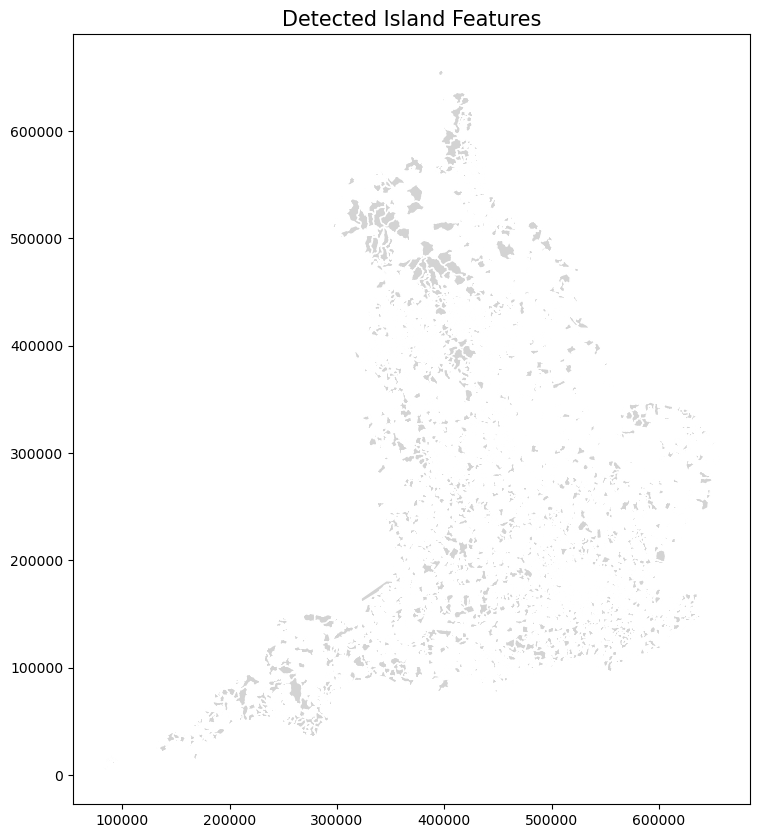

In [457]:
regression_df_2019['island'] = regression_df_2019.geometry.apply(lambda geom: geom.is_empty or geom.area < 1e-6)

# Filter only island features
islands = regression_df_2019[regression_df_2019['island'] == True]

# Plot
fig, ax = plt.subplots(figsize=(10, 10))

# Plot everything in light grey
regression_df_2019.plot(ax=ax, color='lightgrey', edgecolor='white')

# Plot islands in red
islands.plot(ax=ax, color='red', edgecolor='black')

# Title
plt.title('Detected Island Features', fontsize=15)
plt.show()

In [434]:
regression_df_2019.info

<bound method DataFrame.info of            LSOA11CD                   LSOA11NM   BNG_E   BNG_N     LONG_  \
834099 0  E01000030  Barking and Dagenham 001D  548065  189260  0.135663   
834114 0  E01000045  Barking and Dagenham 017C  546618  183883  0.112554   
834130 0  E01000062  Barking and Dagenham 006D  549341  186126  0.152736   
834132 0  E01000064  Barking and Dagenham 006E  549618  185897  0.156631   
834138 0  E01000070  Barking and Dagenham 011D  545160  185057  0.092032   
...             ...                        ...     ...     ...       ...   
867014 0  E01033722            Colchester 008H  601975  224739  0.933377   
867016 0  E01033724            Hillingdon 016F  505270  182721 -0.483680   
867017 0  E01033725            Hillingdon 015F  506298  183488 -0.468630   
867033 0  E01033741             Greenwich 002G  545454  179677  0.094050   
867037 0  E01033745             Greenwich 002I  546105  179878  0.103505   

              LAT   Shape_Leng                         

In [ ]:
# (Assuming df_model, X, y already set up)

ols_model = OLS(y, X, name_y='vineyard_area_ha', name_x=['imd_score', 'D_median_price', 'F_median_price', 'O_median_price',
                                                         'S_median_price', 'T_median_price', 'all_median_price', 'total_pop', 
                                                         'pct_kids', 'pct_young_adults', 'pct_middle_aged', 
                                                         'pct_older_adults', 'pct_seniors', 'gva_value', 'mobility_value'])

print(ols_model.summary)

## 3.4 GWR (on change 2004-2019) / GTWR

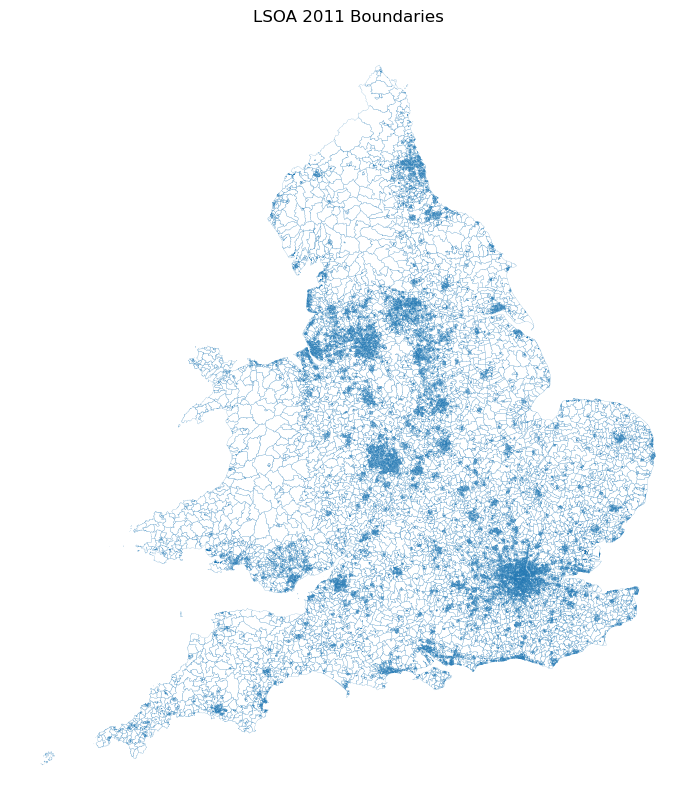

In [368]:
fig, ax = plt.subplots(figsize=(10, 10))
lsoa_2011.boundary.plot(ax=ax, linewidth=0.1)
ax.set_title('LSOA 2011 Boundaries')
ax.set_axis_off()
plt.show()

In [288]:
regression_df.columns

Index(['LSOA11NM', 'geometry', 'vineyard_count', 'vineyard_area', 'imd_score',
       'D_median_price', 'F_median_price', 'O_median_price', 'S_median_price',
       'T_median_price', 'all_median_price', 'total_pop', 'pct_kids',
       'pct_young_adults', 'pct_middle_aged', 'pct_older_adults',
       'pct_seniors', 'gva_value', 'mobility_value', 'pop_density',
       'vineyard_present'],
      dtype='object')

In [292]:
df_2019

,LSOA11CD,LSOA11NM,vineyard_count,vineyard_area,imd_score,all_median_price,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density,geometry
0,E01000001,City of London 001A,-0.144669,-0.135509,-1.261065,2.105670,0.145585,-2.803006,1.056681,1.002272,-0.709754,0.669257,2.511320,1.430138,1.566507,"POLYGON ((532151.537 181867.433, 532152.500 18..."
1,E01000002,City of London 001B,-0.144669,-0.135509,-1.461622,2.181781,-0.751505,-3.255288,1.154844,1.297472,0.866592,-0.086542,2.973529,1.800984,0.673378,"POLYGON ((532634.497 181926.016, 532632.048 18..."
2,E01000003,City of London 001C,-0.144669,-0.135509,0.128946,1.315506,0.583402,-3.174401,1.200271,1.445061,0.569611,-0.109898,1.245457,1.109432,2.985357,"POLYGON ((532153.703 182165.155, 532158.250 18..."
3,E01000005,City of London 001E,-0.144669,-0.135509,0.682147,1.864163,-0.738876,-1.285212,2.287992,-0.843281,-1.184933,-1.454621,2.563589,1.197252,0.883697,"POLYGON ((533619.062 181402.364, 533639.868 18..."
4,E01000006,Barking and Dagenham 016A,-0.144669,-0.135509,0.159264,0.020066,0.590626,0.683137,1.075178,1.497913,-1.429678,-1.248224,-0.915957,0.386818,1.530933,"POLYGON ((545126.852 184310.838, 545145.213 18..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33024,E01033748,Liverpool 050I,-0.144669,-0.135509,-0.240239,-1.093866,-1.417929,-3.838552,2.598516,0.598552,-1.727839,-1.336993,2.185779,2.157607,-0.128582,"POLYGON ((335012.000 388000.000, 335018.249 38..."
33025,E01033749,Liverpool 042F,-0.144669,-0.135509,-0.279900,-0.422077,-5.883990,3.190707,0.930745,-1.373722,-2.148724,-1.372394,-0.582239,0.960554,0.201168,"POLYGON ((338929.000 388182.000, 338936.000 38..."
33026,E01033750,Liverpool 061A,-0.144669,-0.135509,-0.520052,-0.961496,1.071733,-2.730263,2.847303,-1.372903,-1.968670,-1.733445,0.962293,2.549494,0.273314,"POLYGON ((334442.091 389502.020, 334489.805 38..."
33027,E01033751,Liverpool 062A,-0.144669,-0.135509,1.235415,-0.338875,1.562681,-0.125365,2.662078,-2.372000,-2.263512,-2.040108,1.267226,2.149725,0.223130,"POLYGON ((334674.977 391540.458, 334679.726 39..."


In [293]:
df_2019.columns

Index(['LSOA11CD', 'LSOA11NM', 'vineyard_count', 'vineyard_area', 'imd_score',
       'all_median_price', 'total_pop', 'pct_kids', 'pct_young_adults',
       'pct_middle_aged', 'pct_older_adults', 'pct_seniors', 'gva_value',
       'mobility_value', 'pop_density', 'geometry'],
      dtype='object')

In [295]:
np.float = np.float64

# 4. Spatial join vineyards to LSOAs
vineyards_joined = gpd.sjoin(vineyards_in_england.to_crs(epsg=27700), df_2019, how='left', predicate='within')

# 5. Define independent variables
X_vars = [
    'imd_score', 'all_median_price', 'gva_value', 'mobility_value', 'pop_density',
    'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]

# 6. Drop vineyard points with missing predictors or dependent variable
vineyards_joined = vineyards_joined.dropna(subset=['vineyard_area'] + X_vars).reset_index(drop=True)

# 7. Prepare data for GWR
X = vineyards_joined[X_vars].values
y = vineyards_joined['vineyard_area'].values.reshape((-1,1))

# Standardize X (not y)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Prepare coordinates
u = vineyards_joined.geometry.x.values
v = vineyards_joined.geometry.y.values
coords = np.column_stack((u,v))

# 8. Select optimal bandwidth
selector = Sel_BW(coords, y, X_scaled, spherical=False)  # Now spherical=False since we're in meters
opt_bw = selector.search()

print(f"Optimal bandwidth found: {opt_bw}")

# 9. Fit GWR model
gwr_model = GWR(coords, y, X_scaled, bw=opt_bw, spherical=False)
gwr_results = gwr_model.fit()

# 10. Output results
print(gwr_results.summary())

# 11. Save local coefficients
for idx, var in enumerate(X_vars):
    vineyards_joined[f'gwr_coef_{var}'] = gwr_results.params[:, idx]

Optimal bandwidth found: 847.0
Model type                                                         Gaussian
Number of observations:                                                 849
Number of covariates:                                                    10

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           3970.265
Log-likelihood:                                                   -1859.482
AIC:                                                               3738.965
AICc:                                                              3741.280
BIC:                                                              -1688.001
R2:                                                                   0.024
Adj. R2:                                                              0.014

Variable                              Est.         SE  t(Est/SE)    p-value
-----------------------------

In [ ]:
# List of variables to plot
variables_to_plot = [
    'imd_score', 'all_median_price', 'pop_density', 'gva_value', 'mobility_value',
    'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]

# Set academic-style plot settings
matplotlib.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'legend.fontsize': 10,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10
})

# Prepare figure
n_cols = 3
n_rows = (len(variables_to_plot) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 14))
axes = axes.flatten()

# Loop through each variable and plot
for i, variable_choice in enumerate(variables_to_plot):
    display_variable = f'gwr_coef_{variable_choice}'
    ax = axes[i]

    # Plot England boundary
    england.plot(ax=ax, color='whitesmoke', edgecolor='black', linewidth=0.5)

    # Plot vineyards with GWR coefficient coloring
    vineyards_joined.plot(
        column=display_variable,
        cmap='coolwarm', 
        legend=True,
        legend_kwds={'shrink': 0.6},
        markersize=10,
        ax=ax,
        alpha=0.8
    )

    ax.set_title(f"{variable_choice.replace('_', ' ').title()}", fontsize=13)
    ax.set_axis_off()

# Remove empty plots if necessary
for j in range(len(variables_to_plot), len(axes)):
    fig.delaxes(axes[j])

# Set overall title
fig.suptitle("Local GWR Coefficients by Predictor Variable", fontsize=18)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
output_path = os.path.join('./output/gwr_local_coefficients.png')
fig.savefig(output_path, dpi=300)

plt.show()

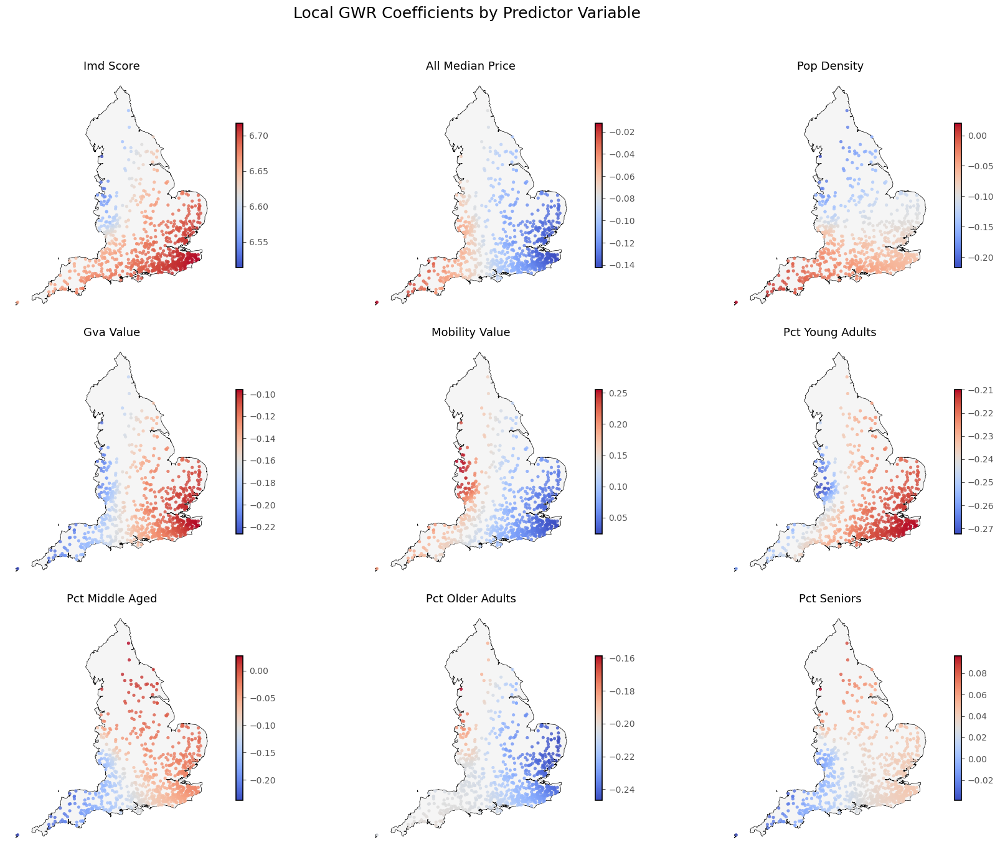

In [300]:
# List of variables to plot
variables_to_plot = [
    'imd_score', 'all_median_price', 'pop_density', 'gva_value', 'mobility_value',
    'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]

# Loop through each variable and plot
for variable_choice in variables_to_plot:
    display_variable = f'gwr_coef_{variable_choice}'

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    # Plot England boundary
    england.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.5)

    # Plot vineyards with GWR coefficient coloring
    vineyards_joined.plot(
        column=display_variable,
        cmap='coolwarm',
        legend=True,
        legend_kwds={'label': f"Local GWR Coefficient: {variable_choice}", 'shrink': 0.6},
        markersize=30,
        ax=ax
    )

    # Final touches
    ax.set_title(f"GWR Local Coefficient for {variable_choice.replace('_', ' ').title()}", fontsize=16)
    ax.set_axis_off()

    plt.show()

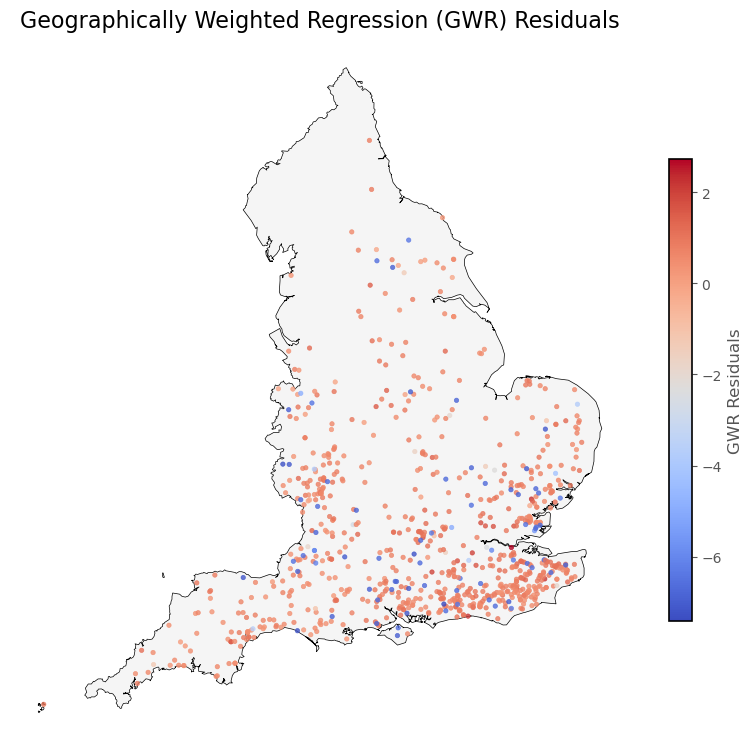

In [302]:
# check gwr residuals

# Step 1: Extract GWR residuals
vineyards_joined['gwr_residuals'] = gwr_results.resid_response.flatten()

# Step 2: Update plot settings for academic style
matplotlib.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'legend.fontsize': 10,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
})

# Step 3: Create figure
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Step 4: Plot England boundary
england.plot(ax=ax, color='whitesmoke', edgecolor='black', linewidth=0.5)

# Step 5: Plot GWR residuals
vineyards_joined.plot(
    column='gwr_residuals',
    cmap='coolwarm',
    legend=True,
    legend_kwds={'label': "GWR Residuals", 'shrink': 0.6},
    markersize=10,
    ax=ax,
    alpha=0.8
)

# Step 6: Final touches
ax.set_title("Geographically Weighted Regression (GWR) Residuals", fontsize=16)
ax.set_axis_off()

# Step 7: Save output
output_path = os.path.join('./output/gwr_residuals_map.png')
fig.savefig(output_path, dpi=300)

# Step 8: Show plot
plt.show()

In [306]:
# 1. Extract vineyard coordinates
coords = np.array([ (geom.x, geom.y) for geom in vineyards_joined.geometry ])

# 2. Build KNN spatial weights matrix
w = KNN(coords, k=5)
w.transform = 'r'

# Moran's I test
moran = esda.Moran(vineyards_joined['gwr_residuals'], w)

print(f"Moran's I: {moran.I:.3f}")
print(f"p-value: {moran.p_sim:.3f}")

Moran's I: 0.030
p-value: 0.078


C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\libpysal\weights\distance.py:153: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  W.__init__(self, neighbors, id_order=ids, **kwargs)


C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a

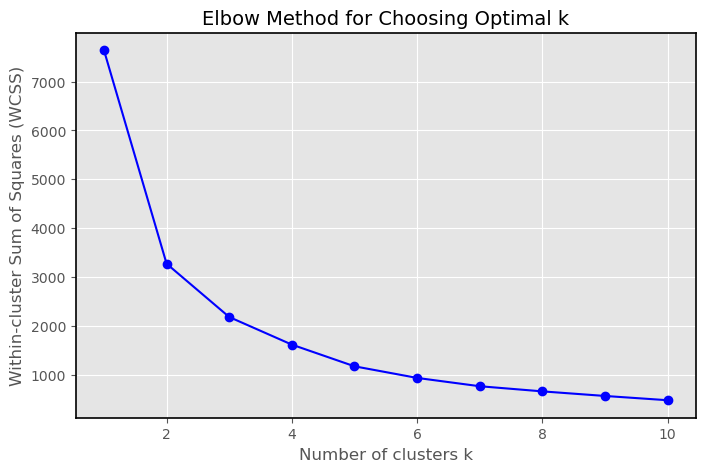

In [304]:
# Prepare the standardized GWR coefficients again
gwr_columns = [f'gwr_coef_{var}' for var in [
    'imd_score', 'all_median_price', 'pop_density', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults',
    'pct_seniors', 'gva_value', 'mobility_value'
]]
X_cluster = vineyards_joined[gwr_columns].dropna()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# Elbow method
wcss = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

# Plot
plt.figure(figsize=(8,5))
plt.plot(K, wcss, 'bo-')
plt.xlabel('Number of clusters k')
plt.ylabel('Within-cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Choosing Optimal k')
plt.grid(True)
plt.show()

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


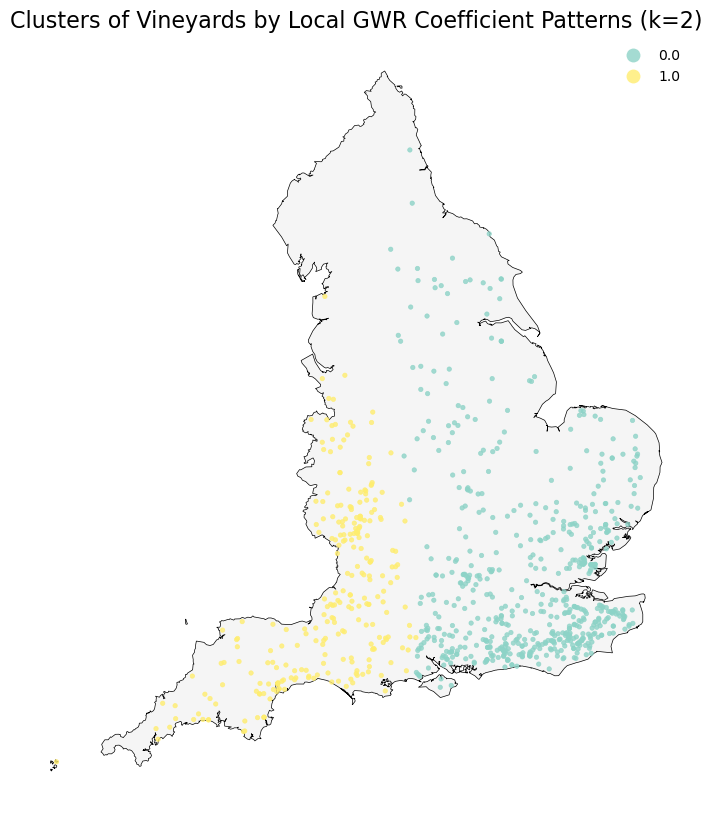

In [305]:
# Step 1: Run KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=42)
vineyards_joined.loc[X_cluster.index, 'gwr_cluster'] = kmeans.fit_predict(X_scaled)

# Step 2: Set academic plot style
matplotlib.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'legend.fontsize': 10,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
})

# Step 3: Create figure
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Step 4: Plot England boundary
england.plot(ax=ax, color='whitesmoke', edgecolor='black', linewidth=0.5)

# Step 5: Plot clustered vineyards
vineyards_joined.plot(
    column='gwr_cluster',
    categorical=True,
    cmap='Set3',  # Good for clusters
    legend=True,
    markersize=10,
    ax=ax,
    alpha=0.8
)

# Step 6: Final touches
ax.set_title("Clusters of Vineyards by Local GWR Coefficient Patterns (k=2)", fontsize=16)
ax.set_axis_off()

# Step 7: Save figure
output_path = os.path.join('./output/gwr_vineyard_clusters.png')
fig.savefig(output_path, dpi=300)

# Step 8: Show plot
plt.show()

In [311]:
# cluster profiling

# 1. List of GWR coefficient columns
gwr_columns = [f'gwr_coef_{var}' for var in ['imd_score', 'all_median_price', 'pop_density',  'gva_value', 'mobility_value',
                                             'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]]

# 2. Group by cluster and take mean
cluster_profiles = vineyards_joined.groupby('gwr_cluster')[gwr_columns].mean()

# 3. Show the profiles
print(cluster_profiles.transpose())

gwr_cluster                     0.0       1.0
gwr_coef_imd_score         6.690414  6.639168
gwr_coef_all_median_price -0.119066 -0.059758
gwr_coef_pop_density      -0.076563 -0.056345
gwr_coef_gva_value        -0.118129 -0.181713
gwr_coef_mobility_value    0.067882  0.175665
gwr_coef_pct_young_adults -0.217369 -0.244502
gwr_coef_pct_middle_aged  -0.047212 -0.141099
gwr_coef_pct_older_adults -0.226784 -0.201225
gwr_coef_pct_seniors       0.039095  0.005029


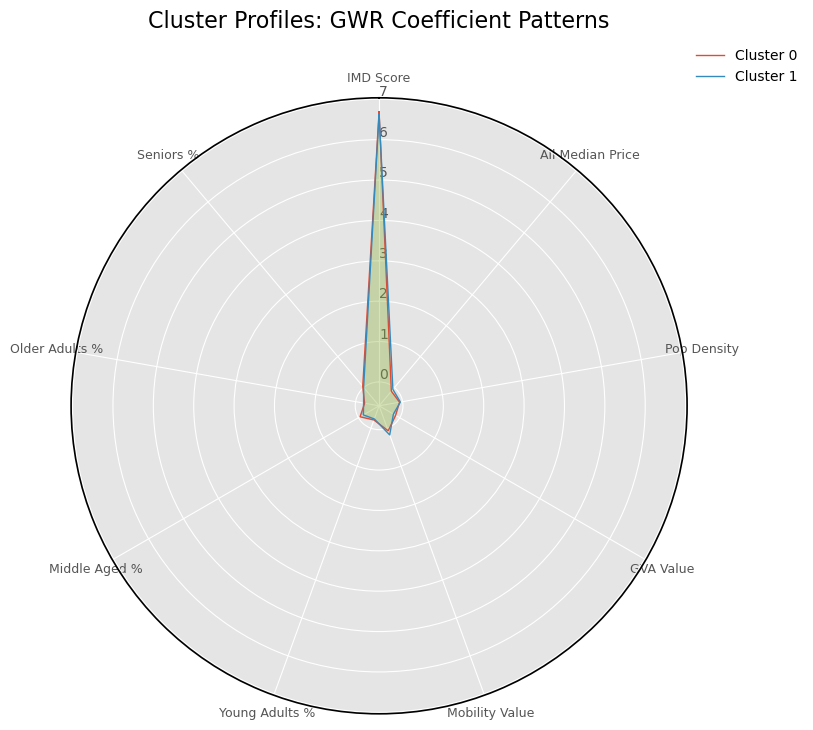

In [312]:
# 1. List of GWR variables (for nice display)
variables_nice = [
    'IMD Score', 'All Median Price', 'Pop Density', 'GVA Value', 'Mobility Value', 
    'Young Adults %', 'Middle Aged %', 'Older Adults %', 'Seniors %']

# 2. Load cluster profiles
cluster_profiles = vineyards_joined.groupby('gwr_cluster')[gwr_columns].mean()

# 3. Prepare data for plotting
categories = variables_nice
N = len(categories)

values0 = cluster_profiles.loc[0.0].values.flatten().tolist()
values1 = cluster_profiles.loc[1.0].values.flatten().tolist()

# Make the plot circular
values0 += values0[:1]
values1 += values1[:1]
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]

# 4. Create radar chart
fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(polar=True))

# Draw Cluster 0
ax.plot(angles, values0, linewidth=1, linestyle='solid', label='Cluster 0')
ax.fill(angles, values0, 'teal', alpha=0.2)

# Draw Cluster 1
ax.plot(angles, values1, linewidth=1, linestyle='solid', label='Cluster 1')
ax.fill(angles, values1, 'gold', alpha=0.2)

# Add labels
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
plt.xticks(angles[:-1], categories, size=9)
ax.set_rlabel_position(0)

# Add title and legend
plt.title('Cluster Profiles: GWR Coefficient Patterns', size=16, y=1.1)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))

plt.show()


---

# 3.5 Two Response Variables


In [221]:
# # create two response variables

# regression_df1 = regression_df.copy()
# regression_df1['has_vineyards'] = (regression_df1['vineyard_count'] > 0).astype(int)    # 0/1 for presence

# regression_df2 = regression_df[regression_df['year'] == 2019].copy()
# regression_df2['has_vineyards'] = (regression_df2['vineyard_count'] > 0).astype(int)    # 0/1 for presence

# df_pos1 = regression_df1[regression_df1.has_vineyards == 1].copy()                       # just the positive LSOAs
# df_pos2 = regression_df2[regression_df2.has_vineyards == 1].copy()                       # just the positive LSOAs

In [315]:
# Select just the covariates you really want to predict presence with:
covariates = [
    'imd_score', 'all_median_price', 'pop_density', 'gva_value', 'mobility_value',
    'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors',
]

In [227]:
# print(f"regression_df2 contains {len(regression_df2)} rows, {len(regression_df2[regression_df2['has_vineyards'] == 1])} of them contain vineyards")

regression_df2 contains 32829 rows, 673 of them contain vineyards


## 3.5.1 model presence / absence
uses simple logit (logistic) regression

🥂 Logit asks: *“Is there a vineyard here (yes or no)?”*  
→ Binary decision (presence/absence).

In [323]:
# Step 0: Reset index on regression_df so LSOA11CD and year become columns
regression_df = regression_df.reset_index()

# Step 1: Extract LSOA11CD, year, and vineyard_present from original
vineyard_present_df = regression_df[['LSOA11CD', 'year', 'vineyard_present']].drop_duplicates()

# Step 2: Reset index on regression_df_normal as well
regression_df_normal = regression_df_normal.reset_index()

# Step 3: Merge into regression_df_normal
regression_df_normal = regression_df_normal.merge(vineyard_present_df, on=['LSOA11CD', 'year'], how='left')

In [325]:
# Use regression_df_normal (already Box-Cox and Z-scored)
df_model = regression_df_normal[covariates + ['vineyard_present', 'LSOA11CD', 'year']].replace([np.inf, -np.inf], np.nan).dropna()
df_model

,imd_score,all_median_price,pop_density,gva_value,mobility_value,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,vineyard_present,LSOA11CD,year
0,-0.975495,0.646354,1.832540,1.737352,1.516433,0.747595,1.077251,1.693170,-0.075872,0,E01000001,2004
1,-1.064521,0.765774,0.439705,13.769530,1.828385,0.138512,2.455933,1.724921,-0.438298,0,E01000002,2004
2,-0.274252,0.025367,4.951147,0.005888,1.491966,1.391662,0.974374,-0.543367,0.119749,0,E01000003,2004
3,0.652783,-0.195562,0.278298,4.174434,1.436915,1.176056,0.775661,-1.234887,-0.541994,0,E01000005,2004
4,-0.201999,-0.183620,1.494722,-0.134195,1.491966,1.142931,0.211621,-0.909873,-0.917636,0,E01000006,2004
...,...,...,...,...,...,...,...,...,...,...,...,...
524196,-0.448434,-0.571737,-0.381376,1.706123,0.452124,3.648794,0.149169,-1.420537,-1.170852,0,E01033748,2019
524197,-0.477206,-0.213475,-0.089888,-0.112205,-0.856853,0.619041,-1.859396,-1.942798,-1.199221,0,E01033749,2019
524198,-0.636873,-0.512056,-0.016030,0.041844,1.149430,4.393676,-1.858542,-1.711185,-1.470504,0,E01033750,2019
524199,1.257581,-0.158183,-0.067804,0.148530,0.439891,3.828843,-2.916590,-2.098400,-1.674293,0,E01033751,2019


In [326]:
# Logistic regression with clustered standard errors by LSOA
logit_model = smf.logit(
    formula="vineyard_present ~ " + " + ".join(covariates),
    data=df_model
).fit(cov_type='cluster', cov_kwds={'groups': df_model['LSOA11CD']})

print(logit_model.summary())

Optimization terminated successfully.
         Current function value: 0.061979
         Iterations 13
                           Logit Regression Results                           
Dep. Variable:       vineyard_present   No. Observations:               524201
Model:                          Logit   Df Residuals:                   524191
Method:                           MLE   Df Model:                            9
Date:                Sun, 27 Apr 2025   Pseudo R-squ.:                  0.3210
Time:                        20:37:47   Log-Likelihood:                -32490.
converged:                       True   LL-Null:                       -47849.
Covariance Type:              cluster   LLR p-value:                     0.000
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           -9.5110      0.959     -9.920      0.000     -11.390      -7.632
imd_score 

In [228]:
# df_model = regression_df_normal[covariates + ['vineyard_present']].replace([np.inf, -np.inf], np.nan).dropna()

# # Logit for presence
# X_logit = sm.add_constant(df_model[covariates])
# y_logit = df_model['vineyard_present']
# logit = sm.Logit(y_logit, X_logit).fit(disp=0)
# print(logit.summary())

                           Logit Regression Results                           
Dep. Variable:          has_vineyards   No. Observations:                 8435
Model:                          Logit   Df Residuals:                     8420
Method:                           MLE   Df Model:                           14
Date:                Fri, 25 Apr 2025   Pseudo R-squ.:                  0.1969
Time:                        23:43:30   Log-Likelihood:                -937.60
converged:                       True   LL-Null:                       -1167.5
Covariance Type:            nonrobust   LLR p-value:                 3.018e-89
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -3.9306      0.293    -13.430      0.000      -4.504      -3.357
imd_score            0.2099      0.127      1.655      0.098      -0.039       0.458
D_median_price    2.602e-07 

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\matplotlib\cbook.py:1699: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


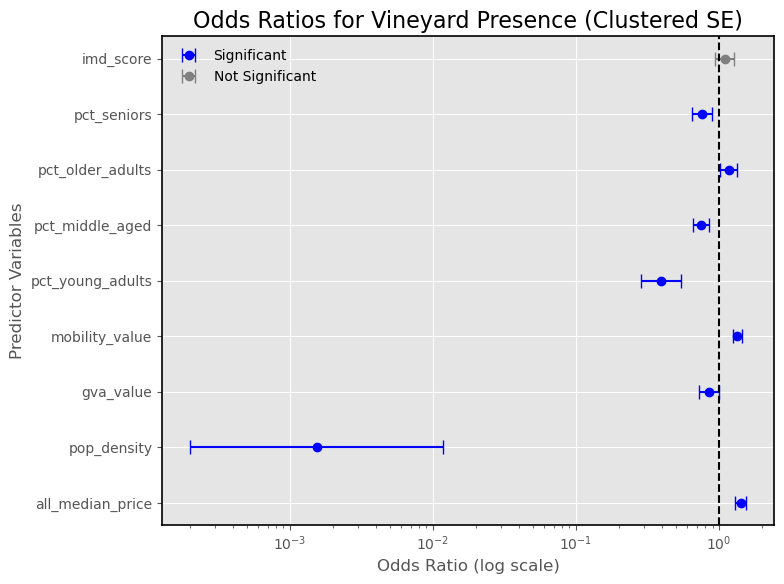

In [328]:
# Determine significance (if 95% CI does not cross 1)

# 1. Prepare summary DataFrame
params = logit_model.params
conf = logit_model.conf_int()

df_summary = pd.DataFrame({
    'variable': params.index,
    'coef': params.values,
    'lower_ci': conf[0].values,
    'upper_ci': conf[1].values
})

# 2. Calculate Odds Ratios and their 95% Confidence Intervals
df_summary['odds_ratio'] = np.exp(df_summary['coef'])
df_summary['lower_ci_or'] = np.exp(df_summary['lower_ci'])
df_summary['upper_ci_or'] = np.exp(df_summary['upper_ci'])

# 3. Determine if each variable is significant (if 95% CI does not cross 1)
df_summary['significant'] = (df_summary['lower_ci_or'] > 1) | (df_summary['upper_ci_or'] < 1)

# 4. Set academic-style plot settings
matplotlib.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'legend.fontsize': 10,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
})

# 5. Plot Odds Ratios
fig, ax = plt.subplots(figsize=(8, 6))

# Separate significant and non-significant
sig = df_summary[df_summary['significant'] & (df_summary['variable'] != 'Intercept')]
nonsig = df_summary[~df_summary['significant'] & (df_summary['variable'] != 'Intercept')]

# Plot significant
ax.errorbar(
    sig['odds_ratio'],
    sig['variable'],
    xerr=[sig['odds_ratio'] - sig['lower_ci_or'], sig['upper_ci_or'] - sig['odds_ratio']],
    fmt='o',
    capsize=5,
    label='Significant',
    color='blue'
)

# Plot non-significant
ax.errorbar(
    nonsig['odds_ratio'],
    nonsig['variable'],
    xerr=[nonsig['odds_ratio'] - nonsig['lower_ci_or'], nonsig['upper_ci_or'] - nonsig['odds_ratio']],
    fmt='o',
    capsize=5,
    label='Not Significant',
    color='grey'
)

# 6. Final plot touches
ax.axvline(1, color='black', linestyle='--')
ax.set_xlabel('Odds Ratio (log scale)')
ax.set_ylabel('Predictor Variables')
ax.set_title('Odds Ratios for Vineyard Presence (Clustered SE)', fontsize=16)
ax.set_xscale('log')
ax.legend()
plt.tight_layout()

# 7. Save output
output_path = os.path.join('./output', 'logistic_odds_ratios.png')
fig.savefig(output_path, dpi=300)

# 8. Show plot
plt.show()

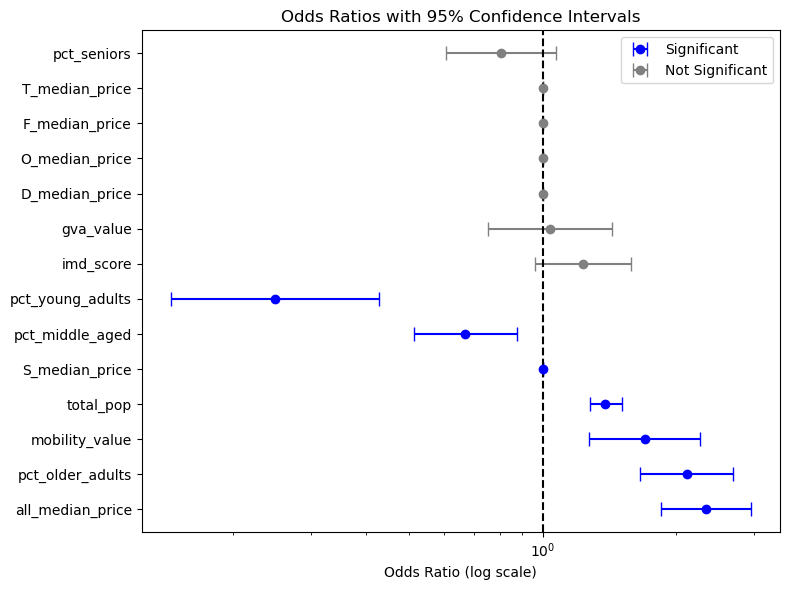

In [231]:
# # Determine significance (if 95% CI does not cross 1)
# df_summary['significant'] = (df_summary['lower_ci_or'] > 1) | (df_summary['upper_ci_or'] < 1)

# # Plotting with colors
# plt.figure(figsize=(8, 6))

# # Significant variables
# sig = df_summary[df_summary['significant']]
# plt.errorbar(
#     sig['odds_ratio'],
#     sig['variable'],
#     xerr=[sig['odds_ratio'] - sig['lower_ci_or'], sig['upper_ci_or'] - sig['odds_ratio']],
#     fmt='o',
#     capsize=5,
#     label='Significant',
#     color='blue'
# )

# # Non-significant variables
# nonsig = df_summary[~df_summary['significant']]
# plt.errorbar(
#     nonsig['odds_ratio'],
#     nonsig['variable'],
#     xerr=[nonsig['odds_ratio'] - nonsig['lower_ci_or'], nonsig['upper_ci_or'] - nonsig['odds_ratio']],
#     fmt='o',
#     capsize=5,
#     label='Not Significant',
#     color='grey'
# )

# plt.axvline(1, color='black', linestyle='--')
# plt.xlabel('Odds Ratio (log scale)')
# plt.title('Odds Ratios with 95% Confidence Intervals')
# plt.xscale('log')
# plt.legend()
# plt.tight_layout()
# plt.show()

In [331]:
# Recreate the X matrix manually
X_vif = sm.add_constant(df_model[covariates])  # Add constant term manually

# Calculate VIFs
vif_data = pd.DataFrame()
vif_data['feature'] = X_vif.columns
vif_data['VIF'] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]

# Output
print(vif_data)

            feature       VIF
0             const  1.000000
1         imd_score  1.691710
2  all_median_price  1.221291
3       pop_density  1.771323
4         gva_value  1.036663
5    mobility_value  1.364895
6  pct_young_adults  4.940922
7   pct_middle_aged  2.470680
8  pct_older_adults  3.017952
9       pct_seniors  3.971289


In [333]:
df_model['predicted_prob'] = logit_model.predict(X_logit_model)

NameError: name 'X_logit_model' is not defined

In [334]:
X_vif

,const,imd_score,all_median_price,pop_density,gva_value,mobility_value,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors
0,1.0,-0.975495,0.646354,1.832540,1.737352,1.516433,0.747595,1.077251,1.693170,-0.075872
1,1.0,-1.064521,0.765774,0.439705,13.769530,1.828385,0.138512,2.455933,1.724921,-0.438298
2,1.0,-0.274252,0.025367,4.951147,0.005888,1.491966,1.391662,0.974374,-0.543367,0.119749
3,1.0,0.652783,-0.195562,0.278298,4.174434,1.436915,1.176056,0.775661,-1.234887,-0.541994
4,1.0,-0.201999,-0.183620,1.494722,-0.134195,1.491966,1.142931,0.211621,-0.909873,-0.917636
...,...,...,...,...,...,...,...,...,...,...
524196,1.0,-0.448434,-0.571737,-0.381376,1.706123,0.452124,3.648794,0.149169,-1.420537,-1.170852
524197,1.0,-0.477206,-0.213475,-0.089888,-0.112205,-0.856853,0.619041,-1.859396,-1.942798,-1.199221
524198,1.0,-0.636873,-0.512056,-0.016030,0.041844,1.149430,4.393676,-1.858542,-1.711185,-1.470504
524199,1.0,1.257581,-0.158183,-0.067804,0.148530,0.439891,3.828843,-2.916590,-2.098400,-1.674293


In [ ]:
### MAP PREDICTED RESULTS!! ###

## need to map the model results back to the original lsoas - see above table
## where lsoas, codes, and geoms have been lost in the process somewhere



## 3.5.2 model intensity once present
### 3.5.2.a count  of vineyards
uses zero-inflated negative binomial (zinb) regression

🍇 ZINB asks: *“How many vineyards are here?”* but also *“Are there some places that could never realistically have vineyards (structural zero)?”*  
→ Count data with lots of zeros, and some zeros are different than others.

In [351]:
# create df suitable for zinb

# copy regression_df_normal so originals are untouched
zinb_df = regression_df_normal.copy()

# add vineyard_count from regression_df as a new column
zinb_df['vineyard_count_raw'] = regression_df['vineyard_count'].astype(int).values

zinb_df

,index,LSOA11CD,LSOA11NM,geometry,year,vineyard_count,vineyard_area,imd_score,D_median_price,F_median_price,...,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density,vineyard_present,vineyard_count_raw
0,312777,E01000001,City of London 001A,"POLYGON ((532151.537 181867.433, 532152.500 18...",2004,-0.11519,-0.043485,-0.975495,NaN,1.152441,...,-3.243940,0.747595,1.077251,1.693170,-0.075872,1.737352,1.516433,1.832540,0,0
1,312778,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",2004,-0.11519,-0.043485,-1.064521,NaN,1.311884,...,-2.633250,0.138512,2.455933,1.724921,-0.438298,13.769530,1.828385,0.439705,0,0
2,312779,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.250 18...",2004,-0.11519,-0.043485,-0.274252,NaN,0.413205,...,-2.614125,1.391662,0.974374,-0.543367,0.119749,0.005888,1.491966,4.951147,0,0
3,312780,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",2004,-0.11519,-0.043485,0.652783,NaN,0.145050,...,-0.619360,1.176056,0.775661,-1.234887,-0.541994,4.174434,1.436915,0.278298,0,0
4,312781,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",2004,-0.11519,-0.043485,-0.201999,NaN,-0.307913,...,0.042397,1.142931,0.211621,-0.909873,-0.917636,-0.134195,1.491966,1.494722,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524196,867040,E01033748,Liverpool 050I,"MULTIPOLYGON (((334607.901 388176.505, 334600....",2019,-0.11519,-0.043485,-0.448434,NaN,-0.309725,...,-3.255014,3.648794,0.149169,-1.420537,-1.170852,1.706123,0.452124,-0.381376,0,0
524197,867041,E01033749,Liverpool 042F,"POLYGON ((338929.000 388182.000, 338936.000 38...",2019,-0.11519,-0.043485,-0.477206,NaN,NaN,...,3.487200,0.619041,-1.859396,-1.942798,-1.199221,-0.112205,-0.856853,-0.089888,0,0
524198,867042,E01033750,Liverpool 061A,"POLYGON ((334442.091 389502.020, 334489.805 38...",2019,-0.11519,-0.043485,-0.636873,NaN,-0.239099,...,-2.543904,4.393676,-1.858542,-1.711185,-1.470504,0.041844,1.149430,-0.016030,0,0
524199,867043,E01033751,Liverpool 062A,"POLYGON ((334674.977 391540.458, 334679.726 39...",2019,-0.11519,-0.043485,1.257581,NaN,0.192702,...,-0.330118,3.828843,-2.916590,-2.098400,-1.674293,0.148530,0.439891,-0.067804,0,0


In [359]:
zinb_df_formodel[covariates].describe()

,imd_score,all_median_price,pop_density,gva_value,mobility_value,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors
count,5.242010e+05,5.242010e+05,5.242010e+05,5.242010e+05,5.242010e+05,5.242010e+05,5.242010e+05,5.242010e+05,5.242010e+05
mean,-2.298890e-16,5.725538e-17,-2.715293e-16,-4.337528e-18,7.252348e-16,1.518135e-16,-1.735011e-16,5.187684e-16,-4.615130e-16
std,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00
min,-1.372243e+00,-1.316145e+00,-1.008421e+00,-1.470101e-01,-2.349332e+00,-2.223480e+00,-5.867801e+00,-4.011245e+00,-2.276356e+00
25%,-7.695895e-01,-5.478554e-01,-7.172365e-01,-1.216533e-01,-7.651026e-01,-6.602105e-01,-5.880549e-01,-6.567019e-01,-7.327207e-01
50%,-2.800579e-01,-2.403443e-01,-1.920930e-01,-9.908628e-02,-4.944678e-02,-1.800809e-01,4.950983e-03,4.248114e-02,-9.095047e-02
75%,5.392418e-01,2.343527e-01,3.473398e-01,-3.984598e-02,6.723258e-01,3.555126e-01,6.029030e-01,7.068273e-01,6.126736e-01
max,4.586389e+00,1.191543e+02,1.926326e+01,1.940410e+02,3.632817e+00,7.983932e+00,7.517012e+00,6.914041e+00,6.292221e+00


Variable	Max value	Danger?  
imd_score	4.59	✅ fine  
all_median_price	119.15	❌ way too large  
pop_density	19.26	⚠ borderline large  
gva_value	194.04	❌ way too large  
mobility_value	3.63	✅ fine  
pct_young_adults	7.98	⚠ a little large  
pct_middle_aged	7.52	⚠ a little large  
pct_older_adults	6.91	✅ manageable  
pct_seniors	6.29	✅ manageable  

In [364]:
# Step 1: Build ZINB dataset from the *normalised* panel
covariates = [
    'imd_score', 'all_median_price', 'pop_density', 'gva_value', 'mobility_value',
    'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]

# 1.1 Assemble main dataset
zinb_df_formodel = zinb_df_formodel[covariates + ['vineyard_count_raw', 'LSOA11CD', 'year']].replace([np.inf, -np.inf], np.nan).dropna()

# Rescale dangerous variables manually
zinb_df_formodel['all_median_price'] /= 100
zinb_df_formodel['gva_value'] /= 100

# 1.2 Response variable: vineyard count (NB model target)
y_zinb = zinb_df_formodel['vineyard_count_raw']

# Step 2: Design matrices

# 2.1 Mean model (for count part, vineyard_count)
X_zinb_main = sm.add_constant(zinb_df_formodel[covariates])

# 2.2 Zero-inflation model predictors (choose simpler set)
infl_covariates = ['imd_score', 'mobility_value', 'all_median_price', 'gva_value']
X_zinb_infl = sm.add_constant(zinb_df_formodel[infl_covariates])

# Step 3: Prefit a standard NB model for starting values
nb_prefit = NegativeBinomial(y_zinb, X_zinb_main).fit(disp=0)

# 3.1 Set up starting parameters
k_main = X_zinb_main.shape[1]
k_infl = X_zinb_infl.shape[1]

start_main = np.random.normal(0, 0.05, size=k_main) # Start very close to 0, but allow tiny randomness.
start_infl = np.zeros(k_infl)  # Assume no inflation at start
start_alpha = np.array([0.1])  # Initial guess for dispersion
start_params = np.concatenate([start_main, start_infl, start_alpha])

# Step 4: Fit the ZINB model
zinb_model = ZeroInflatedNegativeBinomialP(
    endog=y_zinb,
    exog=X_zinb_main,
    exog_infl=X_zinb_infl,
    inflation='logit'
).fit(
    start_params=start_params,
    method='bfgs',
    maxiter=500,
    disp=1,
    cov_type="HC0"  # Robust standard errors [added later]
)

# Step 5: Summarise results
print(zinb_model.summary())


C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:3379: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:3379: RuntimeWarning: invalid value encountered in multiply
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:3379: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:3379: RuntimeWarning: invalid value encountered in multiply
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check 

Optimization terminated successfully.
         Current function value: 0.072396
         Iterations: 117
         Function evaluations: 118
         Gradient evaluations: 118


C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\base\model.py:595: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


                     ZeroInflatedNegativeBinomialP Regression Results                    
Dep. Variable:                vineyard_count_raw   No. Observations:               524201
Model:             ZeroInflatedNegativeBinomialP   Df Residuals:                   524191
Method:                                      MLE   Df Model:                            9
Date:                           Sun, 27 Apr 2025   Pseudo R-squ.:                  0.2043
Time:                                   22:44:38   Log-Likelihood:                -37950.
converged:                                  True   LL-Null:                       -47695.
Covariance Type:                             HC0   LLR p-value:                     0.000
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
inflate_const                0.0230      0.101      0.228      0.820      -0.174       0.220
i

In [365]:
# create df suitable for zinb

# copy regression_df_normal so originals are untouched
zinb_df = regression_df_normal.copy()

# add vineyard_count from regression_df as a new column
zinb_df['vineyard_count_raw'] = regression_df['vineyard_count'].astype(int).values

zinb_df

# Step 1: Build ZINB dataset from the *normalised* panel
covariates = [
    'imd_score', 'all_median_price', 'pop_density', 'gva_value', 'mobility_value',
    'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]

# 1.1 Assemble main dataset
zinb_df_formodel = zinb_df[covariates + ['vineyard_count_raw', 'LSOA11CD', 'year']].replace([np.inf, -np.inf], np.nan).dropna()

# # Rescale dangerous variables manually
zinb_df_formodel['all_median_price'] /= 100
zinb_df_formodel['gva_value'] /= 100

# 1.2 Response variable: vineyard count (NB model target)
y_zinb = zinb_df_formodel['vineyard_count_raw']

# Step 2: Design matrices

# 2.1 Mean model (for count part, vineyard_count)
X_zinb_main = sm.add_constant(zinb_df_formodel[covariates])

# 2.2 Zero-inflation model predictors (choose simpler set)
infl_covariates = ['imd_score', 'mobility_value', 'all_median_price', 'gva_value']
X_zinb_infl = sm.add_constant(zinb_df_formodel[infl_covariates])

# Step 3: Prefit a standard NB model for starting values
nb_prefit = NegativeBinomial(y_zinb, X_zinb_main).fit(disp=0)

# 3.1 Set up starting parameters
k_main = X_zinb_main.shape[1]
k_infl = X_zinb_infl.shape[1]

start_main = np.random.normal(0, 0.05, size=k_main) # Start very close to 0, but allow tiny randomness.
start_infl = np.zeros(k_infl)  # Assume no inflation at start
start_alpha = np.array([0.1])  # Initial guess for dispersion
start_params = np.concatenate([start_main, start_infl, start_alpha])

# Step 4: Fit the ZINB model
zinb_model = ZeroInflatedNegativeBinomialP(
    endog=y_zinb,
    exog=X_zinb_main,
    exog_infl=X_zinb_infl,
    inflation='logit'
).fit(
    start_params=start_params,
    method='bfgs',
    maxiter=500,
    disp=1,
    cov_type="HC0"  # Robust standard errors [added later]
)

# Step 5: Summarise results
print(zinb_model.summary())


C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:1074: RuntimeWarning: overflow encountered in exp
  return np.exp(linpred)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:1567: RuntimeWarning: overflow encountered in exp
  L = np.exp(np.dot(X,params) + exposure + offset)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:1478: RuntimeWarning: overflow encountered in exp
  L = np.exp(np.dot(X,params) + offset + exposure)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\base\model.py:595: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likeli

Optimization terminated successfully.
         Current function value: 0.070565
         Iterations: 195
         Function evaluations: 197
         Gradient evaluations: 197


C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\base\model.py:595: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


                     ZeroInflatedNegativeBinomialP Regression Results                    
Dep. Variable:                vineyard_count_raw   No. Observations:               524201
Model:             ZeroInflatedNegativeBinomialP   Df Residuals:                   524191
Method:                                      MLE   Df Model:                            9
Date:                           Sun, 27 Apr 2025   Pseudo R-squ.:                  0.2244
Time:                                   23:00:34   Log-Likelihood:                -36990.
converged:                                  True   LL-Null:                       -47695.
Covariance Type:                             HC0   LLR p-value:                     0.000
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
inflate_const              -41.8715      9.911     -4.225      0.000     -61.297     -22.446
i

In [366]:
# create df suitable for zinb

# copy regression_df_normal so originals are untouched
zinb_df = regression_df_normal.copy()

# add vineyard_count from regression_df as a new column
zinb_df['vineyard_count_raw'] = regression_df['vineyard_count'].astype(int).values

zinb_df

# Step 1: Build ZINB dataset from the *normalised* panel
covariates = [
    'imd_score', 'all_median_price', 'pop_density', 'gva_value', 'mobility_value',
    'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]

# 1.1 Assemble main dataset
zinb_df_formodel = zinb_df[covariates + ['vineyard_count_raw', 'LSOA11CD', 'year']].replace([np.inf, -np.inf], np.nan).dropna()

# # Rescale dangerous variables manually
# zinb_df_formodel['all_median_price'] /= 100
# zinb_df_formodel['gva_value'] /= 100

# 1.2 Response variable: vineyard count (NB model target)
y_zinb = zinb_df_formodel['vineyard_count_raw']

# Step 2: Design matrices

# 2.1 Mean model (for count part, vineyard_count)
X_zinb_main = sm.add_constant(zinb_df_formodel[covariates])

# 2.2 Zero-inflation model predictors (choose simpler set)
infl_covariates = ['imd_score', 'mobility_value', 'all_median_price', 'gva_value']
X_zinb_infl = sm.add_constant(zinb_df_formodel[infl_covariates])

# Step 3: Prefit a standard NB model for starting values
nb_prefit = NegativeBinomial(y_zinb, X_zinb_main).fit(disp=0)

# 3.1 Set up starting parameters
k_main = X_zinb_main.shape[1]
k_infl = X_zinb_infl.shape[1]

start_main = np.random.normal(0, 0.05, size=k_main) # Start very close to 0, but allow tiny randomness.
start_infl = np.zeros(k_infl)  # Assume no inflation at start
start_alpha = np.array([0.1])  # Initial guess for dispersion
start_params = np.concatenate([start_main, start_infl, start_alpha])

# Step 4: Fit the ZINB model
zinb_model = ZeroInflatedNegativeBinomialP(
    endog=y_zinb,
    exog=X_zinb_main,
    exog_infl=X_zinb_infl,
    inflation='logit'
).fit(
    start_params=start_params,
    method='bfgs',
    maxiter=500,
    disp=1,
    cov_type="HC0"  # Robust standard errors [added later]
)

# Step 5: Summarise results
print(zinb_model.summary())

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:1074: RuntimeWarning: overflow encountered in exp
  return np.exp(linpred)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:1567: RuntimeWarning: overflow encountered in exp
  L = np.exp(np.dot(X,params) + exposure + offset)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:1478: RuntimeWarning: overflow encountered in exp
  L = np.exp(np.dot(X,params) + offset + exposure)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\base\model.py:595: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likeli

Optimization terminated successfully.
         Current function value: 0.067406
         Iterations: 125
         Function evaluations: 128
         Gradient evaluations: 128
                     ZeroInflatedNegativeBinomialP Regression Results                    
Dep. Variable:                vineyard_count_raw   No. Observations:               524201
Model:             ZeroInflatedNegativeBinomialP   Df Residuals:                   524191
Method:                                      MLE   Df Model:                            9
Date:                           Sun, 27 Apr 2025   Pseudo R-squ.:                  0.2592
Time:                                   23:10:03   Log-Likelihood:                -35334.
converged:                                  True   LL-Null:                       -47695.
Covariance Type:                             HC0   LLR p-value:                     0.000
                               coef    std err          z      P>|z|      [0.025      0.975]
------------

In [235]:
# # ── 2. Build count model dataset ───────────────────────────────────────
# model_zinb = regression_df2[['vineyard_count'] + covariates].copy()

# # 2.1 Clean infinities / NaNs
# model_zinb.replace([np.inf, -np.inf], np.nan, inplace=True)
# model_zinb.dropna(inplace=True)

# # 2.2 Scale the main covariates for the NB mean model
# scaler_main = StandardScaler()
# X_main_scaled = scaler_main.fit_transform(model_zinb[covariates])
# X_zinb = sm.add_constant(
#     pd.DataFrame(X_main_scaled,
#                  columns=covariates,
#                  index=model_zinb.index)
# )
# y_zinb = model_zinb['vineyard_count']

# # 2.3 Scale a small subset for the zero-inflation sub-model
# infl_covs = ['total_pop', 'pct_seniors', 'imd_score']
# scaler_infl = StandardScaler()
# X_infl_scaled = scaler_infl.fit_transform(model_zinb[infl_covs])
# X_zinb_infl = sm.add_constant(
#     pd.DataFrame(X_infl_scaled,
#                  columns=infl_covs,
#                  index=model_zinb.index)
# )

# # Prefit a plain NB to get sensible start values for the mean betas only
# nb_prefit = NegativeBinomial(y_zinb, X_zinb).fit(disp=0)

# # figure out how many coefficients each part has
# k_mean = X_zinb.shape[1]
# k_infl = X_zinb_infl.shape[1]

# # grab just the first k_mean betas (drop any dispersion param NB might have returned)
# start_mean  = nb_prefit.params[:k_mean].values

# # zeros for the inflation betas
# start_infl  = np.zeros(k_infl)

# # one value for the NB dispersion α
# start_alpha = np.array([0.1])

# # concatenate into a single start_params of length k_mean + k_infl + 1
# start_params = np.r_[start_mean, start_infl, start_alpha]

# # ── 3. Fit the ZINB with aligned start_params ──────────────────────────────
# zinb = ZeroInflatedNegativeBinomialP(
#     endog=y_zinb,
#     exog=X_zinb,
#     exog_infl=X_zinb_infl,
#     inflation='logit'
# ).fit(
#     start_params=start_params,
#     method='bfgs',
#     maxiter=500,
#     disp=1
# )

# print(zinb.summary())

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:3384: RuntimeWarning: overflow encountered in exp
  alpha = np.exp(params[-1])
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:3377: RuntimeWarning: invalid value encountered in subtract
  coeff = (gamma_ln(size+endog) - gamma_ln(endog+1) -
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:3379: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:3379: RuntimeWarning: invalid value encountered in multiply
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\discrete\discrete_model.py:3448: RuntimeWarning: overflow encountered in exp
  alpha = np.exp(params[-1])
C:\Users\aaron\anaconda3\env

Optimization terminated successfully.
         Current function value: 0.131290
         Iterations: 207
         Function evaluations: 213
         Gradient evaluations: 213
                     ZeroInflatedNegativeBinomialP Regression Results                    
Dep. Variable:                    vineyard_count   No. Observations:                 8435
Model:             ZeroInflatedNegativeBinomialP   Df Residuals:                     8420
Method:                                      MLE   Df Model:                           14
Date:                           Sat, 26 Apr 2025   Pseudo R-squ.:                  0.1893
Time:                                   00:17:04   Log-Likelihood:                -1107.4
converged:                                  True   LL-Null:                       -1366.0
Covariance Type:                       nonrobust   LLR p-value:                2.067e-101
                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------

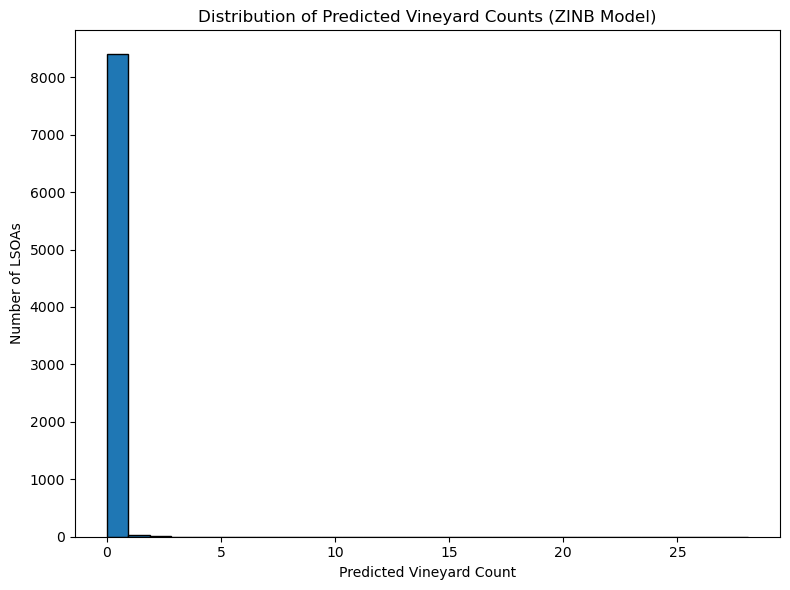

In [238]:
# Predict vineyard counts from fitted zinb model
predicted_counts = zinb.predict(which='mean')  # 'mean' gives expected count μ

# Attach predictions back to the model data
predictions_df = model_zinb.copy()
predictions_df['predicted_vineyard_count'] = predicted_counts

# Plot histogram of predicted counts

plt.figure(figsize=(8, 6))
plt.hist(predictions_df['predicted_vineyard_count'], bins=30, edgecolor='black')
plt.xlabel('Predicted Vineyard Count')
plt.ylabel('Number of LSOAs')
plt.title('Distribution of Predicted Vineyard Counts (ZINB Model)')
plt.tight_layout()
plt.show()

In [ ]:
# map it

## NEED TO ATTACH GEOM FIRST ##

# Assume model_zinb is a GeoDataFrame
predictions_gdf = model_zinb.copy()
predictions_gdf['predicted_vineyard_count'] = zinb.predict(which='mean')

# Simple map
predictions_gdf.plot(column='predicted_vineyard_count',
                     cmap='viridis',
                     legend=True,
                     figsize=(10, 8),
                     edgecolor='black')
plt.title('Spatial Distribution of Predicted Vineyard Counts')
plt.axis('off')
plt.show()

### 3.5.2.b area  of vineyards

In [ ]:
# 1. Merge vineyard_area into regression_df_normal
vineyard_area_df = regression_df[['LSOA11CD', 'year', 'vineyard_area']].drop_duplicates()
regression_df_normal = regression_df_normal.reset_index()
regression_df_normal = regression_df_normal.merge(vineyard_area_df, on=['LSOA11CD', 'year'], how='left')

In [247]:
# # log‐link Gamma on the positives
# gamma = sm.GLM(df_pos2.vineyard_area, X.loc[df_pos2.index],
#                family=sm.families.Gamma(sm.families.links.log())).fit()
# print(gamma.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:          vineyard_area   No. Observations:                  673
Model:                            GLM   Df Residuals:                      667
Model Family:                   Gamma   Df Model:                            5
Link Function:                    log   Scale:                          7.7975
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sat, 26 Apr 2025   Deviance:                       8886.1
Time:                        00:54:07   Pearson chi2:                 5.20e+03
No. Iterations:                   100   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.8918      0.361  

C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\genmod\families\links.py:13: FutureWarning: The log link alias is deprecated. Use Log instead. The log link alias will be removed after the 0.15.0 release.
  warnings.warn(
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\statsmodels\genmod\families\family.py:812: RuntimeWarning: invalid value encountered in log
  ll_obs -= special.gammaln(weight_scale) + np.log(endog)


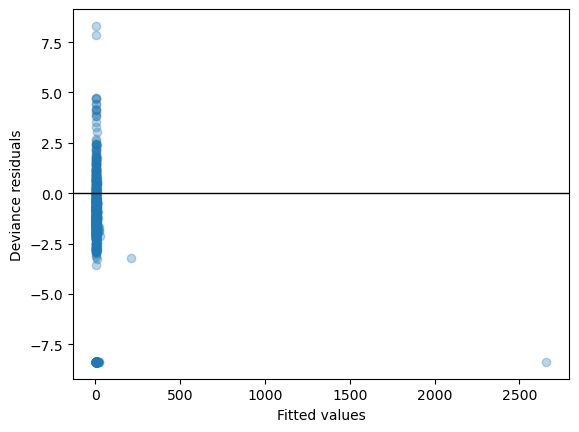

In [260]:
# residual plotting

res = gamma.resid_deviance
fitted = gamma.fittedvalues
plt.scatter(fitted, res, alpha=0.3)
plt.axhline(0, color='k', lw=1)
plt.xlabel('Fitted values'); plt.ylabel('Deviance residuals')
plt.show()

In [ ]:
## option 2: Tweedie GLM ##

tweedie = sm.GLM(
    regression_df1['vineyard_area'],
    X_zinb, 
    family=sm.families.Tweedie(power=1.5, link=sm.families.links.log())
).fit()
print(tweedie.summary())


---

---

## 3.3 Lag Time-Series Analysis

To perform a lag time analysis, we’ll be exploring how changes in one set of variables (e.g. socioeconomic indicators) might lead or follow changes in another (e.g. vineyard area), across a range of lags (±1 to ±20 years). This will help identify possible causal directions or time delays.  

**🎯 Objective:**  to assess whether:  
- Socioeconomic conditions precede vineyard expansion (positive lag: predictor changes first),
- Vineyard expansion precedes socioeconomic change (negative lag: response changes first),
- Or whether there's concurrent or no relationship.



In [340]:
regression_df_normal

,index,LSOA11CD,LSOA11NM,geometry,year,vineyard_count,vineyard_area,imd_score,D_median_price,F_median_price,...,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density,vineyard_present
0,312777,E01000001,City of London 001A,"POLYGON ((532151.537 181867.433, 532152.500 18...",2004,-0.11519,-0.043485,-0.975495,NaN,1.152441,...,-0.189638,-3.243940,0.747595,1.077251,1.693170,-0.075872,1.737352,1.516433,1.832540,0
1,312778,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",2004,-0.11519,-0.043485,-1.064521,NaN,1.311884,...,-0.670228,-2.633250,0.138512,2.455933,1.724921,-0.438298,13.769530,1.828385,0.439705,0
2,312779,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.250 18...",2004,-0.11519,-0.043485,-0.274252,NaN,0.413205,...,-0.404560,-2.614125,1.391662,0.974374,-0.543367,0.119749,0.005888,1.491966,4.951147,0
3,312780,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",2004,-0.11519,-0.043485,0.652783,NaN,0.145050,...,-1.765737,-0.619360,1.176056,0.775661,-1.234887,-0.541994,4.174434,1.436915,0.278298,0
4,312781,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",2004,-0.11519,-0.043485,-0.201999,NaN,-0.307913,...,-0.216503,0.042397,1.142931,0.211621,-0.909873,-0.917636,-0.134195,1.491966,1.494722,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524196,867040,E01033748,Liverpool 050I,"MULTIPOLYGON (((334607.901 388176.505, 334600....",2019,-0.11519,-0.043485,-0.448434,NaN,-0.309725,...,-1.016493,-3.255014,3.648794,0.149169,-1.420537,-1.170852,1.706123,0.452124,-0.381376,0
524197,867041,E01033749,Liverpool 042F,"POLYGON ((338929.000 388182.000, 338936.000 38...",2019,-0.11519,-0.043485,-0.477206,NaN,NaN,...,-2.494086,3.487200,0.619041,-1.859396,-1.942798,-1.199221,-0.112205,-0.856853,-0.089888,0
524198,867042,E01033750,Liverpool 061A,"POLYGON ((334442.091 389502.020, 334489.805 38...",2019,-0.11519,-0.043485,-0.636873,NaN,-0.239099,...,1.338701,-2.543904,4.393676,-1.858542,-1.711185,-1.470504,0.041844,1.149430,-0.016030,0
524199,867043,E01033751,Liverpool 062A,"POLYGON ((334674.977 391540.458, 334679.726 39...",2019,-0.11519,-0.043485,1.257581,NaN,0.192702,...,2.249138,-0.330118,3.828843,-2.916590,-2.098400,-1.674293,0.148530,0.439891,-0.067804,0


In [342]:
lag_df = regression_df_normal.copy()
lag_df.drop(columns=['index', 'D_median_price', 'F_median_price', 'S_median_price', 'T_median_price', 'O_median_price'], inplace=True)
lag_df

,LSOA11CD,LSOA11NM,geometry,year,vineyard_count,vineyard_area,imd_score,all_median_price,total_pop,pct_kids,pct_young_adults,pct_middle_aged,pct_older_adults,pct_seniors,gva_value,mobility_value,pop_density,vineyard_present
0,E01000001,City of London 001A,"POLYGON ((532151.537 181867.433, 532152.500 18...",2004,-0.11519,-0.043485,-0.975495,0.646354,-0.189638,-3.243940,0.747595,1.077251,1.693170,-0.075872,1.737352,1.516433,1.832540,0
1,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",2004,-0.11519,-0.043485,-1.064521,0.765774,-0.670228,-2.633250,0.138512,2.455933,1.724921,-0.438298,13.769530,1.828385,0.439705,0
2,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.250 18...",2004,-0.11519,-0.043485,-0.274252,0.025367,-0.404560,-2.614125,1.391662,0.974374,-0.543367,0.119749,0.005888,1.491966,4.951147,0
3,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",2004,-0.11519,-0.043485,0.652783,-0.195562,-1.765737,-0.619360,1.176056,0.775661,-1.234887,-0.541994,4.174434,1.436915,0.278298,0
4,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",2004,-0.11519,-0.043485,-0.201999,-0.183620,-0.216503,0.042397,1.142931,0.211621,-0.909873,-0.917636,-0.134195,1.491966,1.494722,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524196,E01033748,Liverpool 050I,"MULTIPOLYGON (((334607.901 388176.505, 334600....",2019,-0.11519,-0.043485,-0.448434,-0.571737,-1.016493,-3.255014,3.648794,0.149169,-1.420537,-1.170852,1.706123,0.452124,-0.381376,0
524197,E01033749,Liverpool 042F,"POLYGON ((338929.000 388182.000, 338936.000 38...",2019,-0.11519,-0.043485,-0.477206,-0.213475,-2.494086,3.487200,0.619041,-1.859396,-1.942798,-1.199221,-0.112205,-0.856853,-0.089888,0
524198,E01033750,Liverpool 061A,"POLYGON ((334442.091 389502.020, 334489.805 38...",2019,-0.11519,-0.043485,-0.636873,-0.512056,1.338701,-2.543904,4.393676,-1.858542,-1.711185,-1.470504,0.041844,1.149430,-0.016030,0
524199,E01033751,Liverpool 062A,"POLYGON ((334674.977 391540.458, 334679.726 39...",2019,-0.11519,-0.043485,1.257581,-0.158183,2.249138,-0.330118,3.828843,-2.916590,-2.098400,-1.674293,0.148530,0.439891,-0.067804,0


In [343]:
lag_df.columns

Index(['LSOA11CD', 'LSOA11NM', 'geometry', 'year', 'vineyard_count',
       'vineyard_area', 'imd_score', 'all_median_price', 'total_pop',
       'pct_kids', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults',
       'pct_seniors', 'gva_value', 'mobility_value', 'pop_density',
       'vineyard_present'],
      dtype='object')

In [344]:
# Display the generated lagged column names (structured for future use)

# Setup placeholder DataFrame to simulate columns for lag analysis setup
lag_variables = [
    'imd_score', 'all_median_price', 'pop_density', 'gva_value', 'mobility_value', 'pop_density', 
    'pct_kids', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]

# Generate lag column names across -20 to +20 for documentation purpose
lags = list(range(-20, 21))
lagged_column_combinations = {
    var: [f"{var}_lag{lag}" for lag in lags] for var in lag_variables
}

# Display the generated lagged column names (structured for future use)
lagged_column_combinations

{'imd_score': ['imd_score_lag-20',
  'imd_score_lag-19',
  'imd_score_lag-18',
  'imd_score_lag-17',
  'imd_score_lag-16',
  'imd_score_lag-15',
  'imd_score_lag-14',
  'imd_score_lag-13',
  'imd_score_lag-12',
  'imd_score_lag-11',
  'imd_score_lag-10',
  'imd_score_lag-9',
  'imd_score_lag-8',
  'imd_score_lag-7',
  'imd_score_lag-6',
  'imd_score_lag-5',
  'imd_score_lag-4',
  'imd_score_lag-3',
  'imd_score_lag-2',
  'imd_score_lag-1',
  'imd_score_lag0',
  'imd_score_lag1',
  'imd_score_lag2',
  'imd_score_lag3',
  'imd_score_lag4',
  'imd_score_lag5',
  'imd_score_lag6',
  'imd_score_lag7',
  'imd_score_lag8',
  'imd_score_lag9',
  'imd_score_lag10',
  'imd_score_lag11',
  'imd_score_lag12',
  'imd_score_lag13',
  'imd_score_lag14',
  'imd_score_lag15',
  'imd_score_lag16',
  'imd_score_lag17',
  'imd_score_lag18',
  'imd_score_lag19',
  'imd_score_lag20'],
 'all_median_price': ['all_median_price_lag-20',
  'all_median_price_lag-19',
  'all_median_price_lag-18',
  'all_median_pri

In [345]:
# define the variables to test for lag correlation with vineyard_area
variables_to_test = [
    'imd_score', 'all_median_price', 'pop_density', 'gva_value', 'mobility_value', 'pop_density', 
    'pct_kids', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]

# initialise result storage
correlation_results = {var: [] for var in variables_to_test}
lags = list(range(-15, 16))

# perform lag analysis: vineyard_area vs each lagged variable
for var in variables_to_test:
    for lag in lags:
        df_sorted = lag_df.sort_values(by=['LSOA11CD', 'year']).copy()
        df_sorted[f'{var}_lag{lag}'] = df_sorted.groupby('LSOA11CD')[var].shift(lag)
        corr = df_sorted[[f'{var}_lag{lag}', 'vineyard_area']].corr().iloc[0, 1]
        correlation_results[var].append(corr)

# Convert to DataFrame for plotting or further analysis
lag_correlation_df = pd.DataFrame(correlation_results, index=lags)

ValueError: Length of values (62) does not match length of index (31)

In [ ]:
lag_correlation_df.head(50)

In [ ]:
# plotting lag correlation curves for each variable
plt.figure(figsize=(14, 8))
for var in variables_to_test:
    plt.plot(lag_correlation_df.index, lag_correlation_df[var], label=var)

plt.axvline(0, color='gray', linestyle='--')
plt.xlabel('Lag (years)')
plt.ylabel('Pearson Correlation with Vineyard Area')
plt.title('Lag Time Correlation: Socioeconomic Variables vs Vineyard Area')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# identify peak lag for each variable

peak_lags = {}

for var in variables_to_test:
    # Find lag with maximum absolute correlation
    abs_corr = lag_correlation_df[var].abs()
    best_lag = abs_corr.idxmax()
    peak_lags[var] = best_lag

# Show the peak lags
print("Peak Lags with Strongest Correlation:")
for var, lag in peak_lags.items():
    sign = 'Positive' if lag_correlation_df.loc[lag, var] > 0 else 'Negative'
    print(f"{var}: Lag {lag} ({sign}, Corr = {lag_correlation_df.loc[lag, var]:.4f})")

In [ ]:
df_lagged

In [363]:
# # run regressions at the peak lags

# regression_results = {}

# for var, lag in peak_lags.items():
#     df_lagged = df.sort_values(by=['LSOA11CD', 'year']).copy()
#     df_lagged[f'{var}_lag{lag}'] = df_lagged.groupby('LSOA11CD')[var].shift(lag)

#     # Drop NA values from lagging
#     df_reg = df_lagged[[f'{var}_lag{lag}', 'vineyard_area']].dropna()

#     # Regression: vineyard_area ~ lagged variable
#     model = smf.ols(formula=f'vineyard_area ~ Q("{var}_lag{lag}")', data=df_reg).fit()
#     regression_results[var] = model

#     print(f"--- Regression for {var} (Lag {lag}) ---")
#     print(model.summary())
#     print("\n")

KeyError: 'Column not found: imd_score'

In [ ]:
variables = [
    'vineyard_area',
    'imd_score', 'all_median_price', 'pop_density', 'gva_value', 'mobility_value', 'pop_density', 
    'pct_kids', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors'
]

lags = list(range(-15, 16))  # from -15 to +15 years

# Step 1: Start with base DataFrame
base_cols = ['LSOA11CD', 'year'] + variables
lag_df = regression_df_normal[base_cols].sort_values(['LSOA11CD', 'year']).reset_index(drop=True)

# Step 2: Create all lagged columns first
lagged_columns = []

for var in variables:
    for lag in lags:
        lagged_col = lag_df.groupby('LSOA11CD')[var].shift(lag)
        lagged_columns.append(lagged_col.rename(f'{var}_lag{lag}'))

# Step 3: Concatenate them all at once
lagged_df = pd.concat([lag_df] + lagged_columns, axis=1)

# Step 4 (optional): Copy to de-fragment and improve performance
lagged_df = lagged_df.copy()

# Done!
print(lagged_df.head())

In [482]:
regression_df.columns.tolist()

['LSOA11CD',
 'LSOA11NM',
 'BNG_E',
 'BNG_N',
 'LONG_',
 'LAT',
 'Shape_Leng',
 'GlobalID',
 'geometry',
 'year',
 'vineyard_count',
 'vineyard_area',
 'imd_score',
 'D_median_price',
 'F_median_price',
 'O_median_price',
 'S_median_price',
 'T_median_price',
 'all_median_price',
 'total_pop',
 'pct_kids',
 'pct_young_adults',
 'pct_middle_aged',
 'pct_older_adults',
 'pct_seniors',
 'gva_value',
 'mobility_value',
 'log_vineyard_area',
 'residuals',
 'vineyard_area_lag1',
 'vineyard_area_lag2',
 'vineyard_area_lag3',
 'vineyard_area_lag4',
 'vineyard_area_lag5',
 'vineyard_area_lag6',
 'vineyard_area_lag7',
 'vineyard_area_lag8',
 'vineyard_area_lag9',
 'vineyard_area_lag10',
 'vineyard_area_lag11',
 'vineyard_area_lag12',
 'vineyard_area_lag13',
 'vineyard_area_lag14',
 'vineyard_area_lag15',
 'vineyard_area_lag16',
 'vineyard_area_lag17',
 'vineyard_area_lag18',
 'vineyard_area_lag19',
 'vineyard_area_lag20']

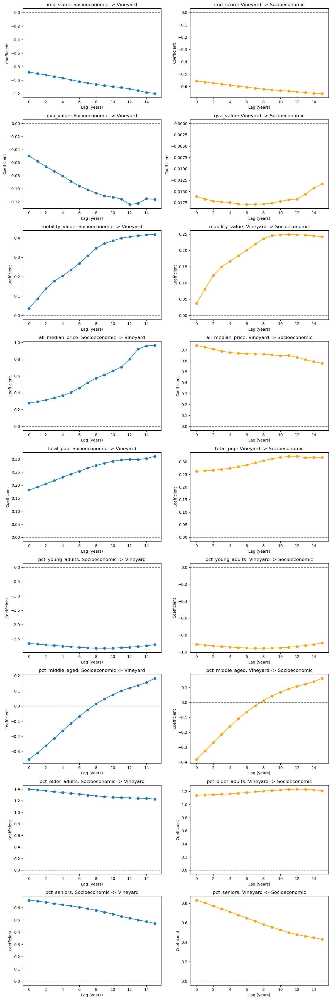

In [486]:
# --- PREPARATION ---

# 1. Create a binary vineyard presence variable
lag_df = lagged_df.copy()
lag_df['vineyard_present'] = (lag_df['vineyard_area'] > 0).astype(int)

# 2. Variables to test
socioeconomic_vars = ['imd_score', 'gva_value', 'mobility_value', 'all_median_price', 'total_pop', 
                      #'pct_kids', 
                      'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors',
                      #'D_median_price', 'F_median_price', 'O_median_price', 'S_median_price', 'T_median_price'
                     ]

# 3. Define lags to test
lags = list(range(0, 16))  # 0 to 15 years

# 4. Store results
results_forward = {var: [] for var in socioeconomic_vars}  # socio -> vineyard
results_reverse = {var: [] for var in socioeconomic_vars}  # vineyard -> socio

# --- FORWARD TEST (Socioeconomic conditions -> Vineyard Presence) ---

for var in socioeconomic_vars:
    for lag in lags:
        df_sorted = lag_df.sort_values(by=['LSOA11CD', 'year']).copy()
        df_sorted[f'{var}_lag{lag}'] = df_sorted.groupby('LSOA11CD')[var].shift(lag)
        
        df_model = df_sorted[[f'{var}_lag{lag}', 'vineyard_present']].dropna()
        
        X = sm.add_constant(df_model[f'{var}_lag{lag}'])
        y = df_model['vineyard_present']
        
        model = sm.Logit(y, X).fit(disp=0)
        
        coef = model.params.iloc[1]
        pval = model.pvalues.iloc[1]
        results_forward[var].append((coef, pval))

# --- REVERSE TEST (Vineyard Presence -> Socioeconomic change) ---

for var in socioeconomic_vars:
    for lag in lags:
        df_sorted = lag_df.sort_values(by=['LSOA11CD', 'year']).copy()
        df_sorted[f'vineyard_present_lag{lag}'] = df_sorted.groupby('LSOA11CD')['vineyard_present'].shift(-lag)
        
        df_model = df_sorted[[var, f'vineyard_present_lag{lag}']].dropna()
        
        X = sm.add_constant(df_model[f'vineyard_present_lag{lag}'])
        y = df_model[var]
        
        model = sm.OLS(y, X).fit()
        
        coef = model.params.iloc[1]
        pval = model.pvalues.iloc[1]
        results_reverse[var].append((coef, pval))

# --- VISUALISE RESULTS ---

fig, axs = plt.subplots(len(socioeconomic_vars), 2, figsize=(12, 4 * len(socioeconomic_vars)))

for i, var in enumerate(socioeconomic_vars):
    coefs_forward = [res[0] for res in results_forward[var]]
    coefs_reverse = [res[0] for res in results_reverse[var]]

    axs[i, 0].plot(lags, coefs_forward, marker='o')
    axs[i, 0].set_title(f'{var}: Socioeconomic -> Vineyard')
    axs[i, 0].set_xlabel('Lag (years)')
    axs[i, 0].set_ylabel('Coefficient')
    axs[i, 0].axhline(0, color='grey', linestyle='--')

    axs[i, 1].plot(lags, coefs_reverse, marker='o', color='orange')
    axs[i, 1].set_title(f'{var}: Vineyard -> Socioeconomic')
    axs[i, 1].set_xlabel('Lag (years)')
    axs[i, 1].set_ylabel('Coefficient')
    axs[i, 1].axhline(0, color='grey', linestyle='--')

plt.tight_layout()
plt.show()

---

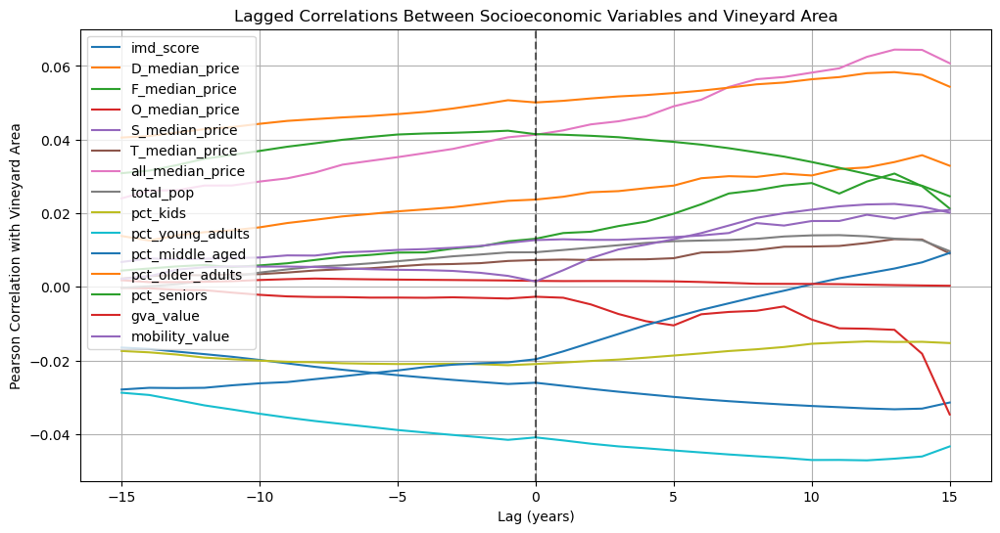

In [464]:
## vineyard area as dependent variable

plt.figure(figsize=(12, 6))
for var in lag_correlation_df.columns:
    plt.plot(lag_correlation_df.index, lag_correlation_df[var], label=var)

plt.axvline(0, color='black', linestyle='--', alpha=0.6)
plt.xlabel('Lag (years)')
plt.ylabel('Pearson Correlation with Vineyard Area')
plt.title('Lagged Correlations Between Socioeconomic Variables and Vineyard Area')
plt.legend()
plt.grid(True)
plt.show()

In [465]:
results_r2 = {}
results_coefs = {var: [] for var in ['imd_score', 'all_median_price', 'gva_value', 'mobility_value']}

for lag in range(1, 21):
    # Define formula
    formula = f"vineyard_area ~ imd_score_lag{lag} + all_median_price_lag{lag} + gva_value_lag{lag} + mobility_value_lag{lag} + C(year)"

    # Ensure no NaNs in relevant cols
    required_cols = [f'{var}_lag{lag}' for var in results_coefs] + ['vineyard_area', 'year']
    df_lagged = regression_df.dropna(subset=required_cols)

    # Run model
    model = smf.ols(formula=formula, data=df_lagged).fit()
    results_r2[lag] = model.rsquared

    # Store coefficients
    for var in results_coefs:
        coef = model.params.get(f'{var}_lag{lag}', None)
        results_coefs[var].append(coef)

KeyError: ['imd_score_lag1', 'all_median_price_lag1', 'gva_value_lag1', 'mobility_value_lag1']

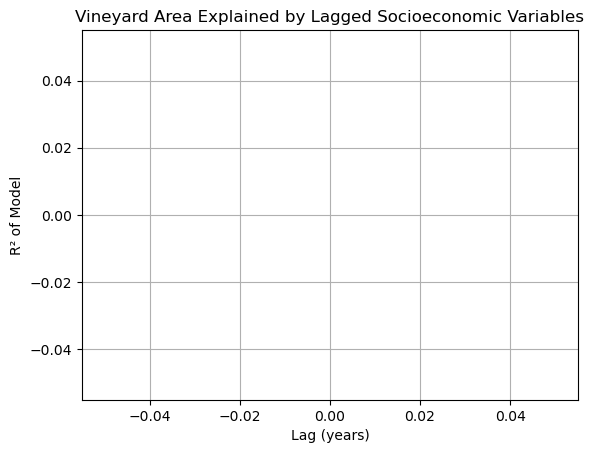

In [466]:
plt.plot(list(results_r2.keys()), list(results_r2.values()), marker='o')
plt.xlabel("Lag (years)")
plt.ylabel("R² of Model")
plt.title("Vineyard Area Explained by Lagged Socioeconomic Variables")
plt.grid(True)
plt.show()

ValueError: x and y must have same first dimension, but have shapes (20,) and (0,)

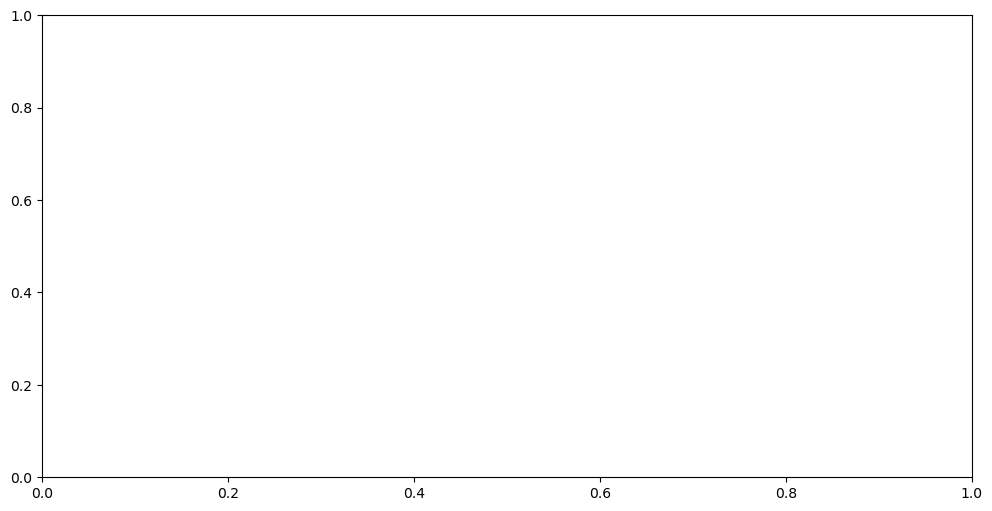

In [467]:
plt.figure(figsize=(12, 6))
for var, coefs in results_coefs.items():
    plt.plot(range(1, 21), coefs, label=var)

plt.xlabel("Lag (years)")
plt.ylabel("Coefficient Estimate")
plt.title("Lagged Regression Coefficients on Vineyard Area")
plt.axhline(0, color='black', linestyle='--', alpha=0.6)
plt.legend()
plt.grid(True)
plt.show()

In [468]:
print(regression_df.columns.tolist())

['LSOA11CD', 'LSOA11NM', 'BNG_E', 'BNG_N', 'LONG_', 'LAT', 'Shape_Leng', 'GlobalID', 'geometry', 'year', 'vineyard_count', 'vineyard_area', 'imd_score', 'D_median_price', 'F_median_price', 'O_median_price', 'S_median_price', 'T_median_price', 'all_median_price', 'total_pop', 'pct_kids', 'pct_young_adults', 'pct_middle_aged', 'pct_older_adults', 'pct_seniors', 'gva_value', 'mobility_value', 'log_vineyard_area', 'residuals']


In [469]:
## vineyard area as explanatory variable

# lag vineyard area
for lag in range(1, 21):
    regression_df[f'vineyard_area_lag{lag}'] = (
        regression_df.groupby('LSOA11CD')['vineyard_area'].shift(lag)
    )

# run regressions
results_imd = {}
for lag in range(1, 21):
    model = smf.ols(
        formula=f'imd_score ~ vineyard_area_lag{lag} + C(year)',
        data=regression_df.dropna()
    ).fit()
    results_imd[lag] = model.rsquared
    
# plot
plt.plot(list(results_imd.keys()), list(results_imd.values()))
plt.xlabel("Lag (years)")
plt.ylabel("Model R²")
plt.title("Explaining Socioeconomic Variables from Lagged Vineyard Area")
plt.show()


C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\aaron\anaconda3\envs\urbsim\Lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

ValueError: negative dimensions are not allowed